In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt


In [2]:
reader = pd.read_csv('data.csv')
population_data = pd.read_csv(r'sub-est2019_all.csv', encoding='latin-1')

In [3]:
reader = reader[reader['Core Based Statistical Area'].notna()]
population_data = population_data[['NAME','STNAME','POPESTIMATE2010']]

In [4]:
lst = []
city_lst = reader['Core Based Statistical Area'].unique()

for i in range(city_lst.shape[0]):
    s = city_lst[i].split(', ')[1]
    if len(s)==2:
        if s not in lst:
            lst.append(s)
            
lst = np.asarray(lst)
print(lst)
print(len(lst))

['SD' 'OH' 'GA' 'NY' 'NM' 'PA' 'AK' 'MI' 'WI' 'NC' 'NJ' 'ME' 'TX' 'CA'
 'MD' 'MA' 'LA' 'WA' 'VT' 'MT' 'AL' 'ND' 'CO' 'CT' 'FL' 'WV' 'SC' 'WY'
 'IA' 'IL' 'DE' 'AR' 'KY' 'OR' 'AZ' 'IN' 'HI' 'NH' 'TN' 'NV' 'NE' 'OK'
 'UT' 'VA' 'MN' 'PR' 'MO' 'KS']
48


In [5]:
states = lst

In [6]:
states_lst = pd.read_csv('50_us_states_all_data.csv',header=None)
states_lst = np.asarray(states_lst.drop([0,3],axis=1))
state_dict = {}
for i in range(len(states_lst)):
    state_dict[states_lst[i][1]]= states_lst[i][0]
state_dict

{'AL': 'Alabama',
 'AK': 'Alaska',
 'AZ': 'Arizona',
 'AR': 'Arkansas',
 'CA': 'California',
 'CO': 'Colorado',
 'CT': 'Connecticut',
 'DE': 'Delaware',
 'FL': 'Florida',
 'GA': 'Georgia',
 'HI': 'Hawaii',
 'ID': 'Idaho',
 'IL': 'Illinois',
 'IN': 'Indiana',
 'IA': 'Iowa',
 'KS': 'Kansas',
 'KY': 'Kentucky',
 'LA': 'Louisiana',
 'ME': 'Maine',
 'MD': 'Maryland',
 'MA': 'Massachusetts',
 'MI': 'Michigan',
 'MN': 'Minnesota',
 'MS': 'Mississippi',
 'MO': 'Missouri',
 'MT': 'Montana',
 'NE': 'Nebraska',
 'NV': 'Nevada',
 'NH': 'New Hampshire',
 'NJ': 'New Jersey',
 'NM': 'New Mexico',
 'NY': 'New York',
 'NC': 'North Carolina',
 'ND': 'North Dakota',
 'OH': 'Ohio',
 'OK': 'Oklahoma',
 'OR': 'Oregon',
 'PA': 'Pennsylvania',
 'RI': 'Rhode Island',
 'SC': 'South Carolina',
 'SD': 'South Dakota',
 'TN': 'Tennessee',
 'TX': 'Texas',
 'UT': 'Utah',
 'VT': 'Vermont',
 'VA': 'Virginia',
 'WA': 'Washington',
 'WV': 'West Virginia',
 'WI': 'Wisconsin',
 'WY': 'Wyoming'}

In [7]:
pol = reader.groupby('Pollutant')
pol.head()

,CBSA,Core Based Statistical Area,Pollutant,Trend Statistic,Number of Trend Sites,1990,1991,1992,1993,1994,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,10100,"Aberdeen, SD",PM2.5,Weighted Annual Mean,1.0,NaN,NaN,NaN,NaN,NaN,...,8.100,8.700,7.100,7.500,7.300,6.200,6.200,5.400,5.800,6.600
2,10420,"Akron, OH",CO,2nd Max,1.0,5.700,3.300,4.100,3.100,5.300,...,1.800,1.400,1.000,1.100,0.800,0.800,1.000,1.100,0.900,1.800
7,10500,"Albany, GA",PM2.5,Weighted Annual Mean,1.0,NaN,NaN,NaN,NaN,NaN,...,11.800,12.300,12.100,10.600,10.000,10.300,9.000,8.700,9.400,8.400
9,10580,"Albany-Schenectady-Troy, NY",O3,4th Max,2.0,0.086,0.086,0.086,0.082,0.080,...,0.066,0.072,0.066,0.071,0.063,0.061,0.062,0.068,0.061,0.066
12,10740,"Albuquerque, NM",CO,2nd Max,1.0,5.100,5.500,4.400,5.000,4.500,...,1.100,1.100,1.300,1.600,0.900,1.200,1.400,1.200,1.000,1.000
19,10900,"Allentown-Bethlehem-Easton, PA-NJ",O3,4th Max,1.0,0.093,0.098,0.078,0.082,0.084,...,0.069,0.080,0.079,0.075,0.068,0.068,0.070,0.071,0.067,0.067
22,11020,"Altoona, PA",O3,4th Max,1.0,0.081,0.092,0.079,0.086,0.092,...,0.065,0.072,0.074,0.080,0.065,0.060,0.069,0.062,0.063,0.063
24,11140,"Americus, GA",O3,4th Max,1.0,0.082,0.082,0.081,0.080,0.076,...,0.060,0.069,0.066,0.065,0.060,0.059,0.057,0.065,0.058,0.062
25,11260,"Anchorage, AK",CO,2nd Max,1.0,9.700,8.400,10.800,9.700,8.600,...,4.400,3.800,3.600,4.300,3.100,2.500,2.800,3.000,3.500,2.700
28,11460,"Ann Arbor, MI",PM2.5,Weighted Annual Mean,1.0,NaN,NaN,NaN,NaN,NaN,...,9.900,9.200,9.600,9.100,8.600,9.700,9.400,7.900,8.000,8.300


In [8]:
def pol_data(Pollutant,state,plot = False):
    poll = pol.get_group(Pollutant)
    poll = poll.drop(["Trend Statistic","CBSA","Number of Trend Sites"],axis = 1)
    poll = poll.dropna()
    mega_list = poll['Core Based Statistical Area']
    mega_list = mega_list.values.tolist()
    mega_list = [x for x in mega_list if str(x) != 'nan']
    for i in range(len(mega_list)):
        mega_list[i] = mega_list[i][-2:]
    mega_list2 = []
    for i in range(len(mega_list)):
        if mega_list[i] !=  state:
            mega_list2.append(i)

    poll = poll.reset_index()
    poll_st = poll.drop(mega_list2,axis=0)
    #print(O3_st)
    #print(np.asarray(poll_st).shape)
    
    
    #if plot and np.asarray(poll_st).shape[0] != 0:
     #   poll_st_1 = poll_st.drop(['index','Pollutant'],axis=1)
      #  poll_st_1 = poll_st_1.set_index('Core Based Statistical Area').T
       # poll_st_1.plot.line(figsize=(17,8))
        
    return poll_st

In [9]:
#population_data = pd.read_csv(r'sub-est2019_all.csv', encoding='latin-1')
#population_data = population_data[['NAME','STNAME','POPESTIMATE2010']]

def max_pop_city(data,state,population_data):
    state_lst = data['Core Based Statistical Area']
    state_lst = np.asarray(state_lst)
    #print(state_lst)
    for i in range(state_lst.shape[0]):
        state_lst[i] = state_lst[i][0:-4]
    #print(state_lst)
    population_data = population_data[['NAME','STNAME','POPESTIMATE2010']]
    population_data_ohio = population_data.loc[population_data['STNAME'] == state_dict[state]]
    population_data_ohio = population_data_ohio.drop(['STNAME'],axis=1)
    population_data_ohio = population_data_ohio.sort_values(by='POPESTIMATE2010',ascending=False)
    population_data_ohio = population_data_ohio.reindex()
    np_data = np.asarray(population_data_ohio)
    max_pop = 0
    state_max_pop = ''
    for i in range(state_lst.shape[0]):
        for j in range(np_data.shape[0]):

            if state_lst[i] in np_data[j][0]:

                if np_data[j][1] > max_pop:
                    state_max_pop = state_lst[i]
                break
    #state_max_pop = state_max_pop + ', '+str(state)
    df = data.loc[data['Core Based Statistical Area'] == state_max_pop]
    df = df.drop(['1990','1991','1992','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018'],axis=1)
    #print(df)
    return df

In [10]:
city_pollution_data = pol_data('O3','OH',plot = True)

print(city_pollution_data)
if city_pollution_data is not None and city_pollution_data.shape[0]>1:
    city_pollution_data  = max_pop_city(city_pollution_data ,'OH',population_data)
    
print(city_pollution_data)
#This city_pol_data is the pollution data of a particular pollutant for a state

    index   Core Based Statistical Area Pollutant   1990   1991   1992   1993  \
5      35                 Ashtabula, OH        O3  0.084  0.097  0.086  0.086   
14    118          Canton-Massillon, OH        O3  0.088  0.091  0.079  0.090   
21    196                    Dayton, OH        O3  0.074  0.094  0.071  0.076   
36    342  Huntington-Ashland, WV-KY-OH        O3  0.091  0.089  0.076  0.093   
53    449                  Marietta, OH        O3  0.085  0.102  0.086  0.101   
59    498              Mount Vernon, OH        O3  0.085  0.090  0.085  0.096   
94    758               Springfield, OH        O3  0.093  0.096  0.081  0.083   
97    800                    Toledo, OH        O3  0.088  0.088  0.080  0.089   

     1994   1995   1996  ...   2009   2010   2011   2012   2013   2014   2015  \
5   0.085  0.092  0.075  ...  0.075  0.083  0.077  0.079  0.070  0.069  0.070   
14  0.084  0.093  0.085  ...  0.064  0.079  0.079  0.074  0.069  0.063  0.070   
21  0.087  0.087  0.086  ..

In [11]:
data = pd.read_sas('lung_data_feb16_d080516.sas7bdat',format= None, index=None, encoding=None, chunksize=None, iterator=False)

In [12]:
st_num = {}

st_num[1]="Alabama"
st_num[2]="Alaska"
st_num[4]="Arizona"
st_num[5]="Arkansas"
st_num[6]="California"
st_num[8]="Colorado"
st_num[9]="Connecticut"
st_num[10]="Delaware"
st_num[11]="District Of Columbia"
st_num[12]="Florida"
st_num[13]="Georgia"
st_num[15]="Hawaii"
st_num[16]="Idaho"
st_num[17]="Illinois"
st_num[18]="Indiana"
st_num[19]="Iowa"
st_num[20]="Kansas"
st_num[21]="Kentucky"
st_num[22]="Louisiana"
st_num[23]="Maine"
st_num[24]="Maryland"
st_num[25]="Massachusetts"
st_num[26]="Michigan"
st_num[27]="Minnesota"
st_num[28]="Mississippi"
st_num[29]="Missouri"
st_num[30]="Montana"
st_num[31]="Nebraska"
st_num[32]="Nevada"
st_num[33]="New Hampshire"
st_num[34]="New Jersey"
st_num[35]="New Mexico"
st_num[36]="New York"
st_num[37]="North Carolina"
st_num[38]="North Dakota"
st_num[39]="Ohio"
st_num[40]="Oklahoma"
st_num[41]="Oregon"
st_num[42]="Pennsylvania"
st_num[44]="Rhode Island"
st_num[45]="South Carolina"
st_num[46]="South Dakota"
st_num[47]="Tennessee"
st_num[48]="Texas"
st_num[49]="Utah"
st_num[50]="Vermont"
st_num[51]="Virginia"
st_num[53]="Washington"
st_num[54]="st_num["
st_num[55]="Wisconsin"
st_num[56]="Wyoming"
st_num[57]="Puerto Rico"
st_num[58]="U.S. Territories"

In [13]:
def get_key(val): 
    for key, value in st_num.items(): 
         if val == value:
                return key 

In [14]:

poll_list = ['O3','PM2.5','PM10','Pb','CO','NO2','SO2']
states = [s for s in states if s in state_dict.keys()]
states.sort()

State : AK
Pollutant : O3
Status : 
Data Not available!!
State : AK
Pollutant : PM2.5
Status : 
Data Not available!!
State : AK
Pollutant : PM10
Status : 
Group(k) : 2


C:\Users\91934\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


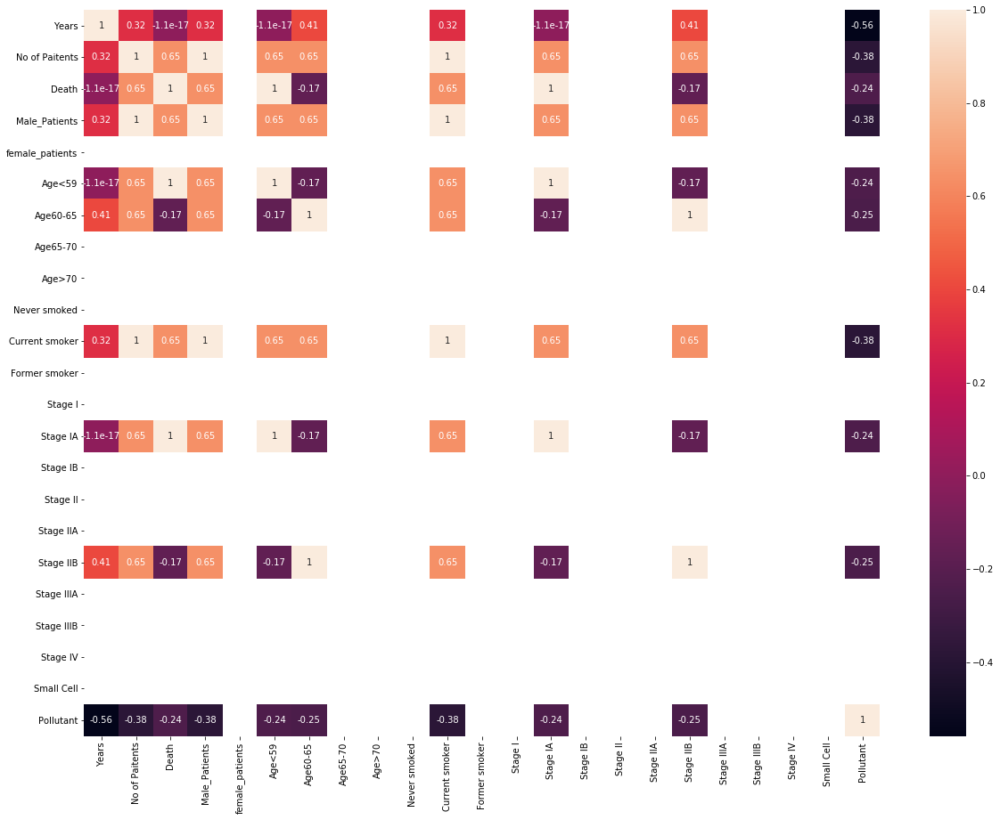

State : AK
Pollutant : Pb
Status : 
Data Not available!!
State : AK
Pollutant : CO
Status : 
Group(k) : 2


C:\Users\91934\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


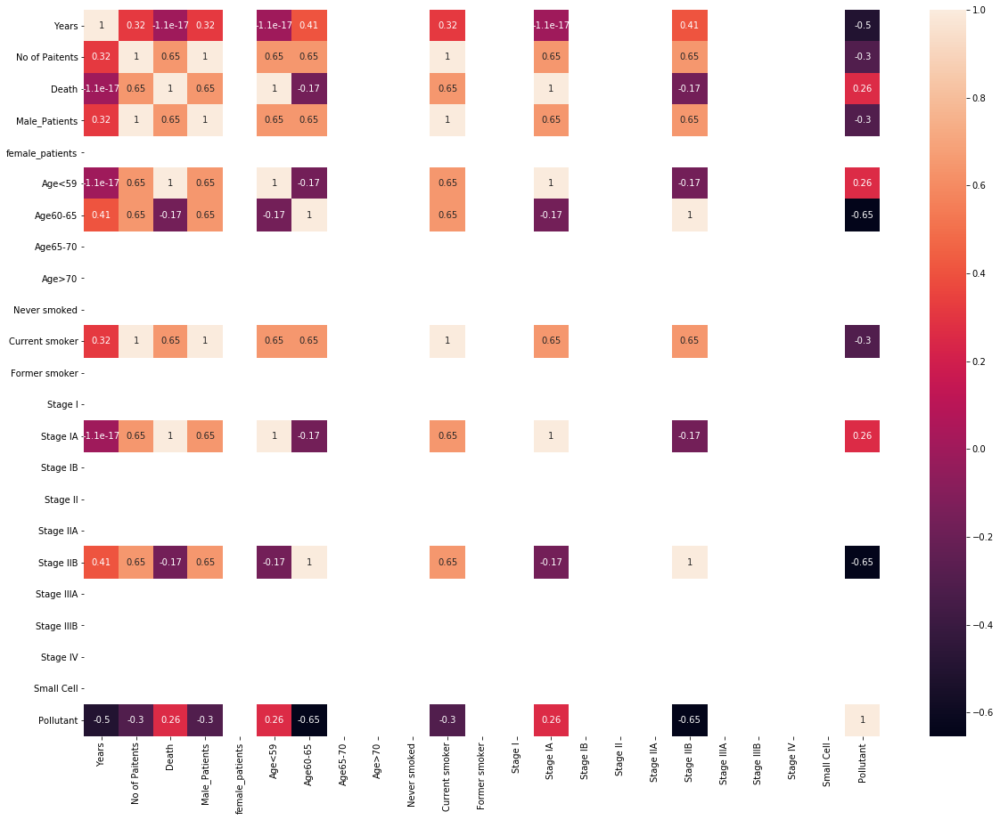

State : AK
Pollutant : NO2
Status : 
Data Not available!!
State : AK
Pollutant : SO2
Status : 
Data Not available!!
State : AL
Pollutant : O3
Status : 
Group(k) : 1


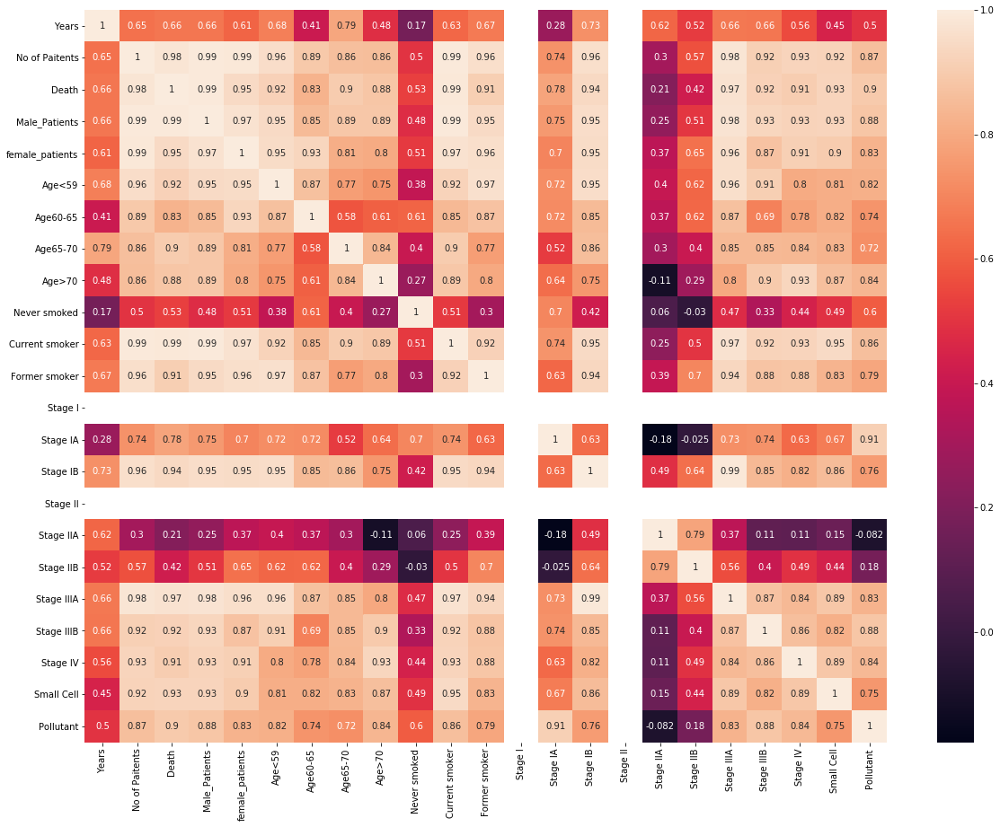

State : AL
Pollutant : PM2.5
Status : 
Data Not available!!
State : AL
Pollutant : PM10
Status : 
Data Not available!!
State : AL
Pollutant : Pb
Status : 
Data Not available!!
State : AL
Pollutant : CO
Status : 
Group(k) : 1


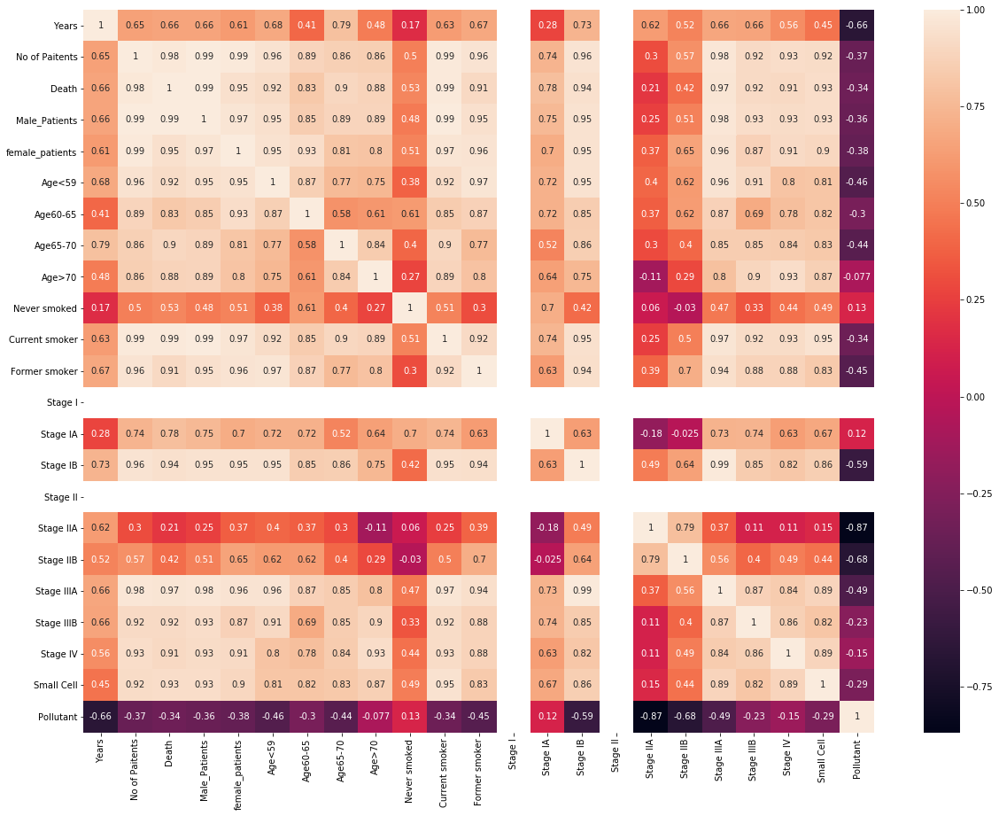

State : AL
Pollutant : NO2
Status : 
Data Not available!!
State : AL
Pollutant : SO2
Status : 
Data Not available!!
State : AR
Pollutant : O3
Status : 
Group(k) : 5


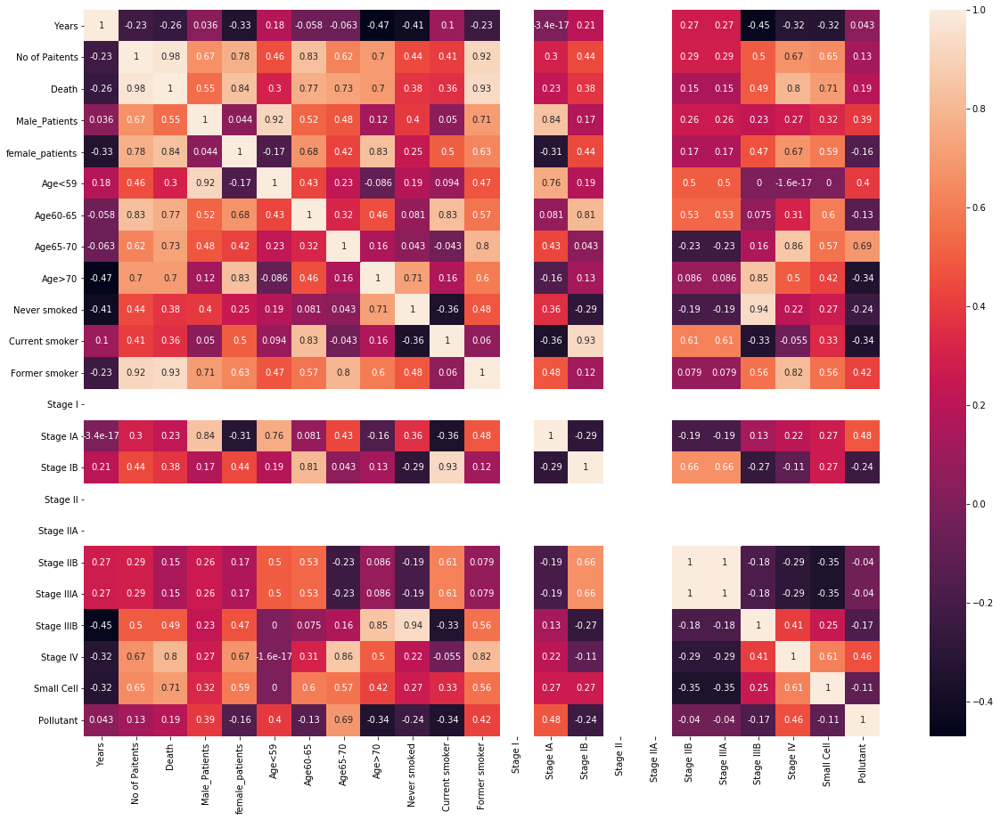

State : AR
Pollutant : PM2.5
Status : 
Data Not available!!
State : AR
Pollutant : PM10
Status : 
Data Not available!!
State : AR
Pollutant : Pb
Status : 
Data Not available!!
State : AR
Pollutant : CO
Status : 
Group(k) : 5


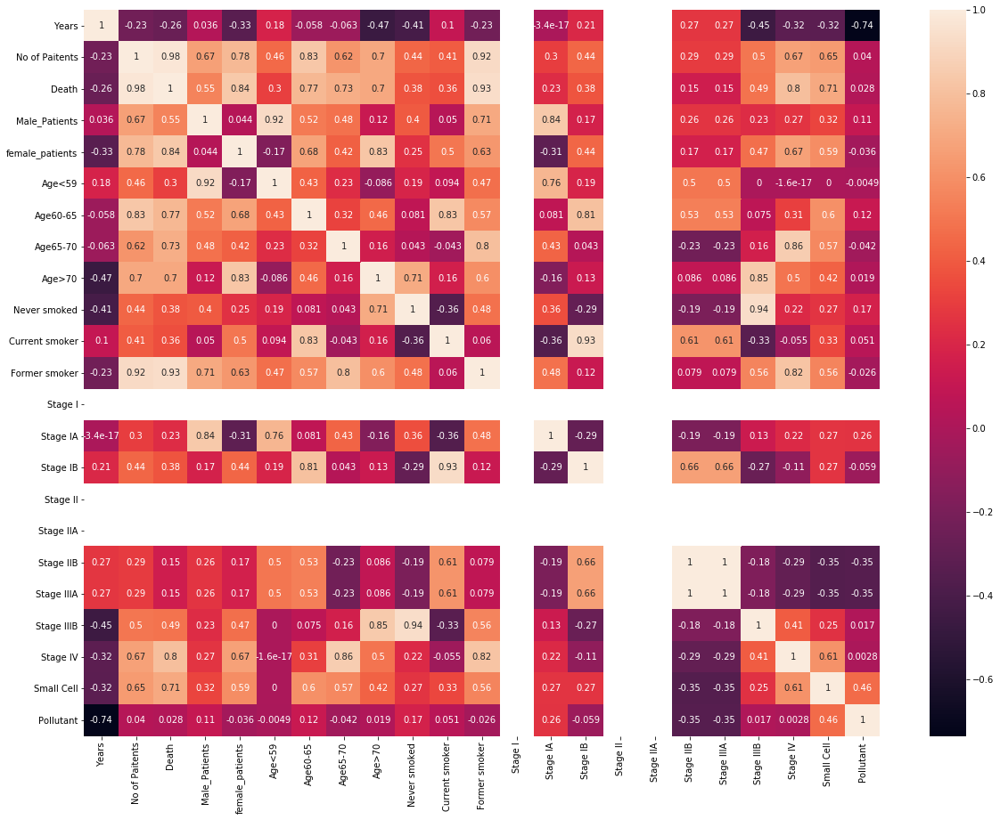

State : AR
Pollutant : NO2
Status : 
Data Not available!!
State : AR
Pollutant : SO2
Status : 
Group(k) : 5


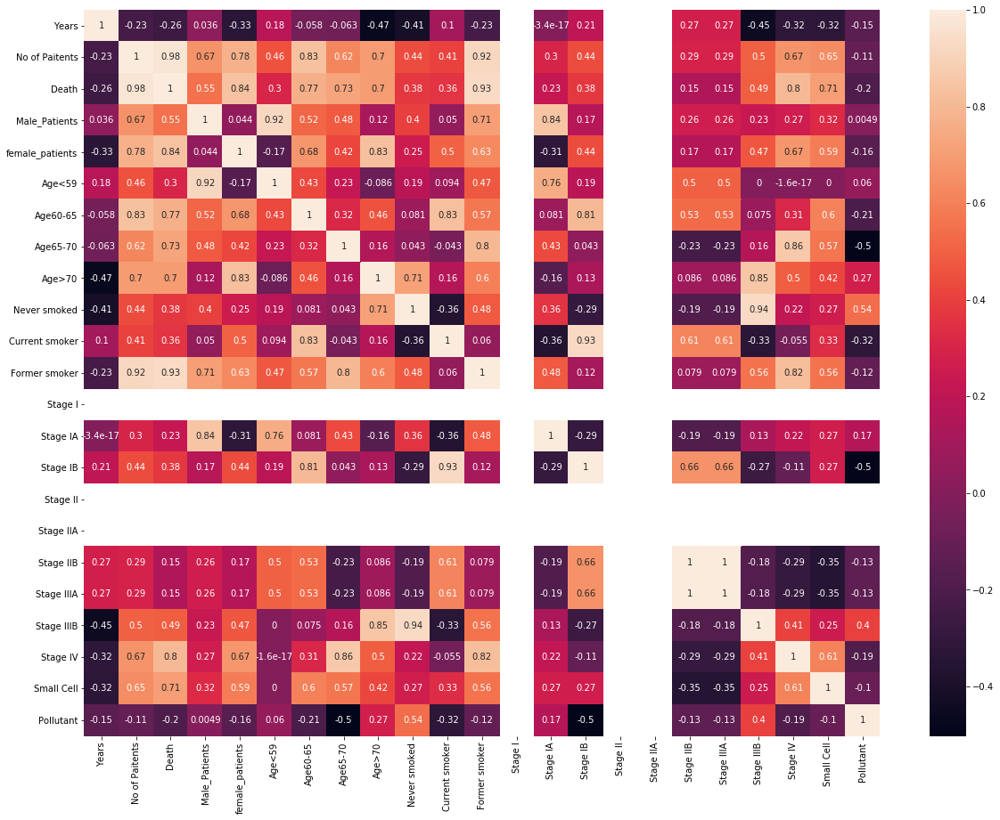

State : AZ
Pollutant : O3
Status : 
Group(k) : 4


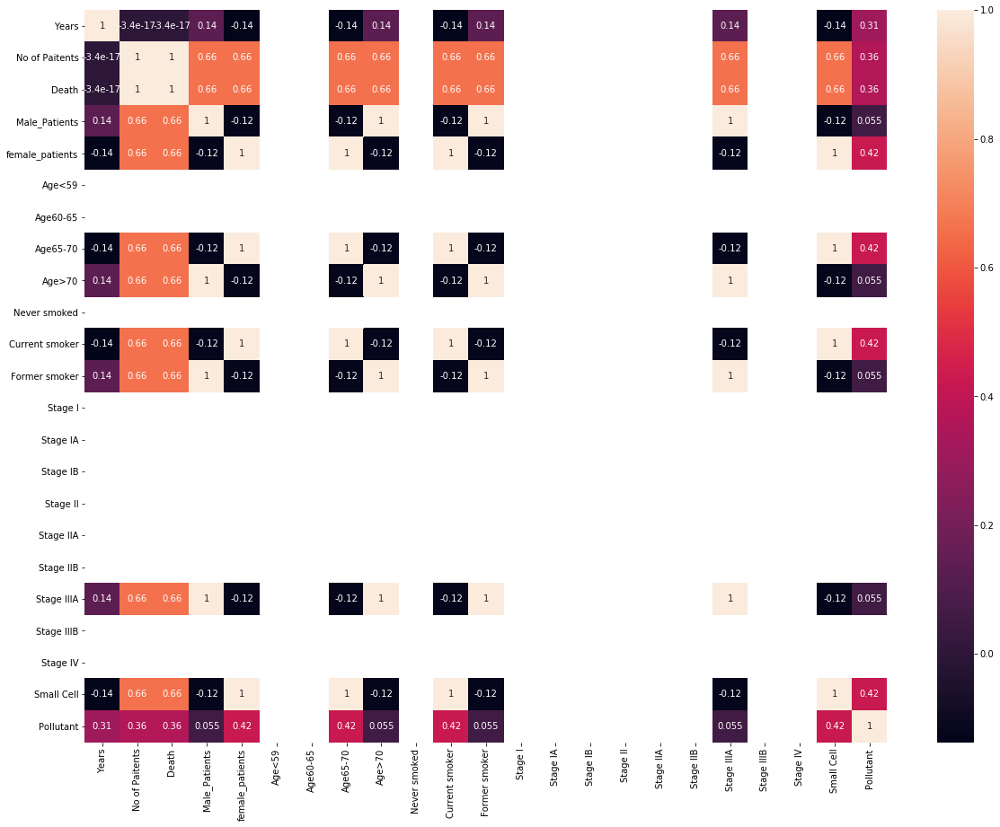

State : AZ
Pollutant : PM2.5
Status : 
Data Not available!!
State : AZ
Pollutant : PM10
Status : 
Data Not available!!
State : AZ
Pollutant : Pb
Status : 
Data Not available!!
State : AZ
Pollutant : CO
Status : 
Group(k) : 4


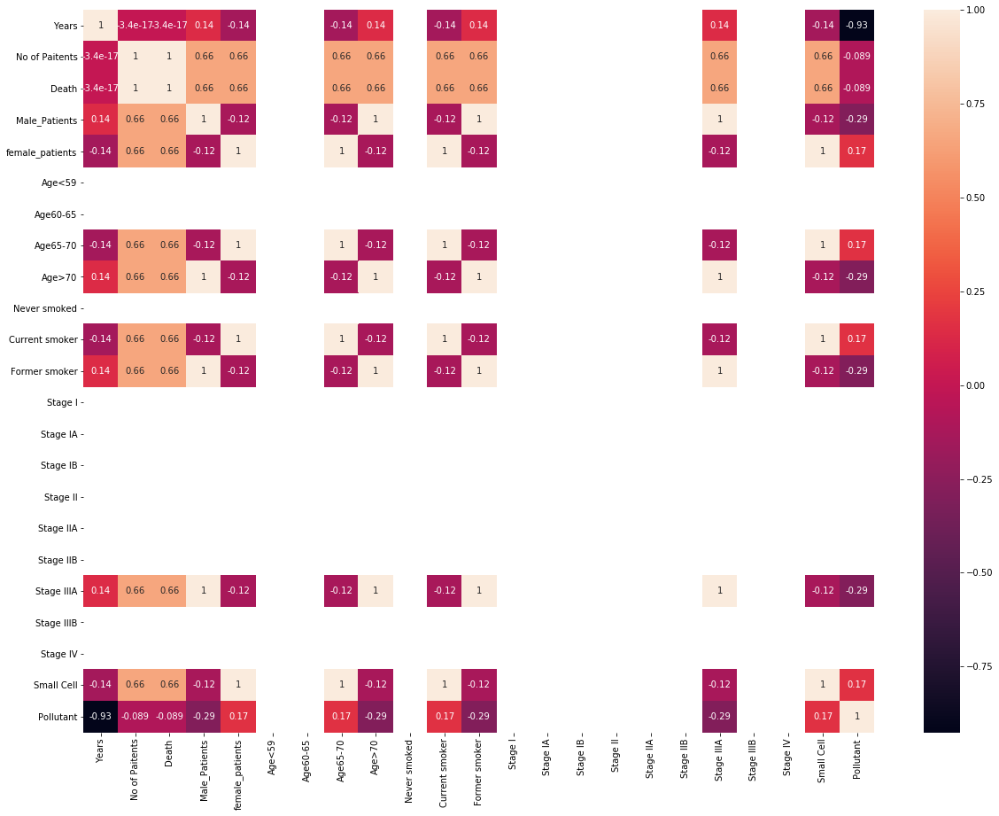

State : AZ
Pollutant : NO2
Status : 
Data Not available!!
State : AZ
Pollutant : SO2
Status : 
Data Not available!!
State : CA
Pollutant : O3
Status : 
Group(k) : 6


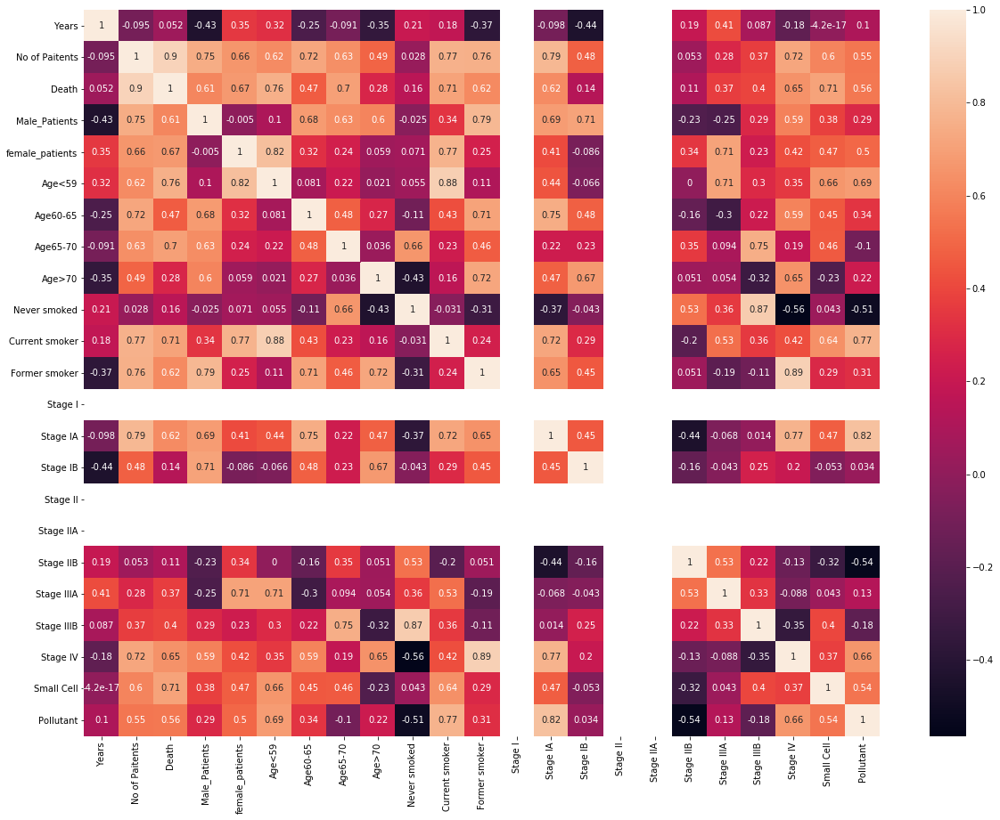

State : CA
Pollutant : PM2.5
Status : 
Data Not available!!
State : CA
Pollutant : PM10
Status : 
Data Not available!!
State : CA
Pollutant : Pb
Status : 
Data Not available!!
State : CA
Pollutant : CO
Status : 
Group(k) : 6


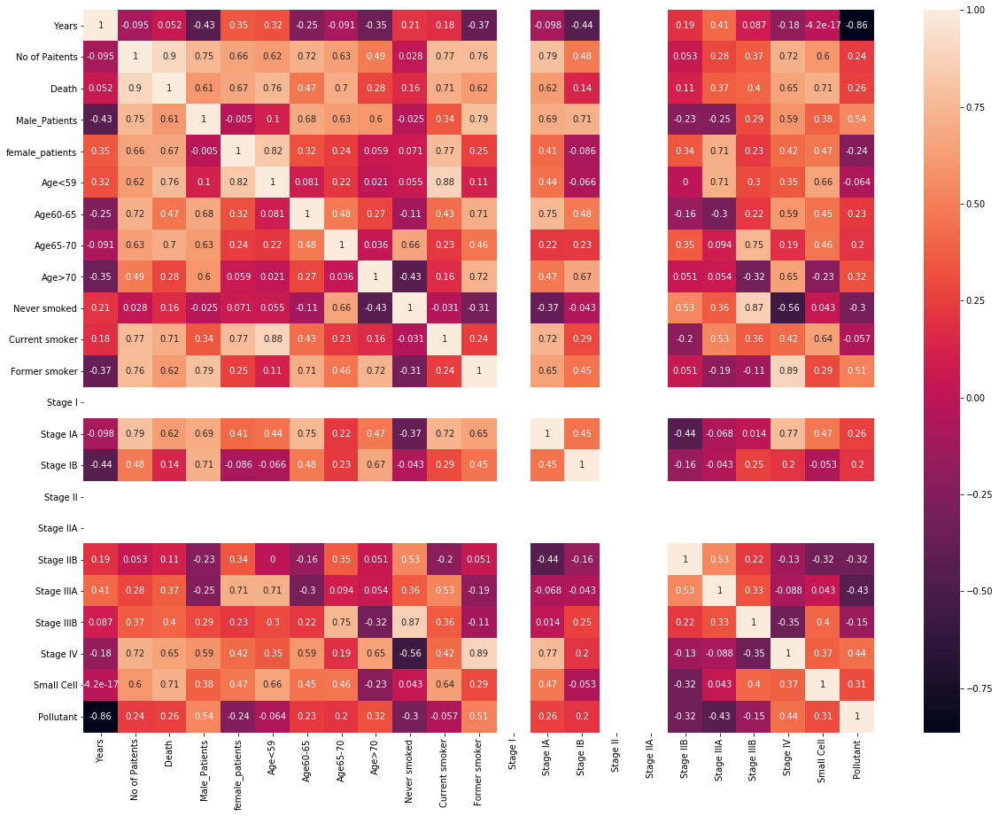

State : CA
Pollutant : NO2
Status : 
Group(k) : 6


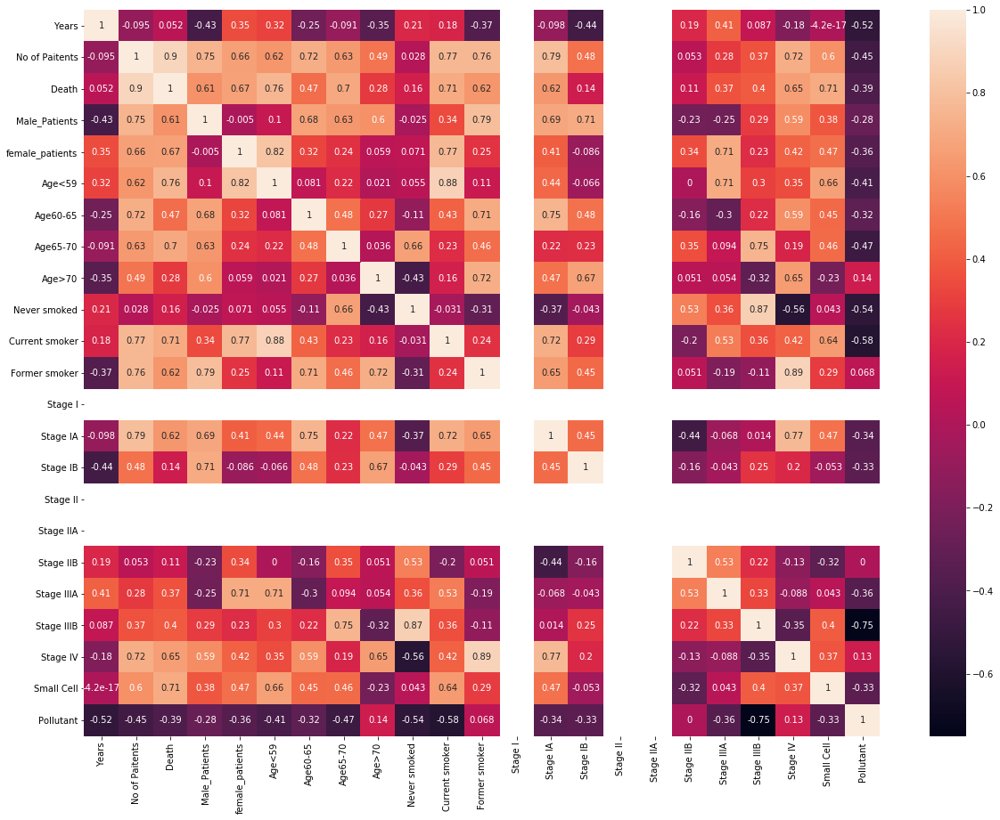

State : CA
Pollutant : SO2
Status : 
Data Not available!!
State : CO
Pollutant : O3
Status : 
Data Not available!!
State : CO
Pollutant : PM2.5
Status : 
Data Not available!!
State : CO
Pollutant : PM10
Status : 
Group(k) : 8


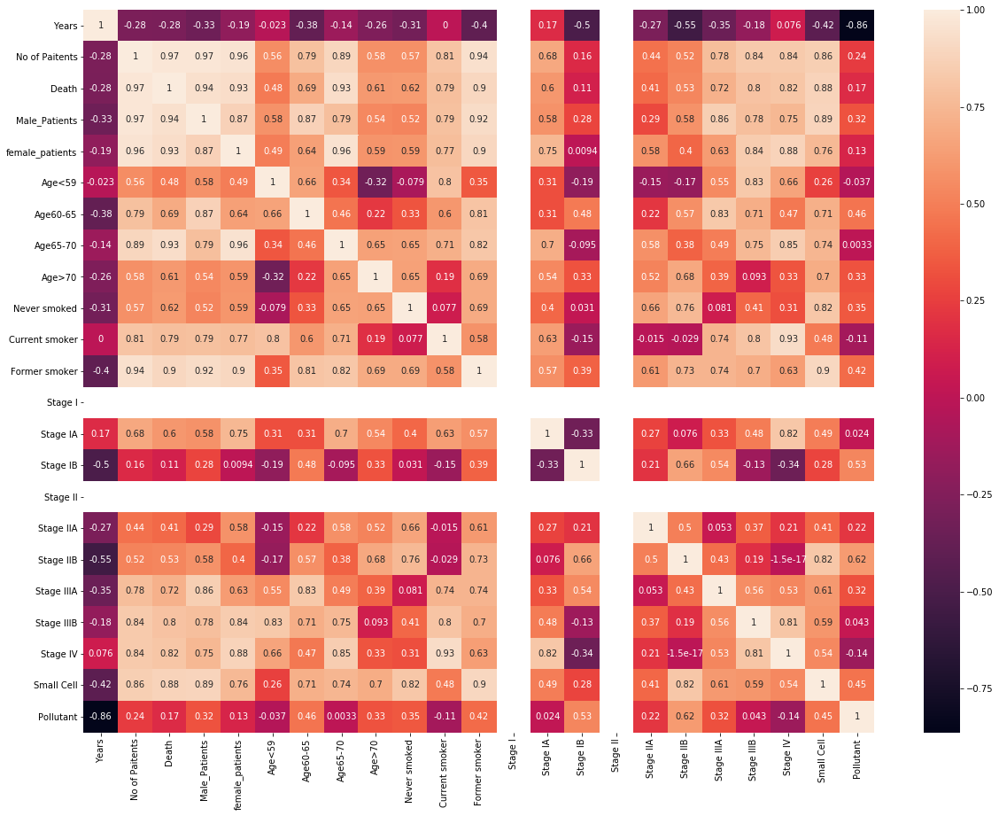

State : CO
Pollutant : Pb
Status : 
Data Not available!!
State : CO
Pollutant : CO
Status : 
Group(k) : 8


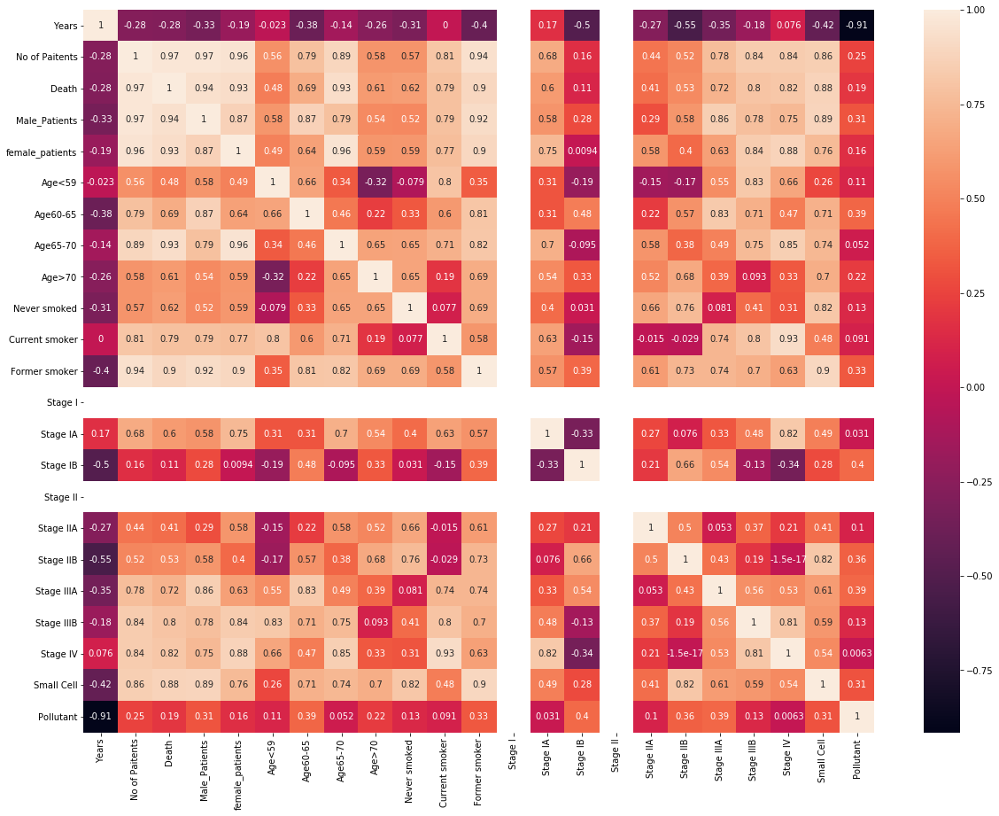

State : CO
Pollutant : NO2
Status : 
Group(k) : 8


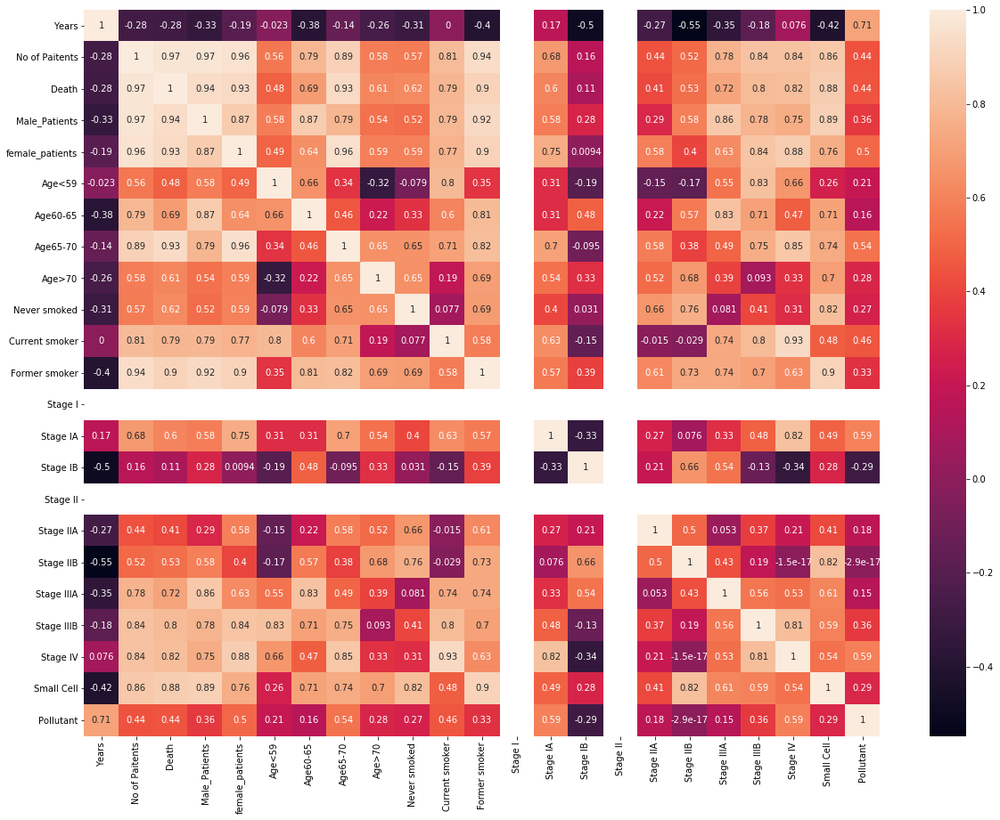

State : CO
Pollutant : SO2
Status : 
Data Not available!!
State : CT
Pollutant : O3
Status : 
Data Not available!!
State : CT
Pollutant : PM2.5
Status : 
Data Not available!!
State : CT
Pollutant : PM10
Status : 
Data Not available!!
State : CT
Pollutant : Pb
Status : 
Data Not available!!
State : CT
Pollutant : CO
Status : 
Data Not available!!
State : CT
Pollutant : NO2
Status : 
Group(k) : 9


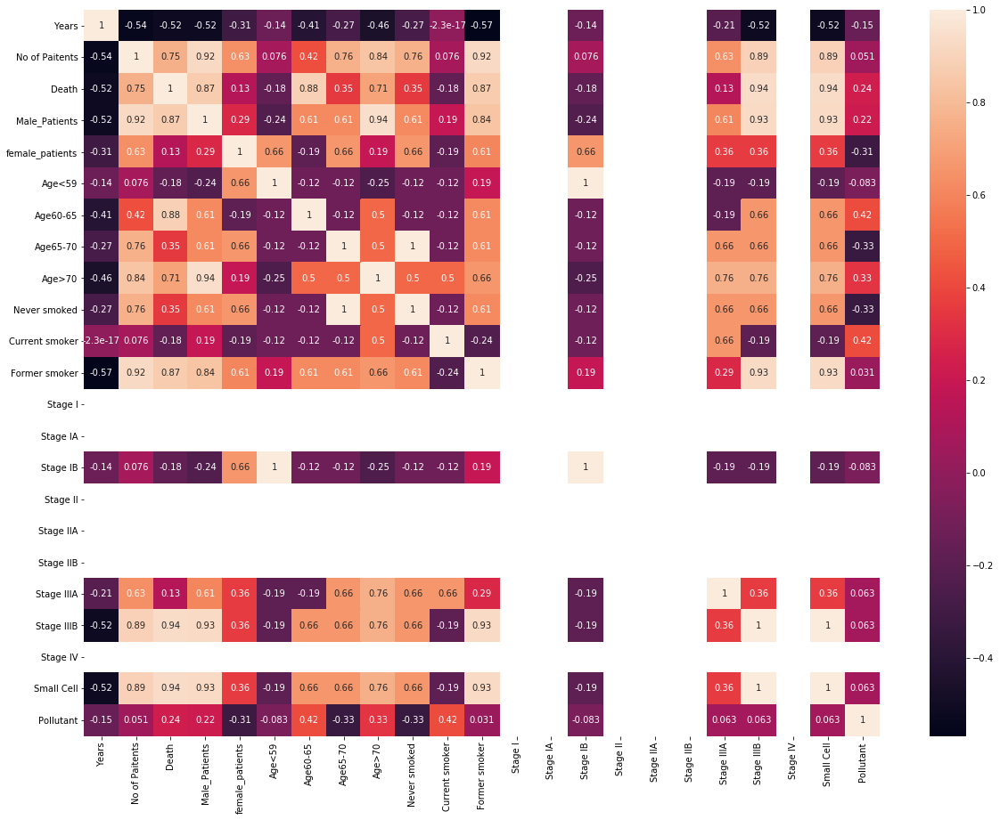

State : CT
Pollutant : SO2
Status : 
Data Not available!!
State : DE
Pollutant : O3
Status : 
Group(k) : 10


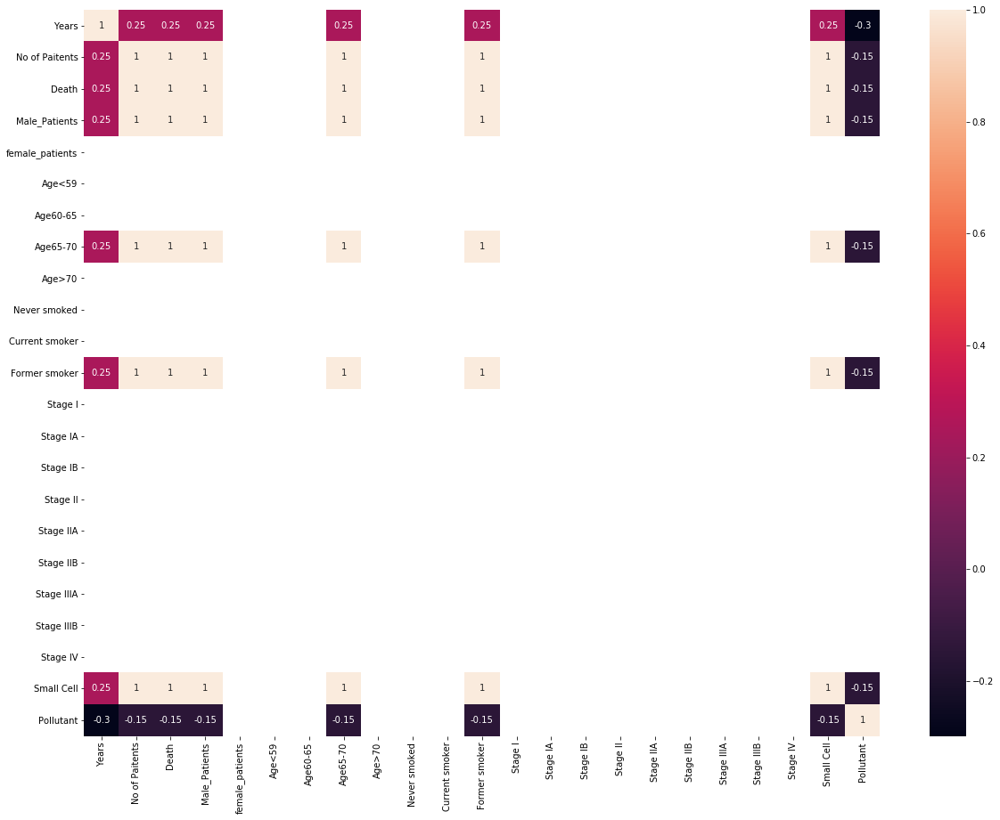

State : DE
Pollutant : PM2.5
Status : 
Data Not available!!
State : DE
Pollutant : PM10
Status : 
Data Not available!!
State : DE
Pollutant : Pb
Status : 
Data Not available!!
State : DE
Pollutant : CO
Status : 
Data Not available!!
State : DE
Pollutant : NO2
Status : 
Data Not available!!
State : DE
Pollutant : SO2
Status : 
Data Not available!!
State : FL
Pollutant : O3
Status : 
Data Not available!!
State : FL
Pollutant : PM2.5
Status : 
Data Not available!!
State : FL
Pollutant : PM10
Status : 
Data Not available!!
State : FL
Pollutant : Pb
Status : 
Data Not available!!
State : FL
Pollutant : CO
Status : 
Group(k) : 12


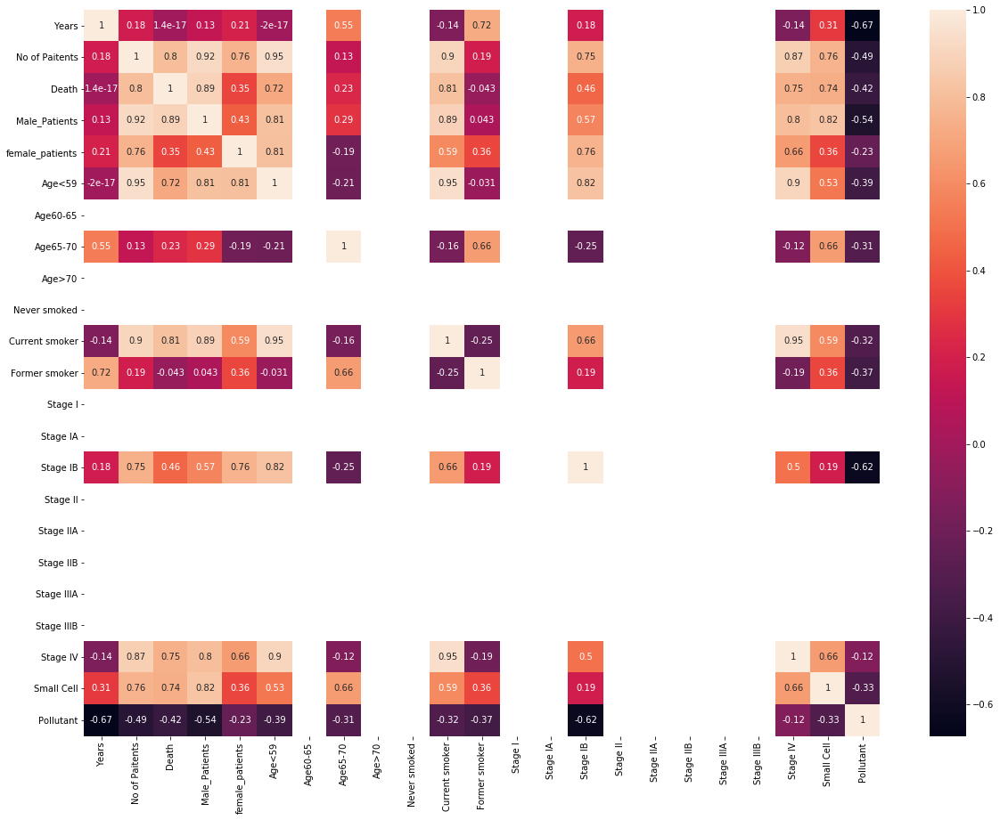

State : FL
Pollutant : NO2
Status : 
Group(k) : 12


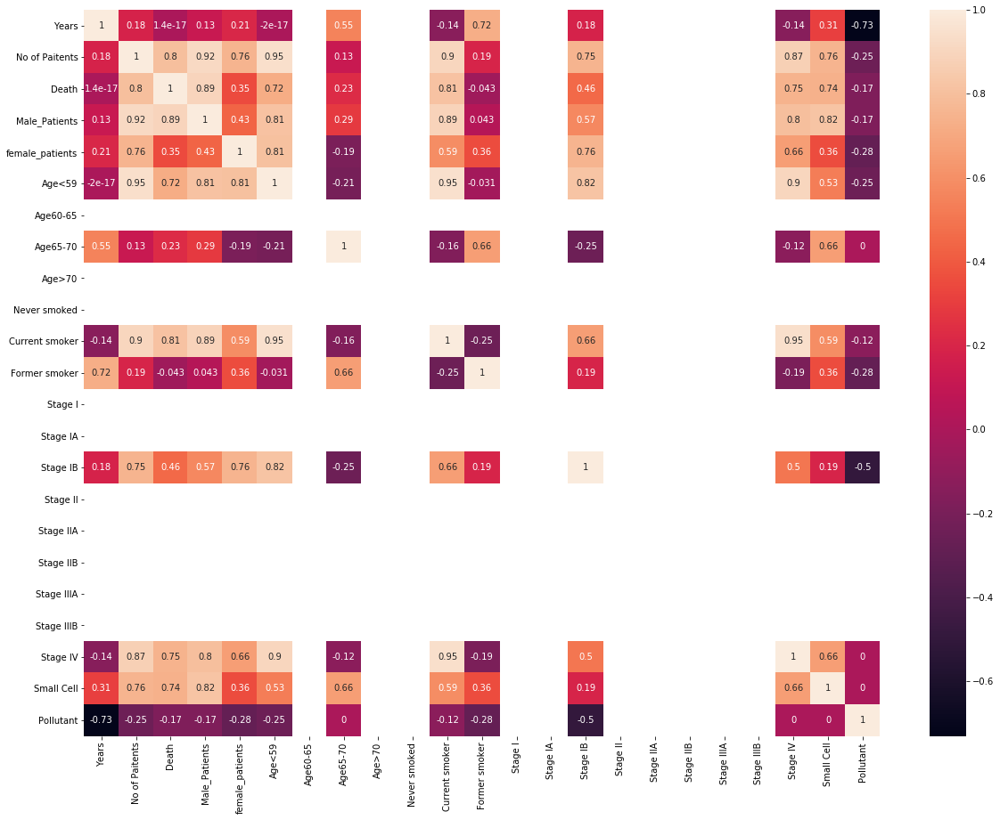

State : FL
Pollutant : SO2
Status : 
Group(k) : 12


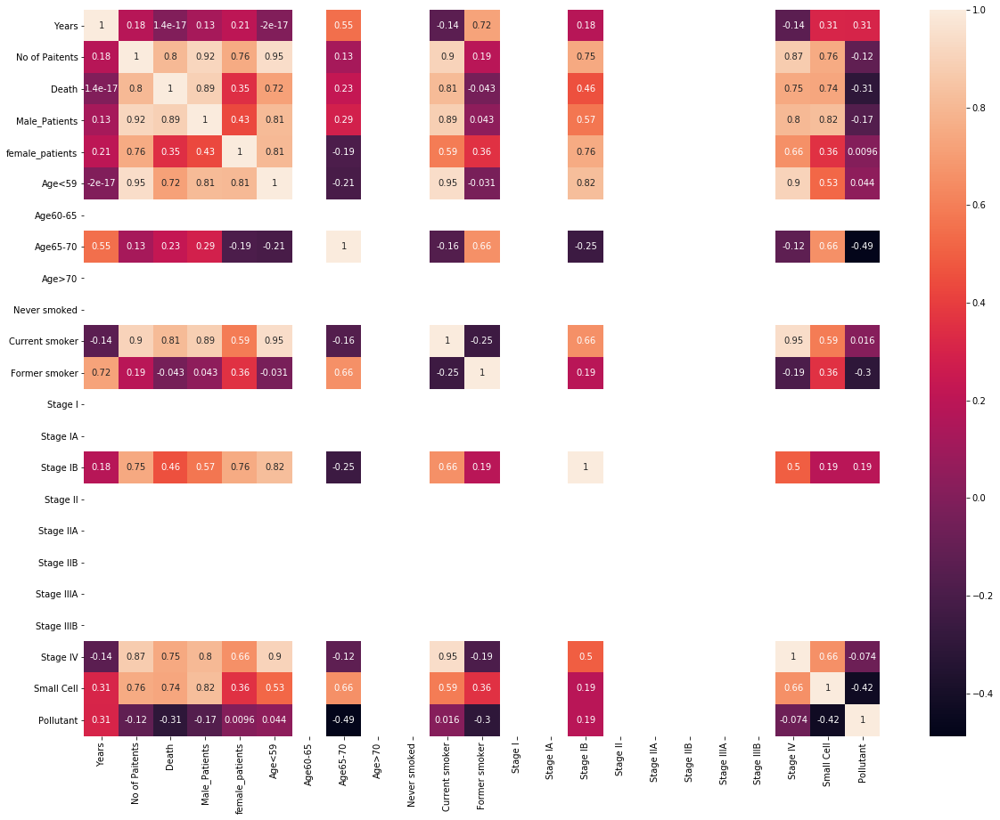

State : GA
Pollutant : O3
Status : 
Group(k) : 13


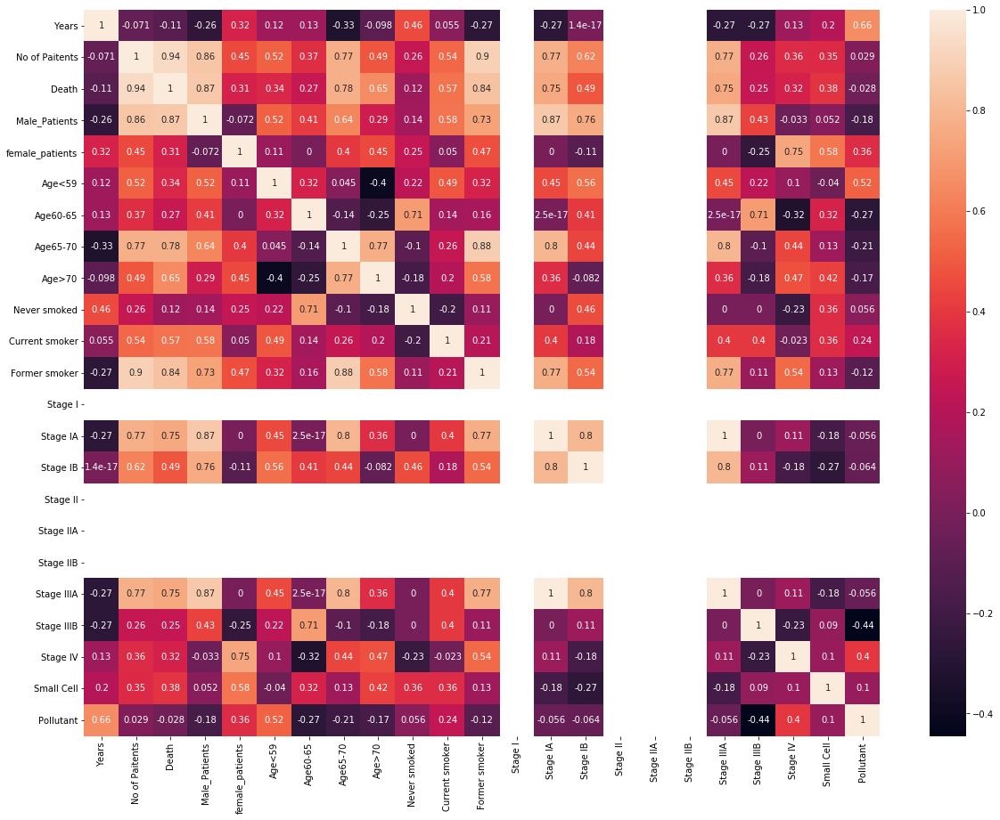

State : GA
Pollutant : PM2.5
Status : 
Data Not available!!
State : GA
Pollutant : PM10
Status : 
Data Not available!!
State : GA
Pollutant : Pb
Status : 
Data Not available!!
State : GA
Pollutant : CO
Status : 
Data Not available!!
State : GA
Pollutant : NO2
Status : 
Group(k) : 13


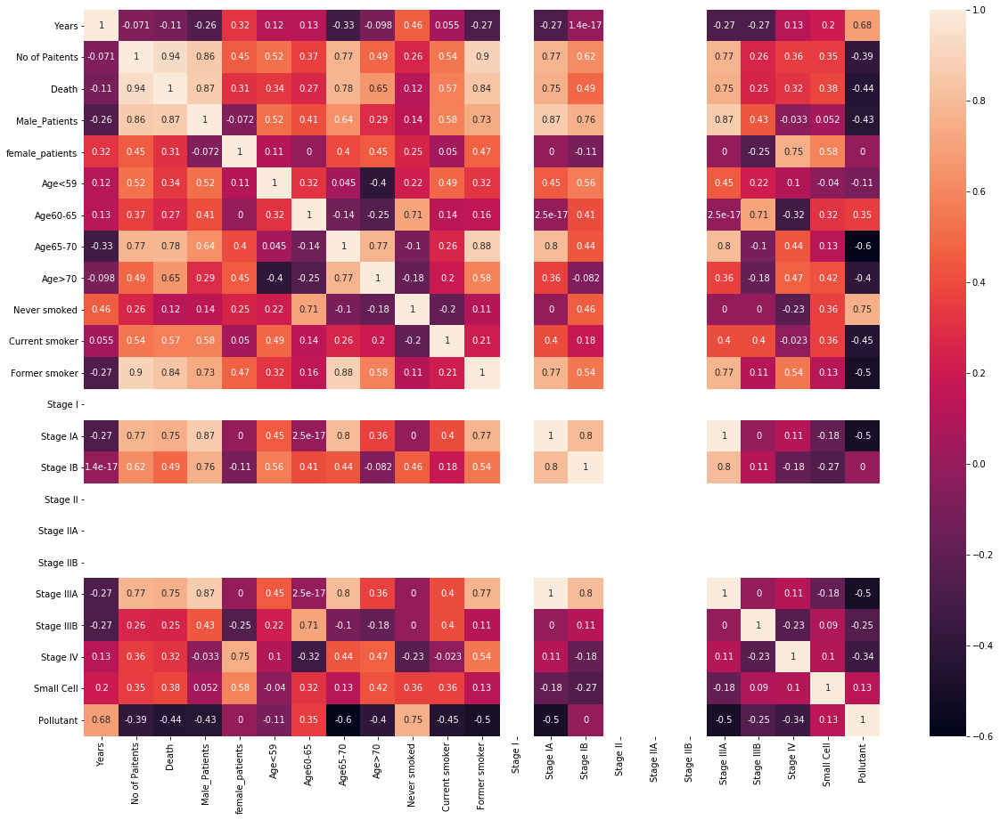

State : GA
Pollutant : SO2
Status : 
Group(k) : 13


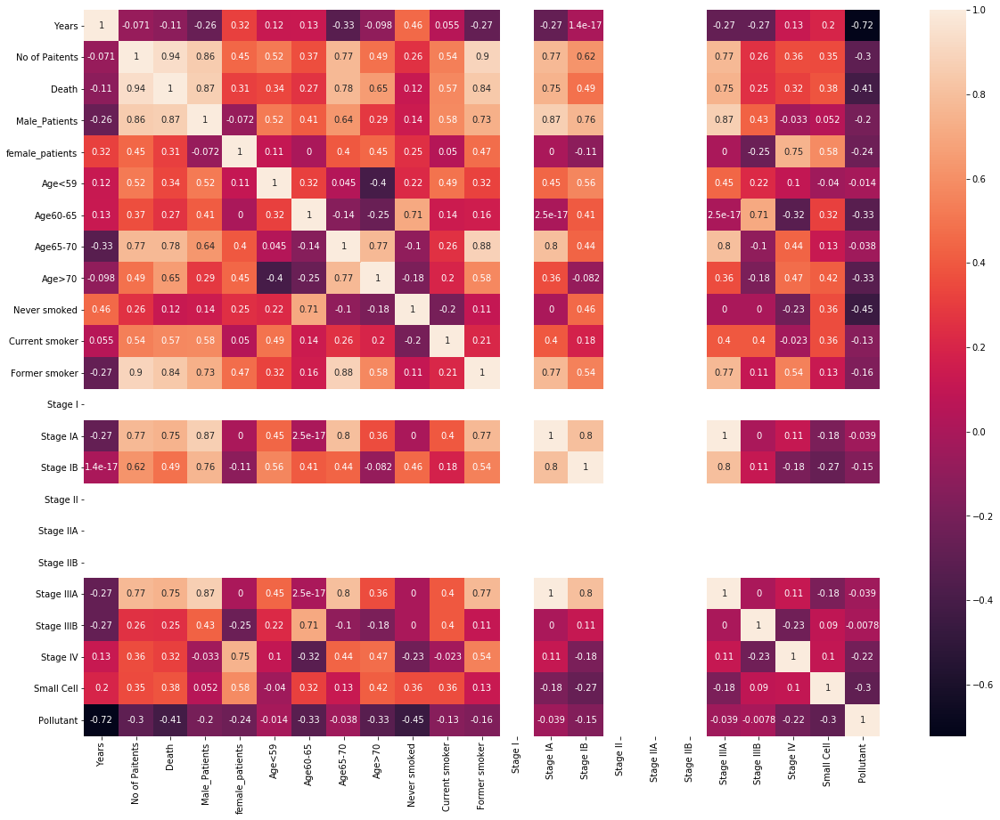

State : HI
Pollutant : O3
Status : 
Data Not available!!
State : HI
Pollutant : PM2.5
Status : 
Data Not available!!
State : HI
Pollutant : PM10
Status : 
Data Not available!!
State : HI
Pollutant : Pb
Status : 
Data Not available!!
State : HI
Pollutant : CO
Status : 
Group(k) : 15


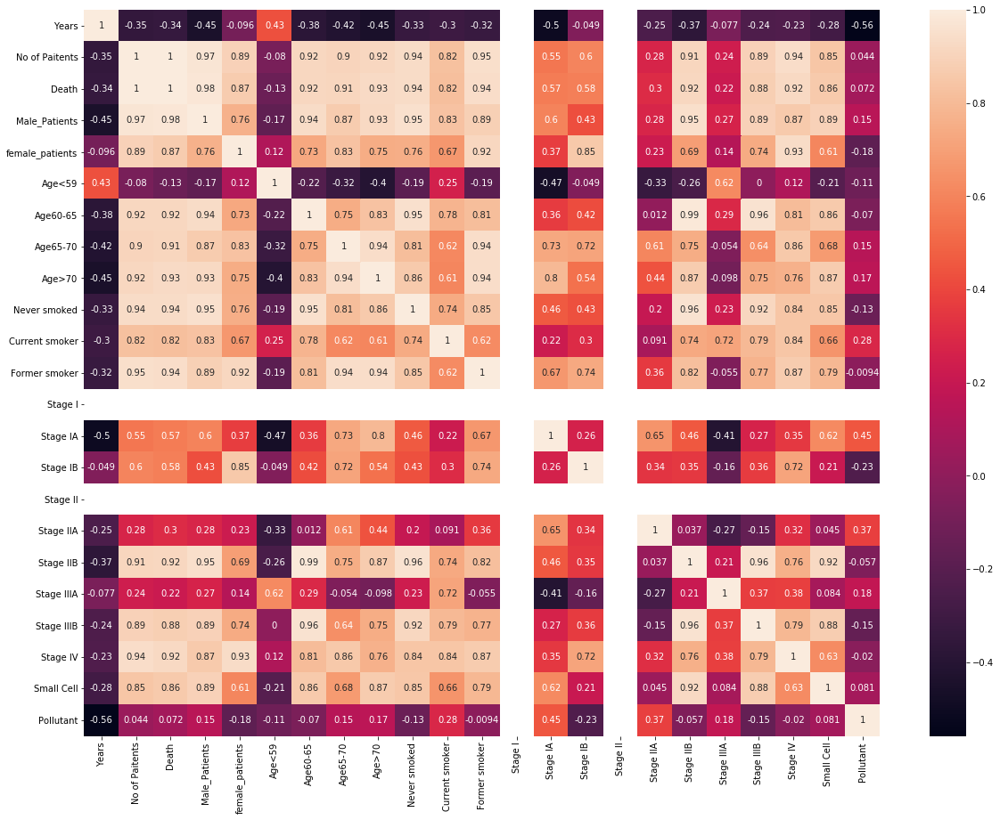

State : HI
Pollutant : NO2
Status : 
Data Not available!!
State : HI
Pollutant : SO2
Status : 
Data Not available!!
State : IA
Pollutant : O3
Status : 
Group(k) : 19


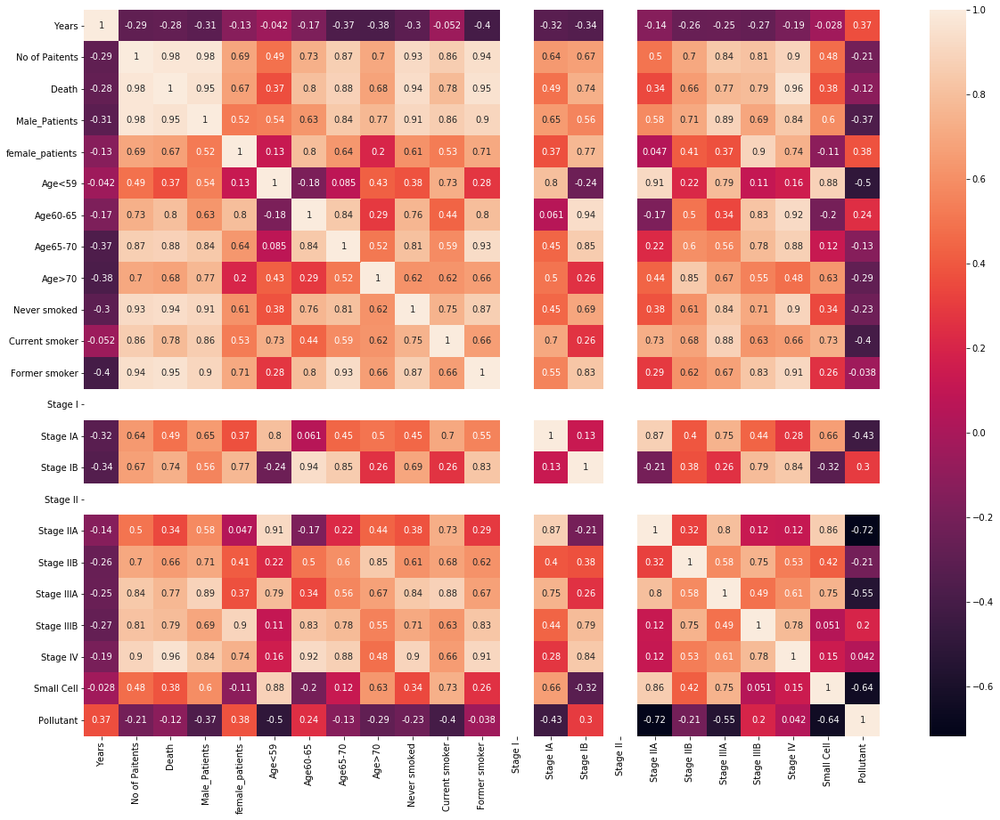

State : IA
Pollutant : PM2.5
Status : 
Data Not available!!
State : IA
Pollutant : PM10
Status : 
Data Not available!!
State : IA
Pollutant : Pb
Status : 
Data Not available!!
State : IA
Pollutant : CO
Status : 
Data Not available!!
State : IA
Pollutant : NO2
Status : 
Data Not available!!
State : IA
Pollutant : SO2
Status : 
Data Not available!!
State : IL
Pollutant : O3
Status : 
Group(k) : 17


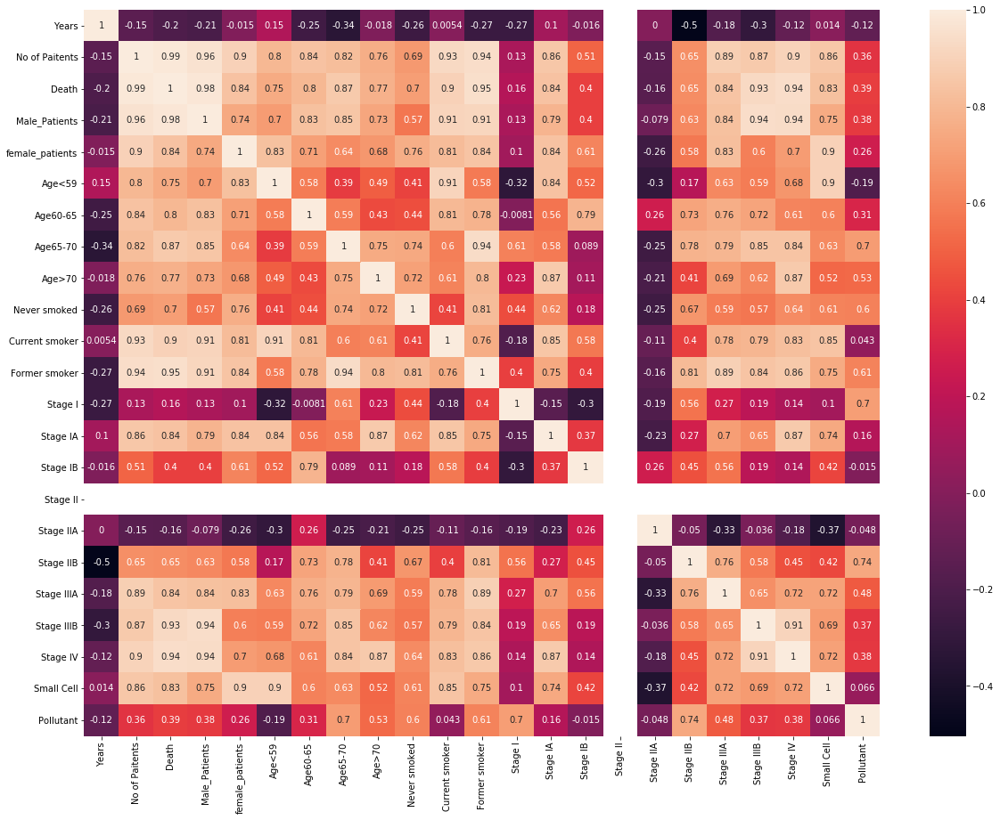

State : IL
Pollutant : PM2.5
Status : 
Data Not available!!
State : IL
Pollutant : PM10
Status : 
Data Not available!!
State : IL
Pollutant : Pb
Status : 
Data Not available!!
State : IL
Pollutant : CO
Status : 
Data Not available!!
State : IL
Pollutant : NO2
Status : 
Data Not available!!
State : IL
Pollutant : SO2
Status : 
Data Not available!!
State : IN
Pollutant : O3
Status : 
Group(k) : 18


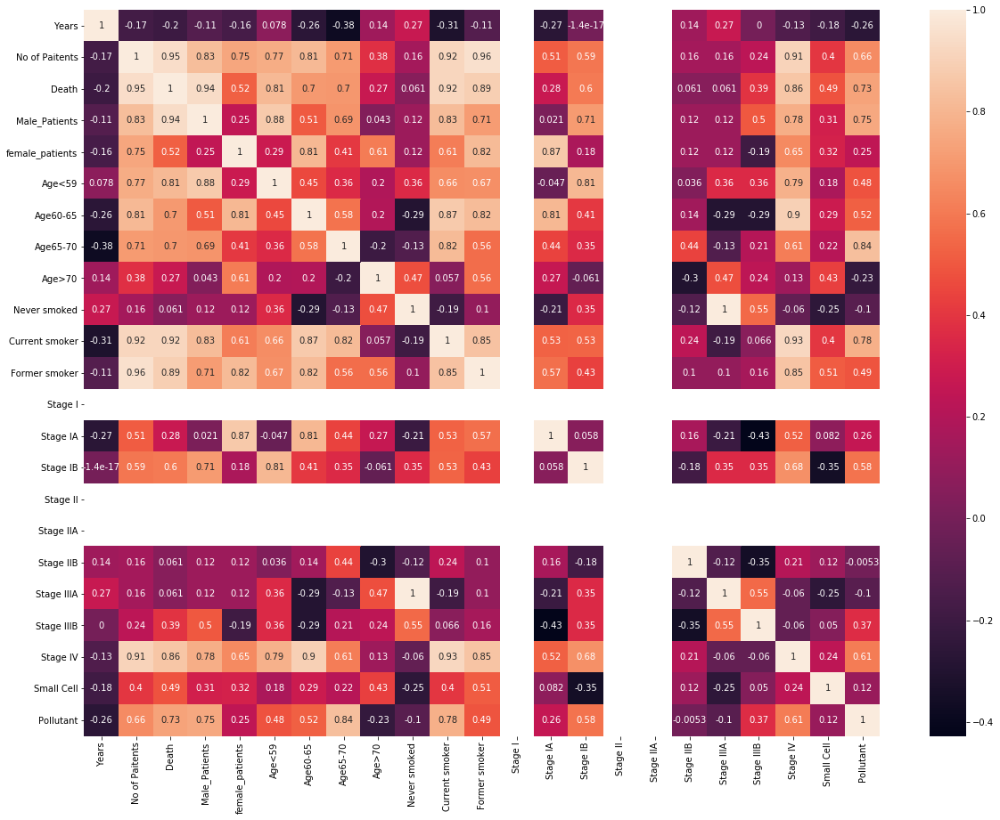

State : IN
Pollutant : PM2.5
Status : 
Data Not available!!
State : IN
Pollutant : PM10
Status : 
Group(k) : 18


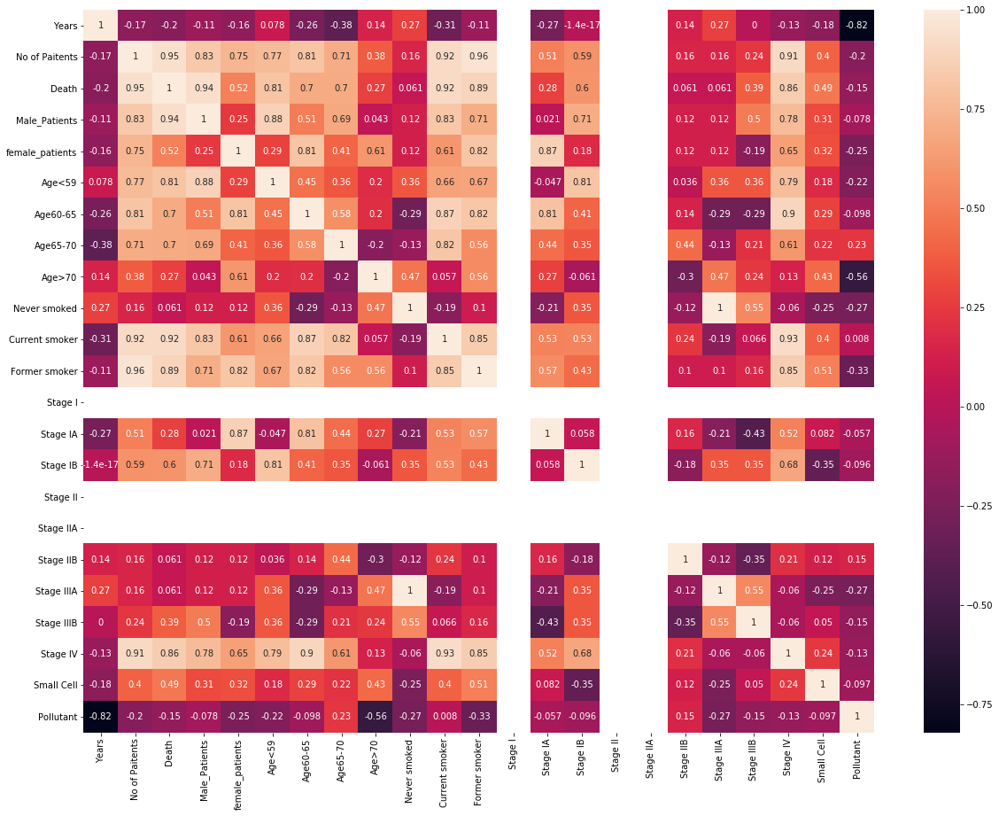

State : IN
Pollutant : Pb
Status : 
Data Not available!!
State : IN
Pollutant : CO
Status : 
Group(k) : 18


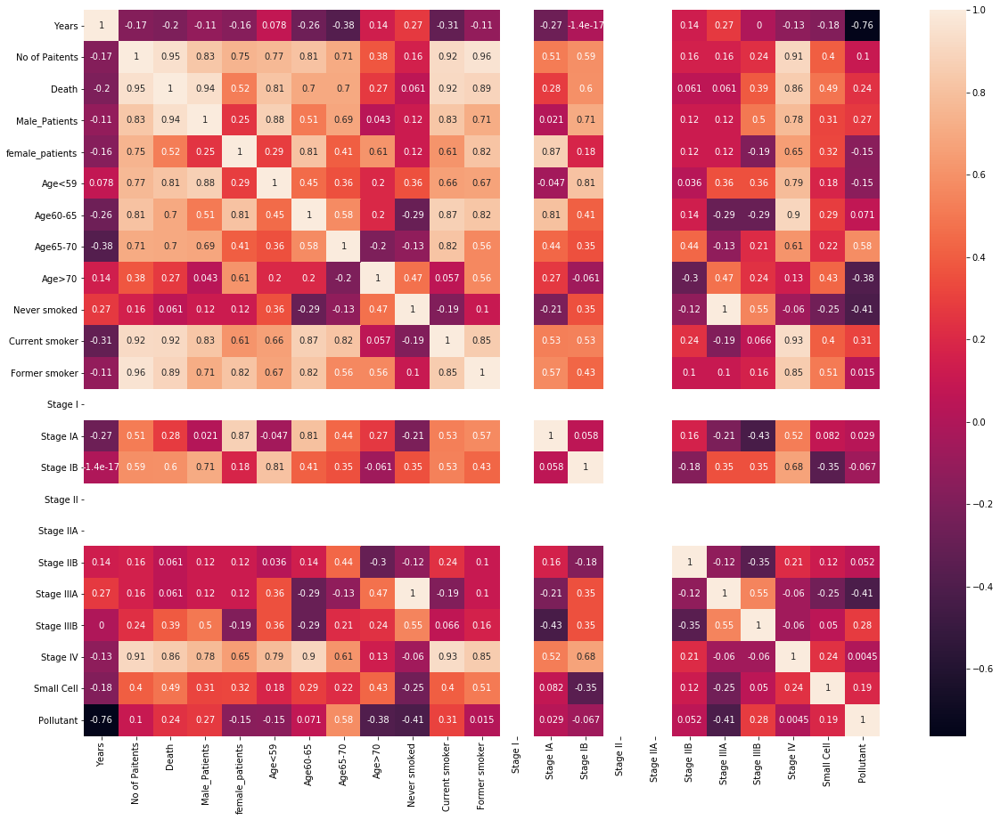

State : IN
Pollutant : NO2
Status : 
Data Not available!!
State : IN
Pollutant : SO2
Status : 
Group(k) : 18


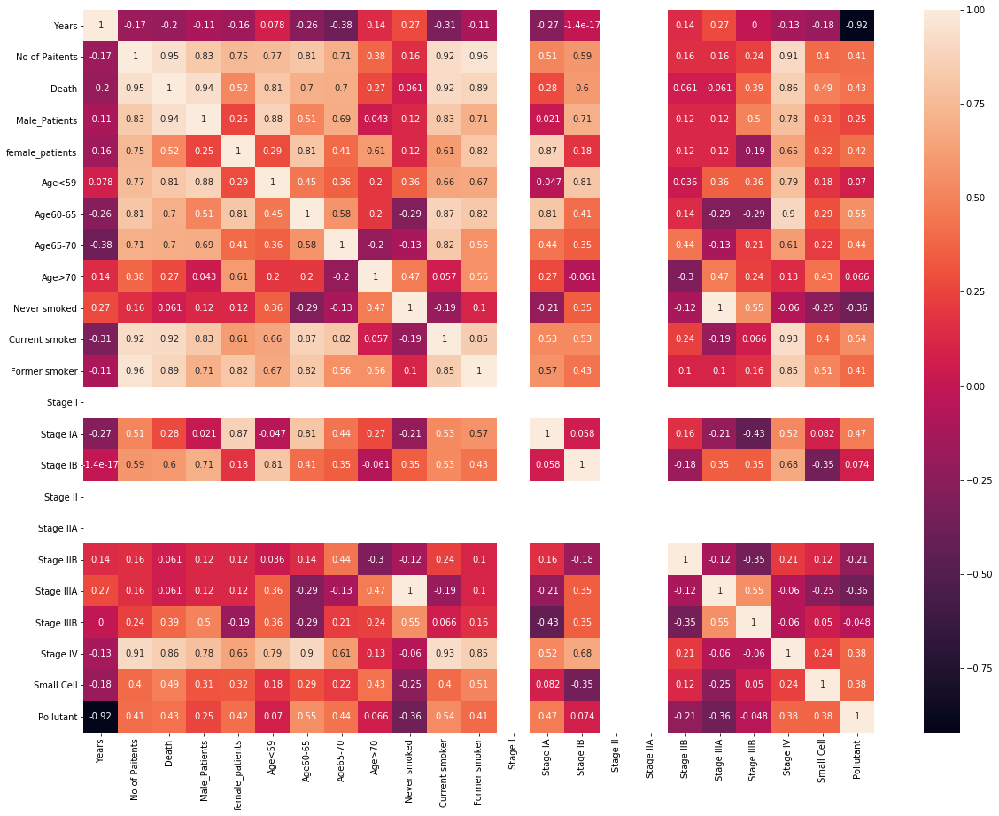

State : KS
Pollutant : O3
Status : 
Group(k) : 20


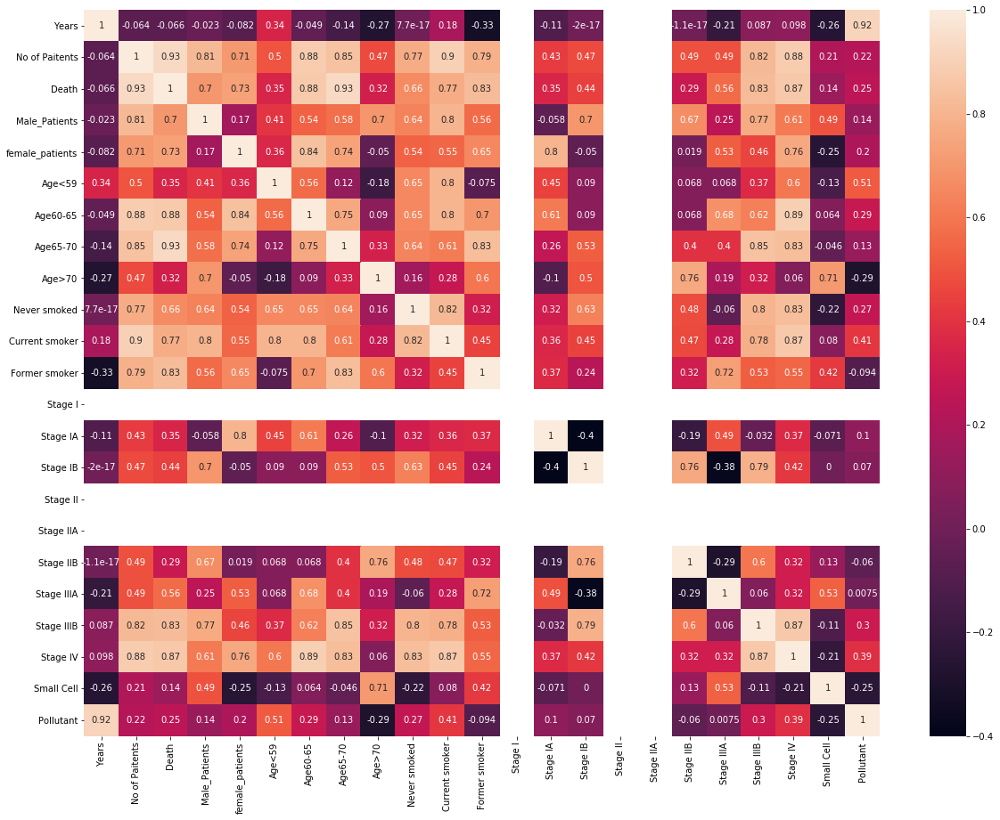

State : KS
Pollutant : PM2.5
Status : 
Data Not available!!
State : KS
Pollutant : PM10
Status : 
Data Not available!!
State : KS
Pollutant : Pb
Status : 
Data Not available!!
State : KS
Pollutant : CO
Status : 
Data Not available!!
State : KS
Pollutant : NO2
Status : 
Data Not available!!
State : KS
Pollutant : SO2
Status : 
Data Not available!!
State : KY
Pollutant : O3
Status : 
Group(k) : 21


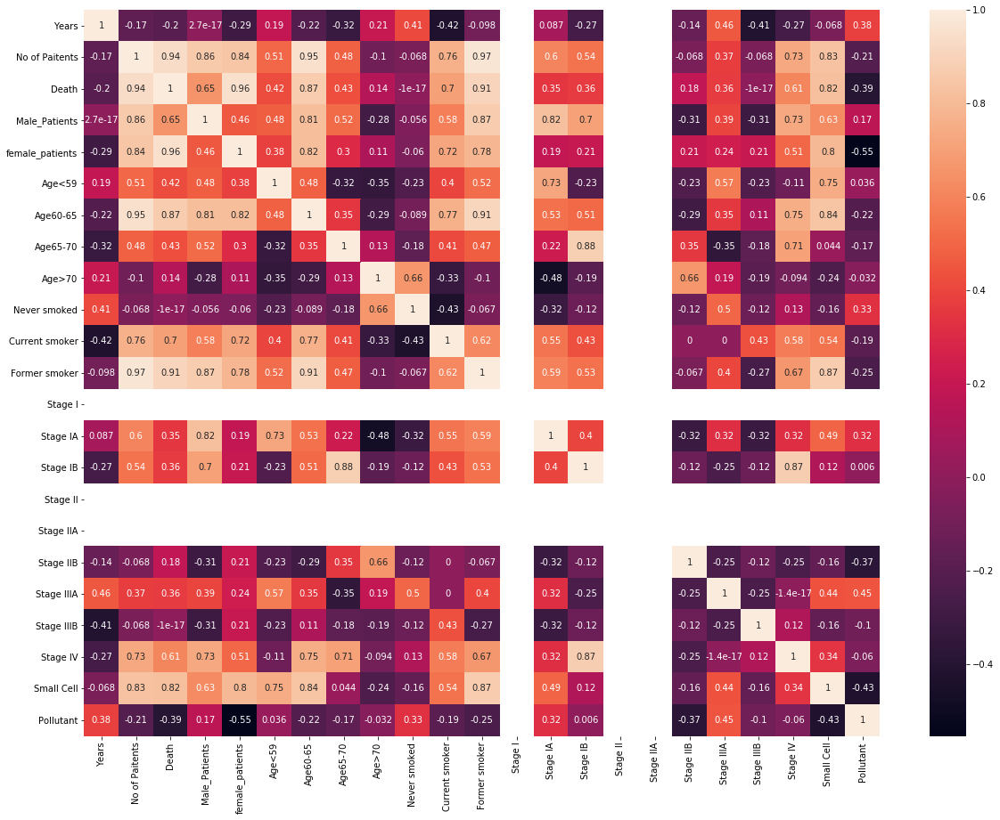

State : KY
Pollutant : PM2.5
Status : 
Data Not available!!
State : KY
Pollutant : PM10
Status : 
Data Not available!!
State : KY
Pollutant : Pb
Status : 
Data Not available!!
State : KY
Pollutant : CO
Status : 
Data Not available!!
State : KY
Pollutant : NO2
Status : 
Group(k) : 21


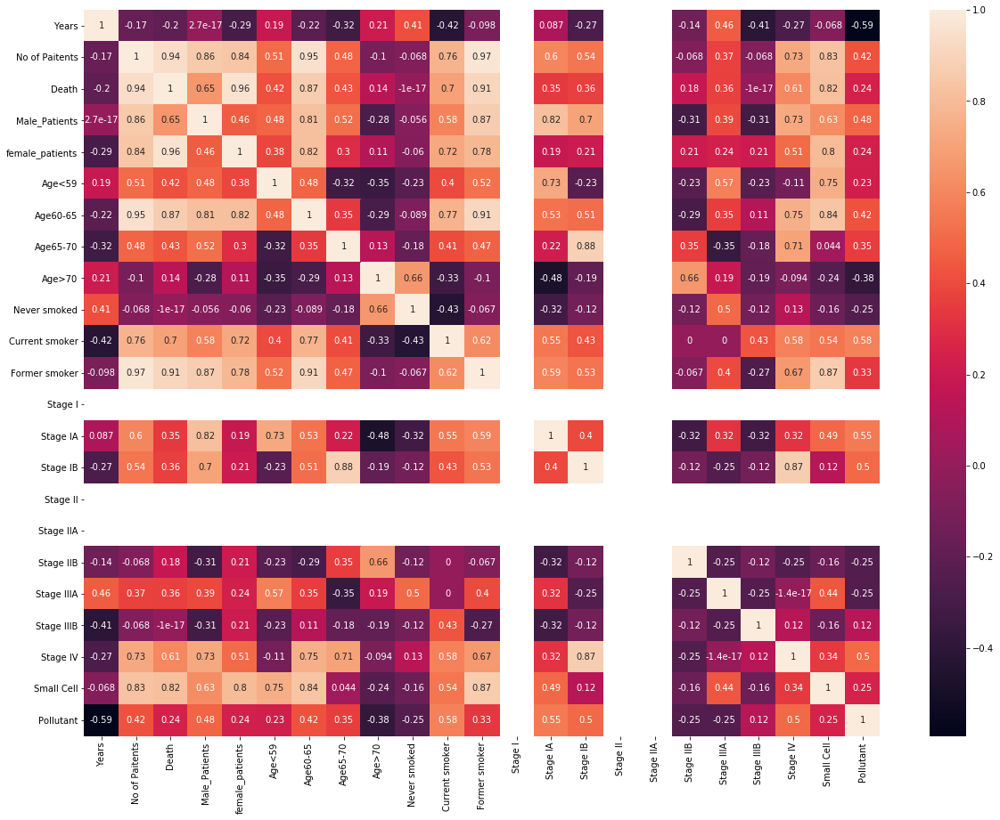

State : KY
Pollutant : SO2
Status : 
Data Not available!!
State : LA
Pollutant : O3
Status : 
Group(k) : 22


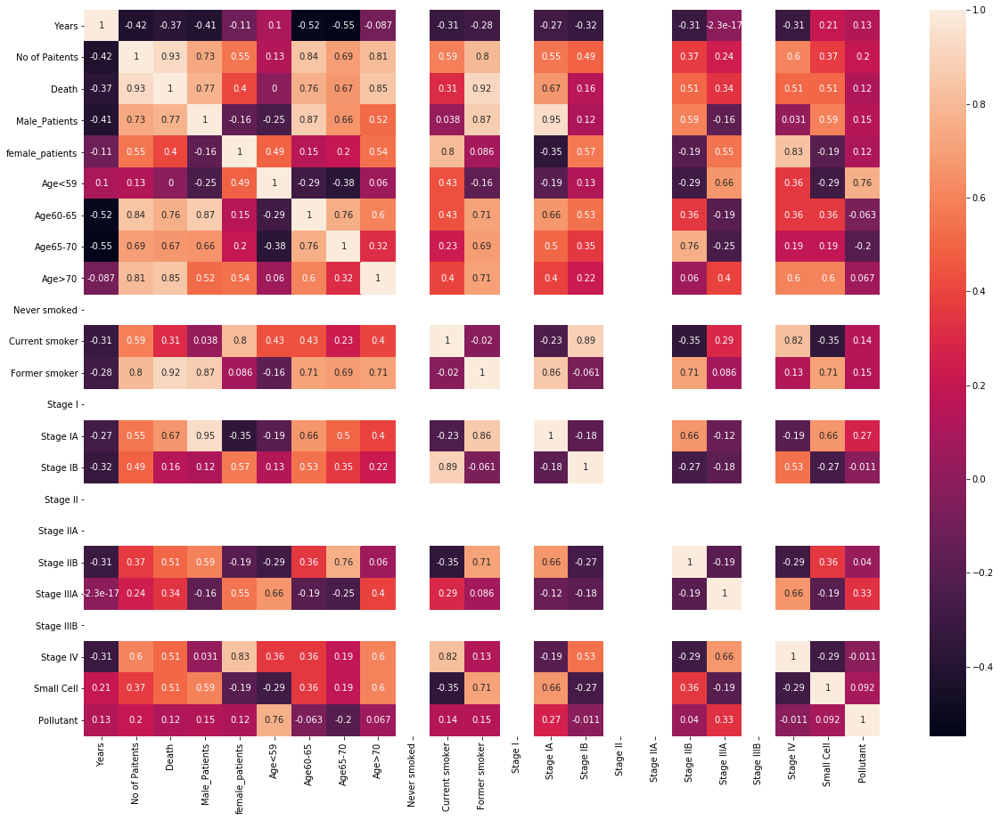

State : LA
Pollutant : PM2.5
Status : 
Data Not available!!
State : LA
Pollutant : PM10
Status : 
Data Not available!!
State : LA
Pollutant : Pb
Status : 
Data Not available!!
State : LA
Pollutant : CO
Status : 
Group(k) : 22


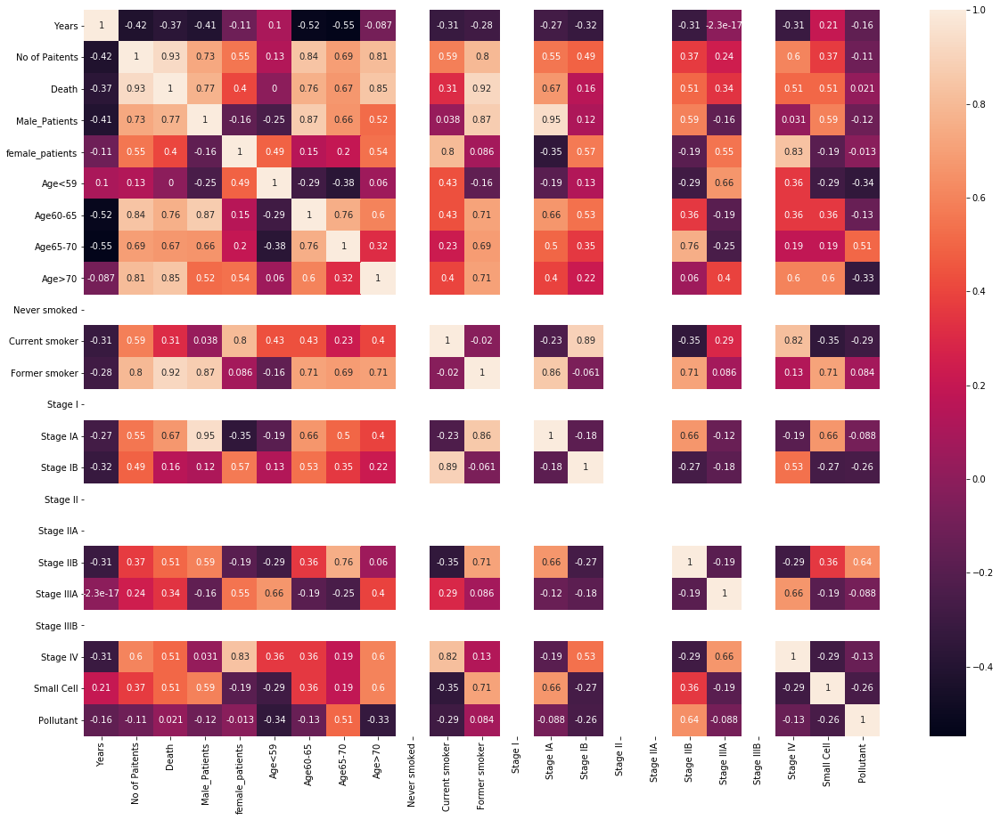

State : LA
Pollutant : NO2
Status : 
Group(k) : 22


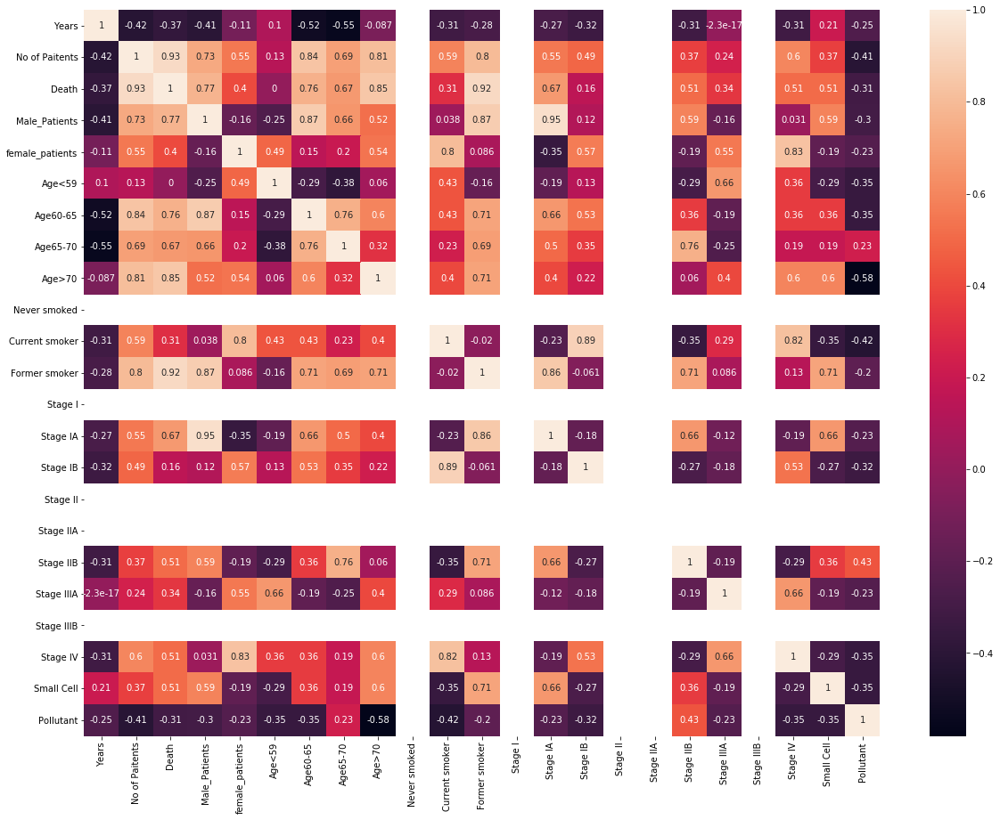

State : LA
Pollutant : SO2
Status : 
Data Not available!!
State : MA
Pollutant : O3
Status : 
Group(k) : 25


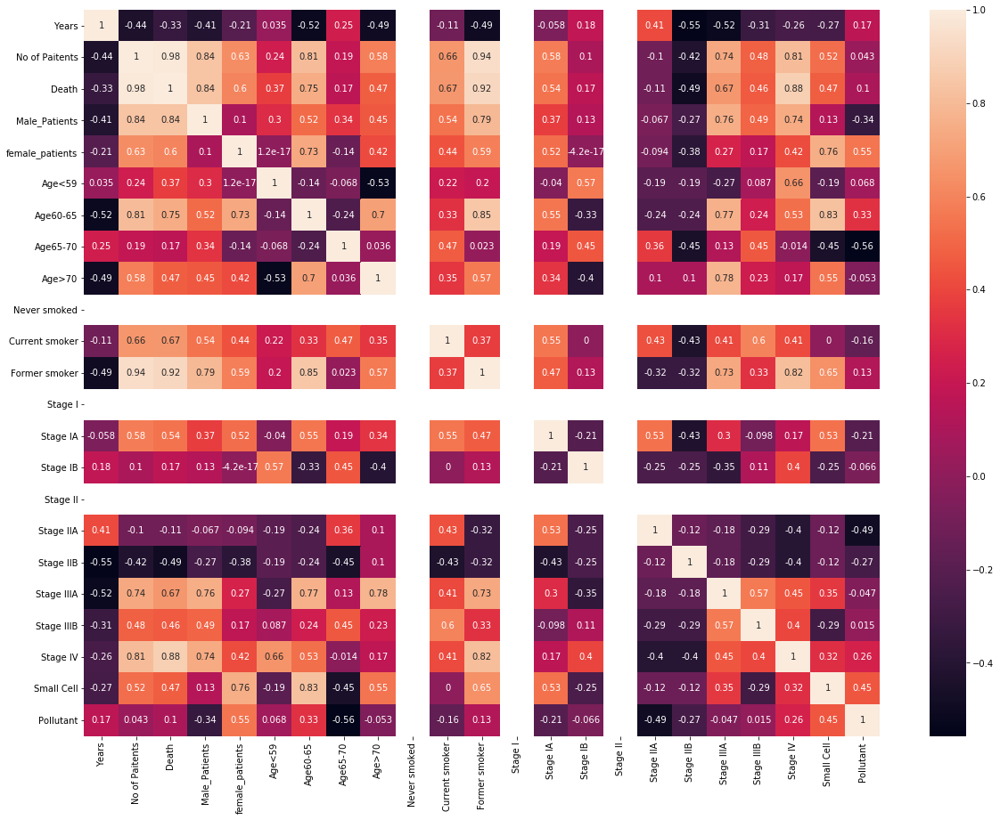

State : MA
Pollutant : PM2.5
Status : 
Data Not available!!
State : MA
Pollutant : PM10
Status : 
Data Not available!!
State : MA
Pollutant : Pb
Status : 
Data Not available!!
State : MA
Pollutant : CO
Status : 
Group(k) : 25


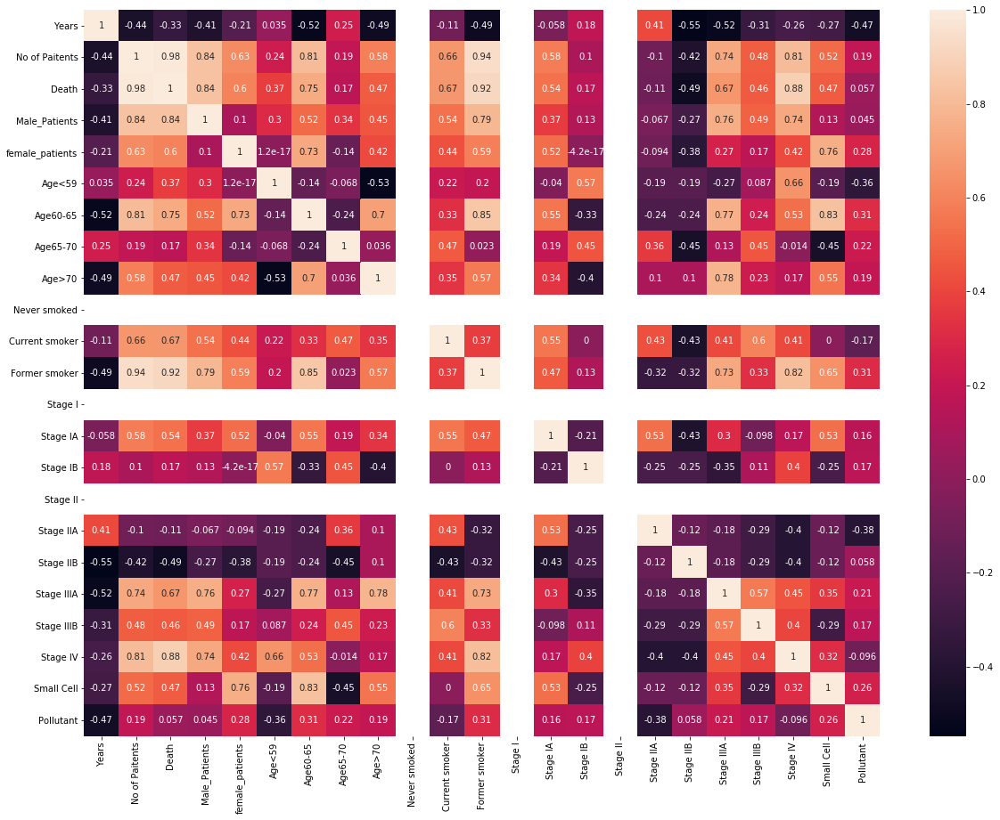

State : MA
Pollutant : NO2
Status : 
Data Not available!!
State : MA
Pollutant : SO2
Status : 
Data Not available!!
State : MD
Pollutant : O3
Status : 
Data Not available!!
State : MD
Pollutant : PM2.5
Status : 
Data Not available!!
State : MD
Pollutant : PM10
Status : 
Data Not available!!
State : MD
Pollutant : Pb
Status : 
Data Not available!!
State : MD
Pollutant : CO
Status : 
Group(k) : 24


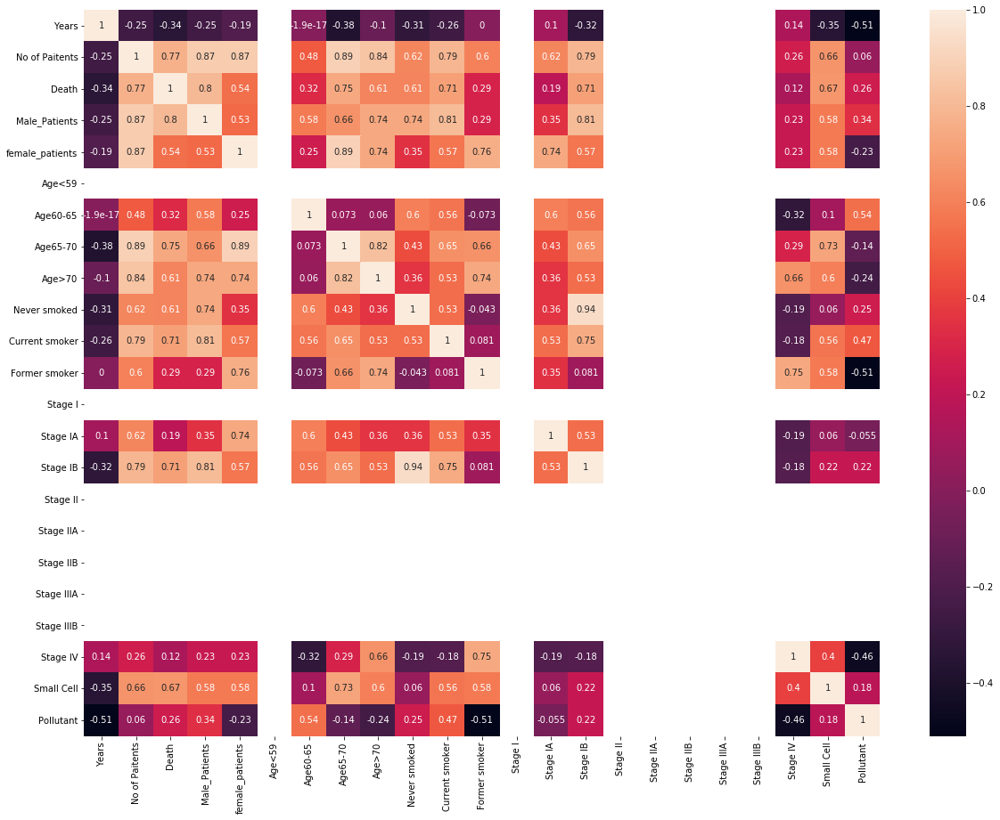

State : MD
Pollutant : NO2
Status : 
Group(k) : 24


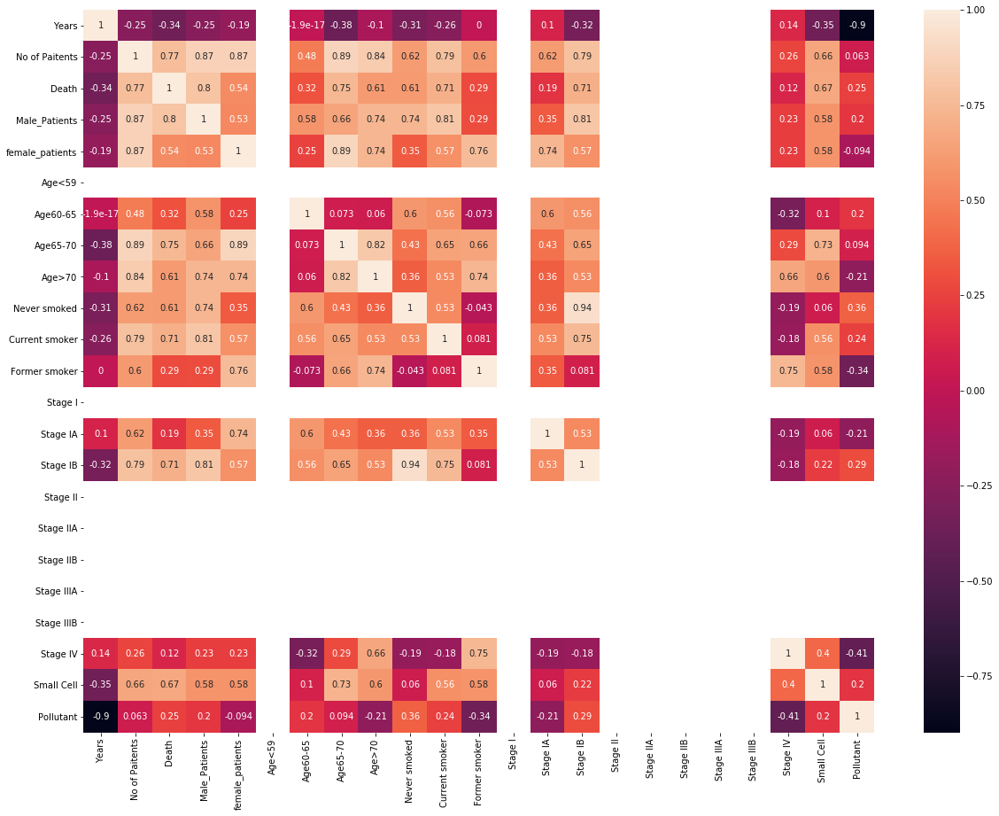

State : MD
Pollutant : SO2
Status : 
Data Not available!!
State : ME
Pollutant : O3
Status : 
Group(k) : 23


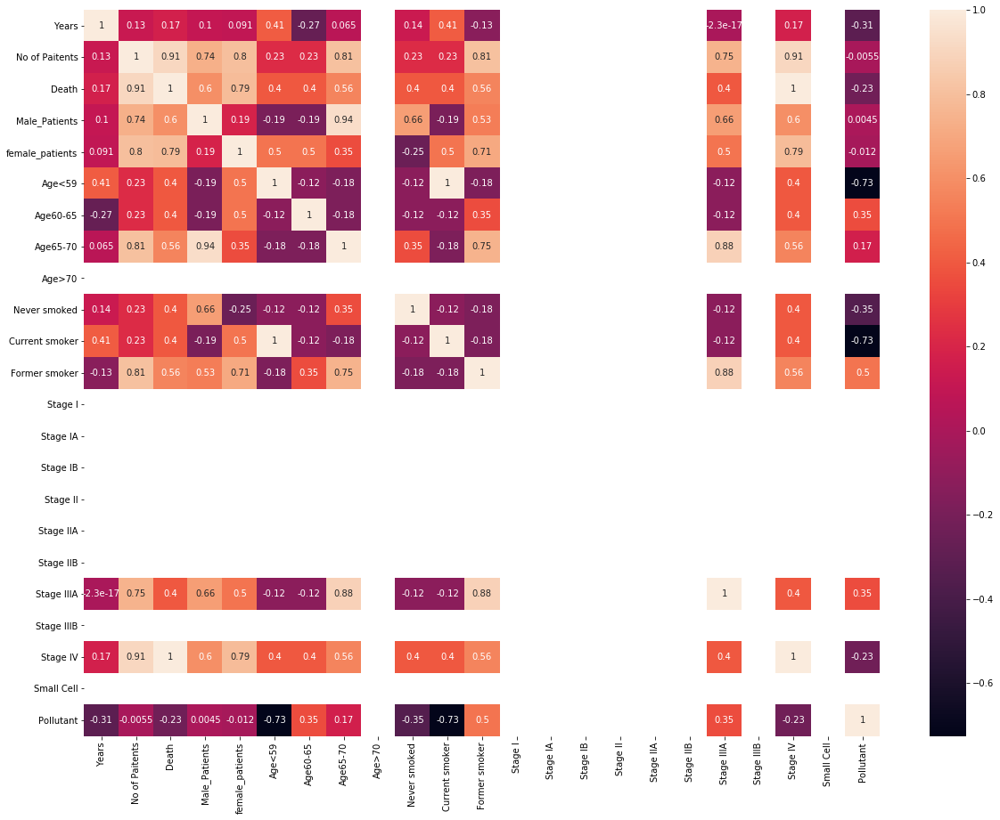

State : ME
Pollutant : PM2.5
Status : 
Data Not available!!
State : ME
Pollutant : PM10
Status : 
Data Not available!!
State : ME
Pollutant : Pb
Status : 
Data Not available!!
State : ME
Pollutant : CO
Status : 
Data Not available!!
State : ME
Pollutant : NO2
Status : 
Data Not available!!
State : ME
Pollutant : SO2
Status : 
Data Not available!!
State : MI
Pollutant : O3
Status : 
Group(k) : 26


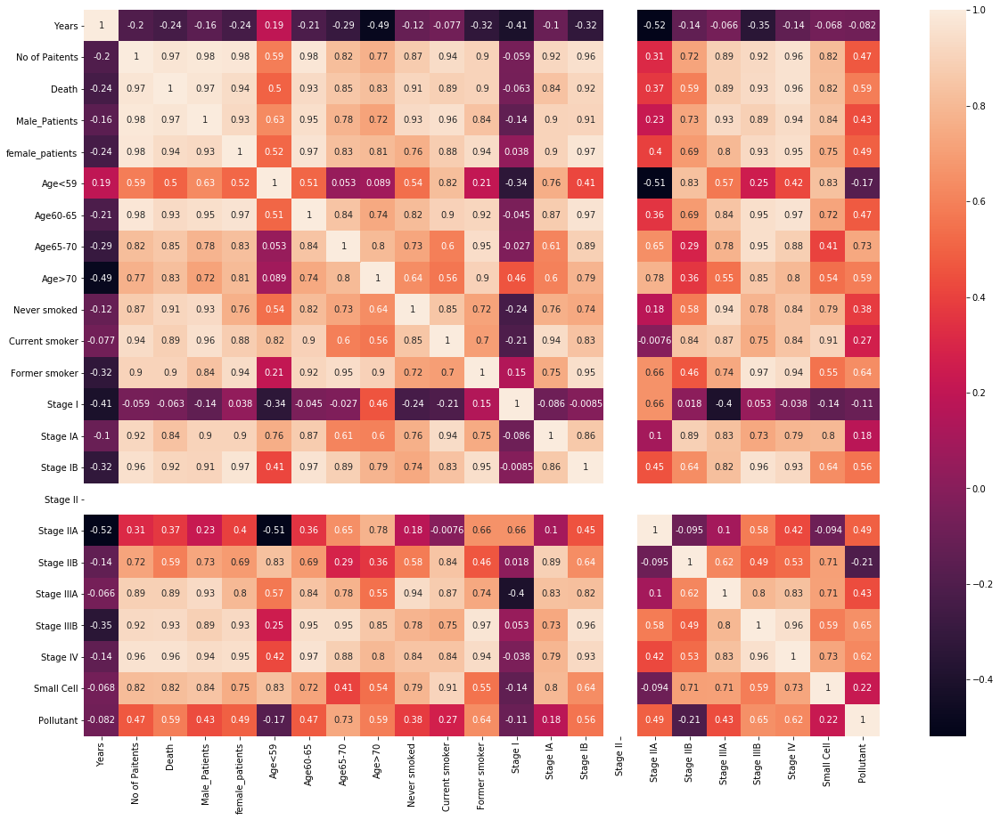

State : MI
Pollutant : PM2.5
Status : 
Data Not available!!
State : MI
Pollutant : PM10
Status : 
Data Not available!!
State : MI
Pollutant : Pb
Status : 
Data Not available!!
State : MI
Pollutant : CO
Status : 
Data Not available!!
State : MI
Pollutant : NO2
Status : 
Data Not available!!
State : MI
Pollutant : SO2
Status : 
Data Not available!!
State : MN
Pollutant : O3
Status : 
Data Not available!!
State : MN
Pollutant : PM2.5
Status : 
Data Not available!!
State : MN
Pollutant : PM10
Status : 
Data Not available!!
State : MN
Pollutant : Pb
Status : 
Data Not available!!
State : MN
Pollutant : CO
Status : 
Data Not available!!
State : MN
Pollutant : NO2
Status : 
Data Not available!!
State : MN
Pollutant : SO2
Status : 
Data Not available!!
State : MO
Pollutant : O3
Status : 
Group(k) : 29


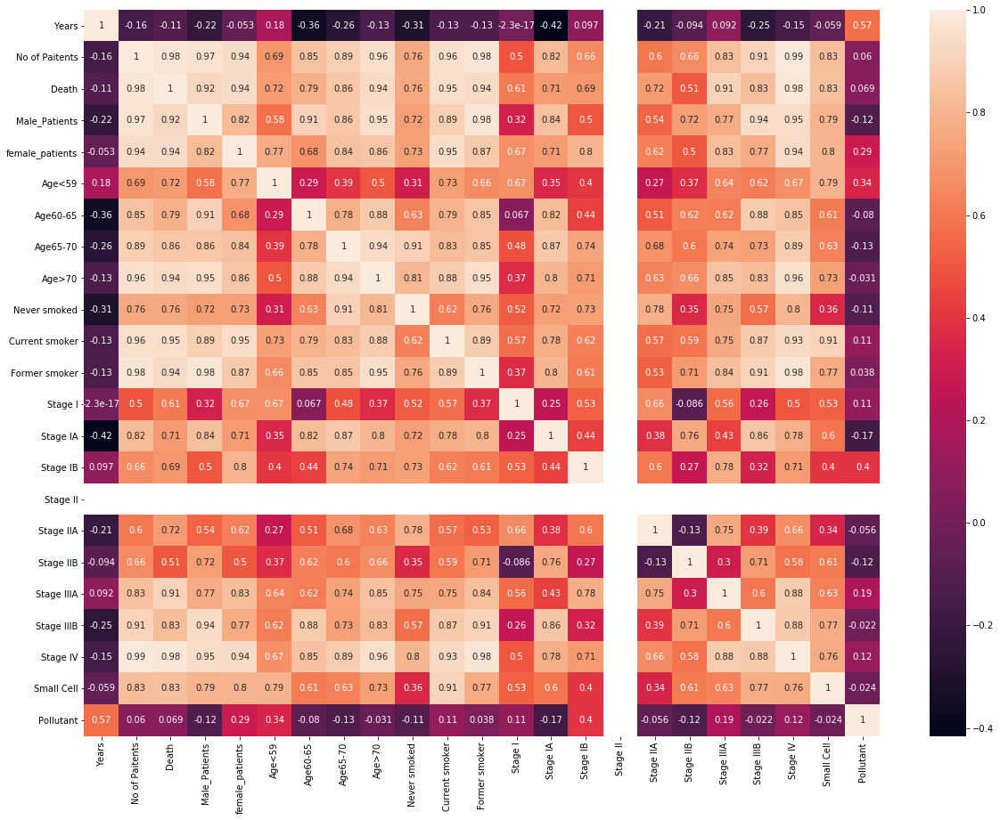

State : MO
Pollutant : PM2.5
Status : 
Data Not available!!
State : MO
Pollutant : PM10
Status : 
Data Not available!!
State : MO
Pollutant : Pb
Status : 
Data Not available!!
State : MO
Pollutant : CO
Status : 
Data Not available!!
State : MO
Pollutant : NO2
Status : 
Data Not available!!
State : MO
Pollutant : SO2
Status : 
Data Not available!!
State : MT
Pollutant : O3
Status : 
Group(k) : 30


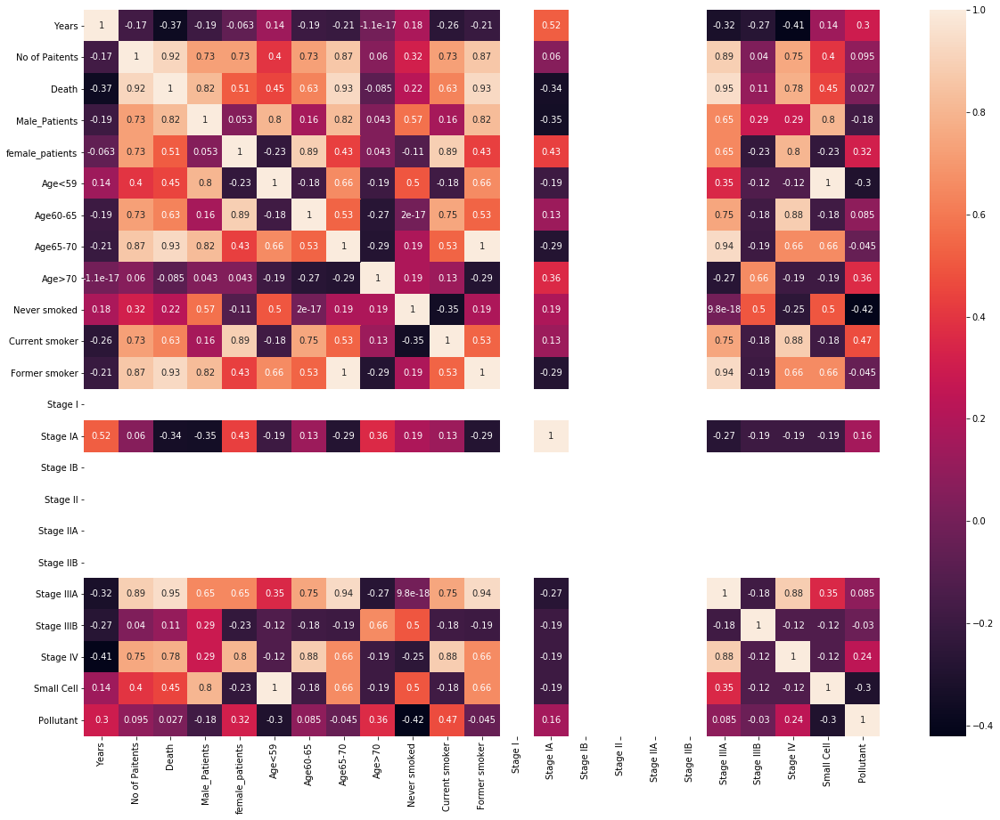

State : MT
Pollutant : PM2.5
Status : 
Data Not available!!
State : MT
Pollutant : PM10
Status : 
Data Not available!!
State : MT
Pollutant : Pb
Status : 
Data Not available!!
State : MT
Pollutant : CO
Status : 
Data Not available!!
State : MT
Pollutant : NO2
Status : 
Data Not available!!
State : MT
Pollutant : SO2
Status : 
Group(k) : 30


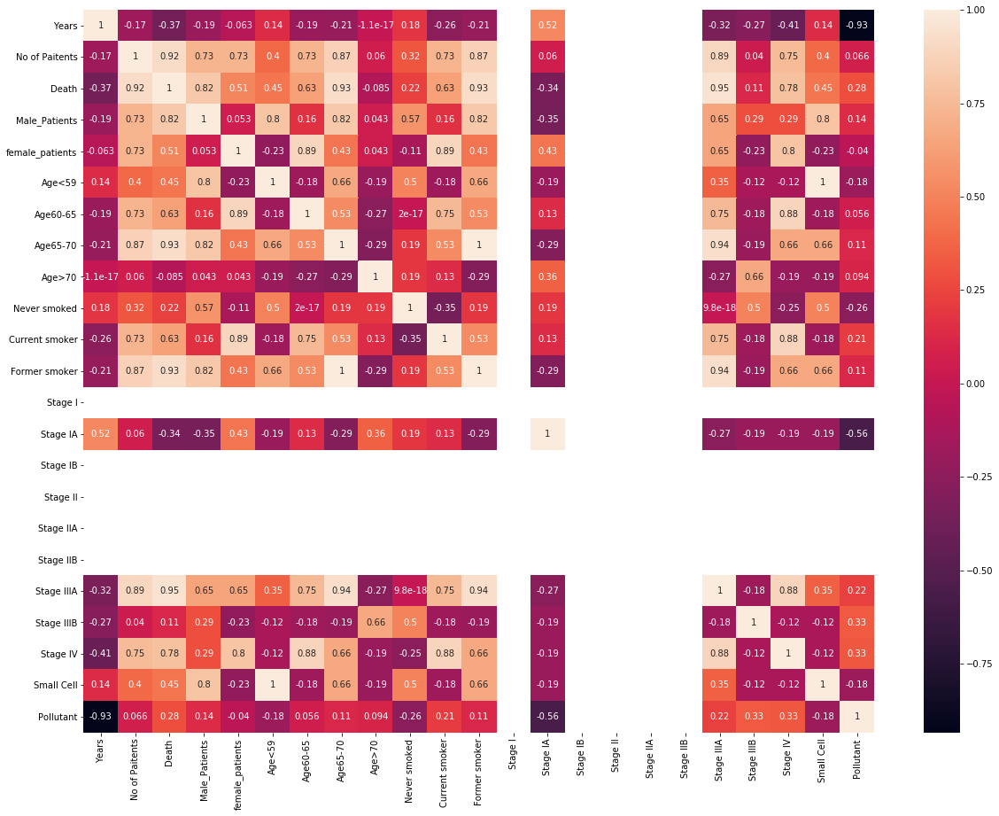

State : NC
Pollutant : O3
Status : 
Group(k) : 37


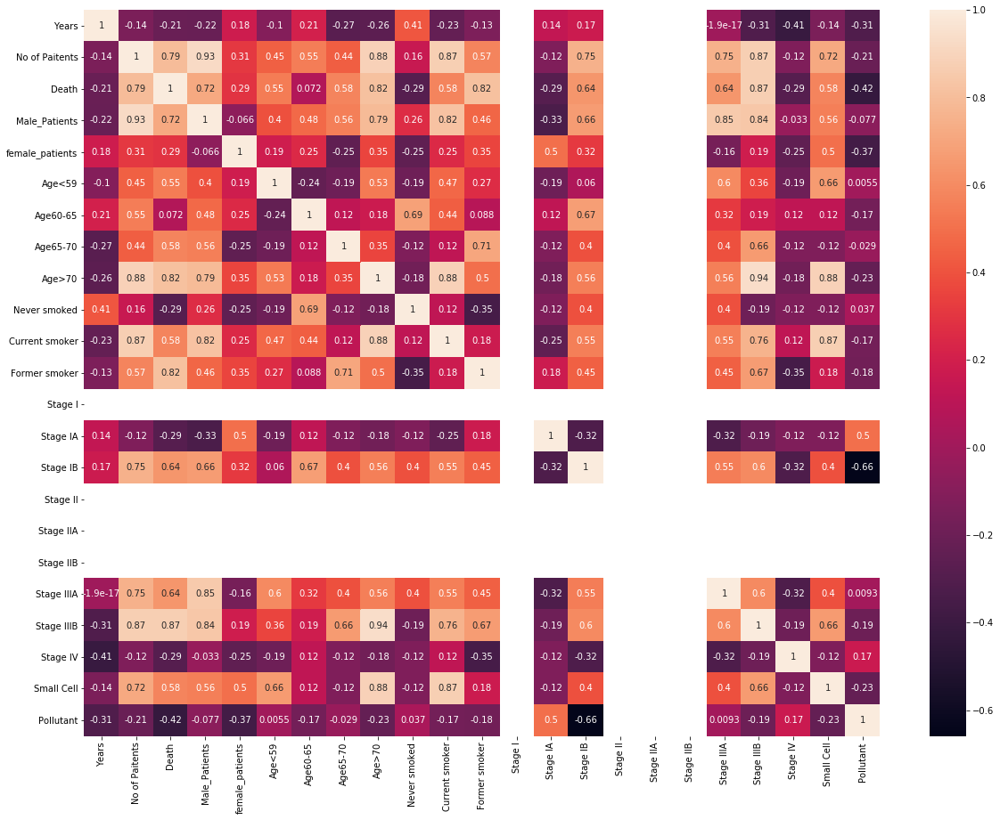

State : NC
Pollutant : PM2.5
Status : 
Data Not available!!
State : NC
Pollutant : PM10
Status : 
Data Not available!!
State : NC
Pollutant : Pb
Status : 
Data Not available!!
State : NC
Pollutant : CO
Status : 
Data Not available!!
State : NC
Pollutant : NO2
Status : 
Group(k) : 37


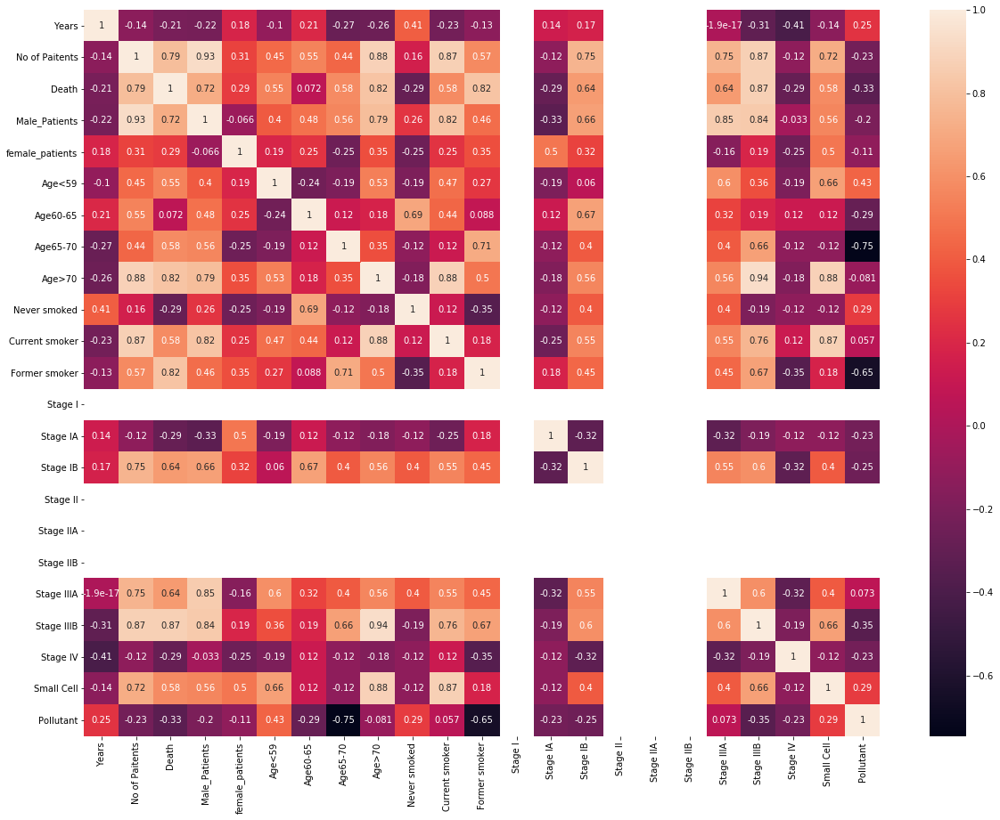

State : NC
Pollutant : SO2
Status : 
Data Not available!!
State : ND
Pollutant : O3
Status : 
Data Not available!!
State : ND
Pollutant : PM2.5
Status : 
Data Not available!!
State : ND
Pollutant : PM10
Status : 
Data Not available!!
State : ND
Pollutant : Pb
Status : 
Data Not available!!
State : ND
Pollutant : CO
Status : 
Data Not available!!
State : ND
Pollutant : NO2
Status : 
Group(k) : 38


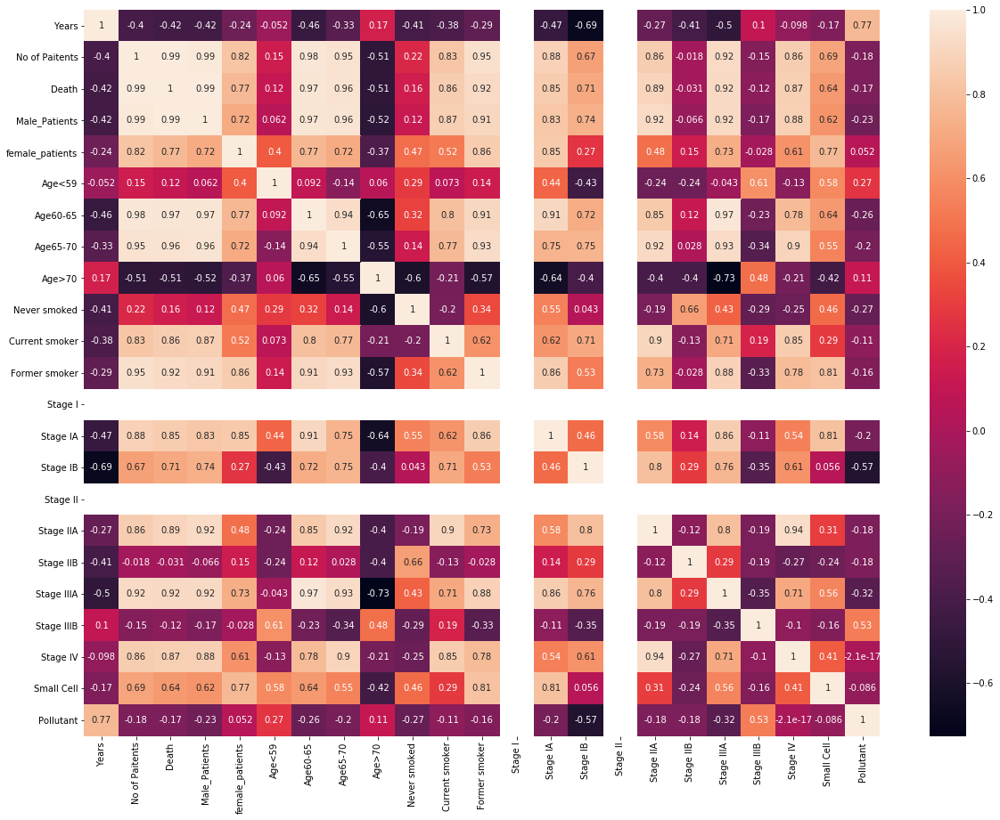

State : ND
Pollutant : SO2
Status : 
Group(k) : 38


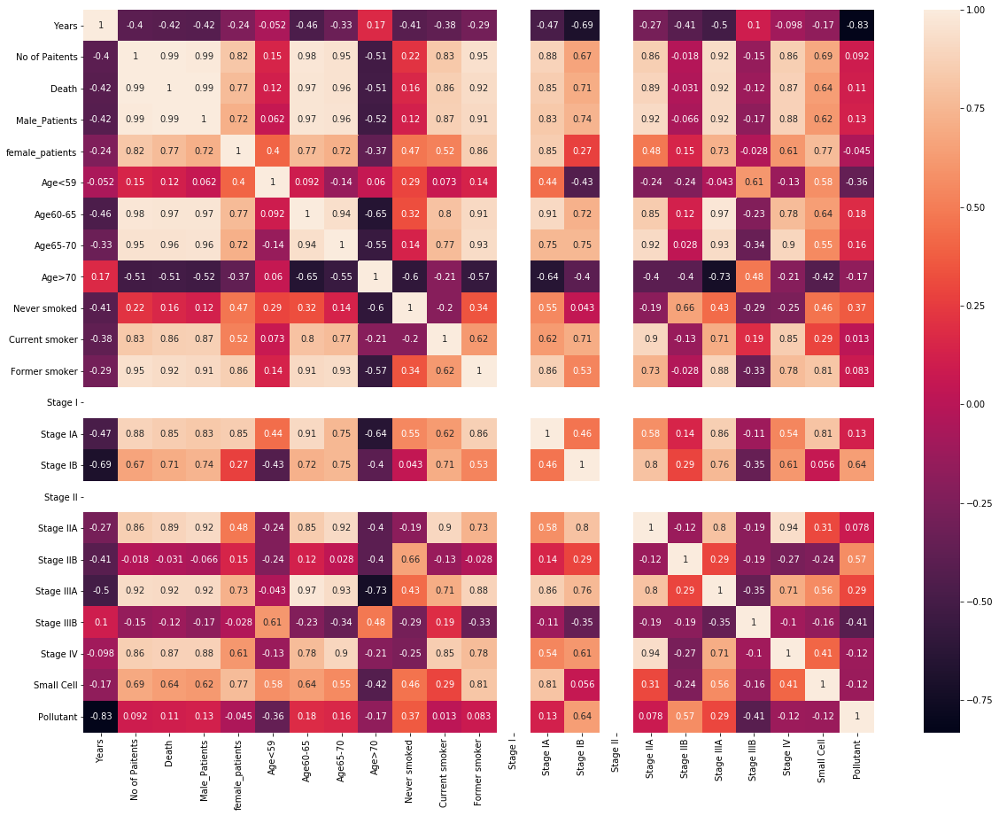

State : NE
Pollutant : O3
Status : 
Group(k) : 31


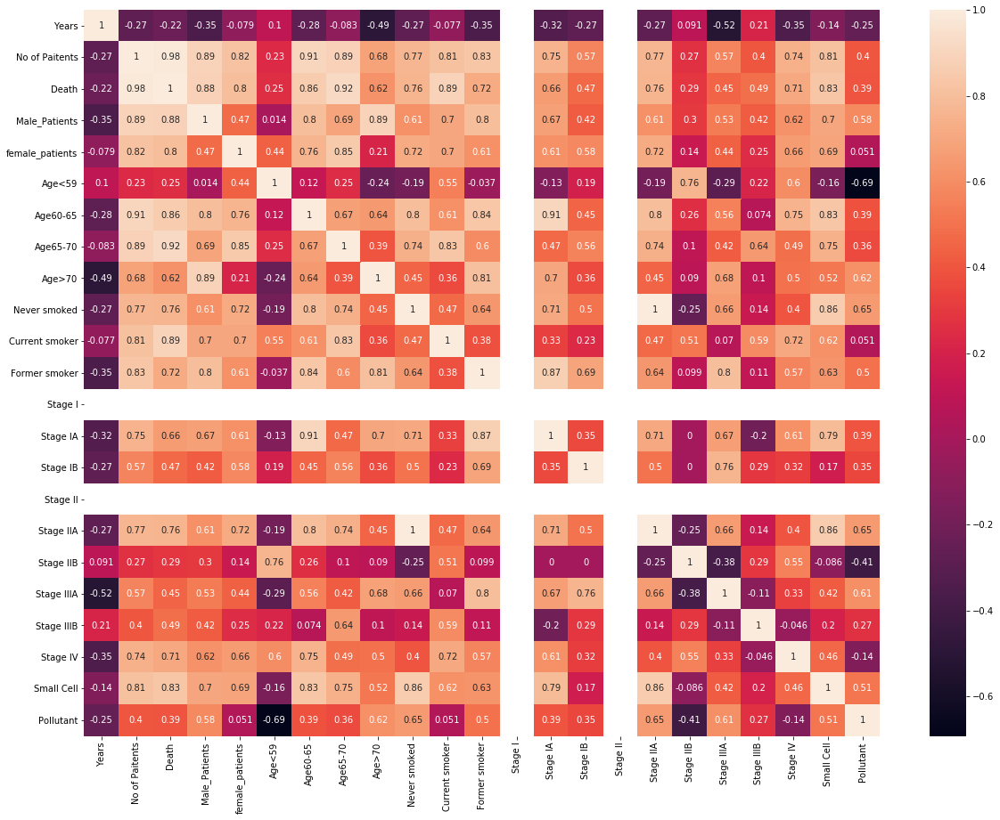

State : NE
Pollutant : PM2.5
Status : 
Data Not available!!
State : NE
Pollutant : PM10
Status : 
Data Not available!!
State : NE
Pollutant : Pb
Status : 
Data Not available!!
State : NE
Pollutant : CO
Status : 
Data Not available!!
State : NE
Pollutant : NO2
Status : 
Data Not available!!
State : NE
Pollutant : SO2
Status : 
Data Not available!!
State : NH
Pollutant : O3
Status : 
Group(k) : 33


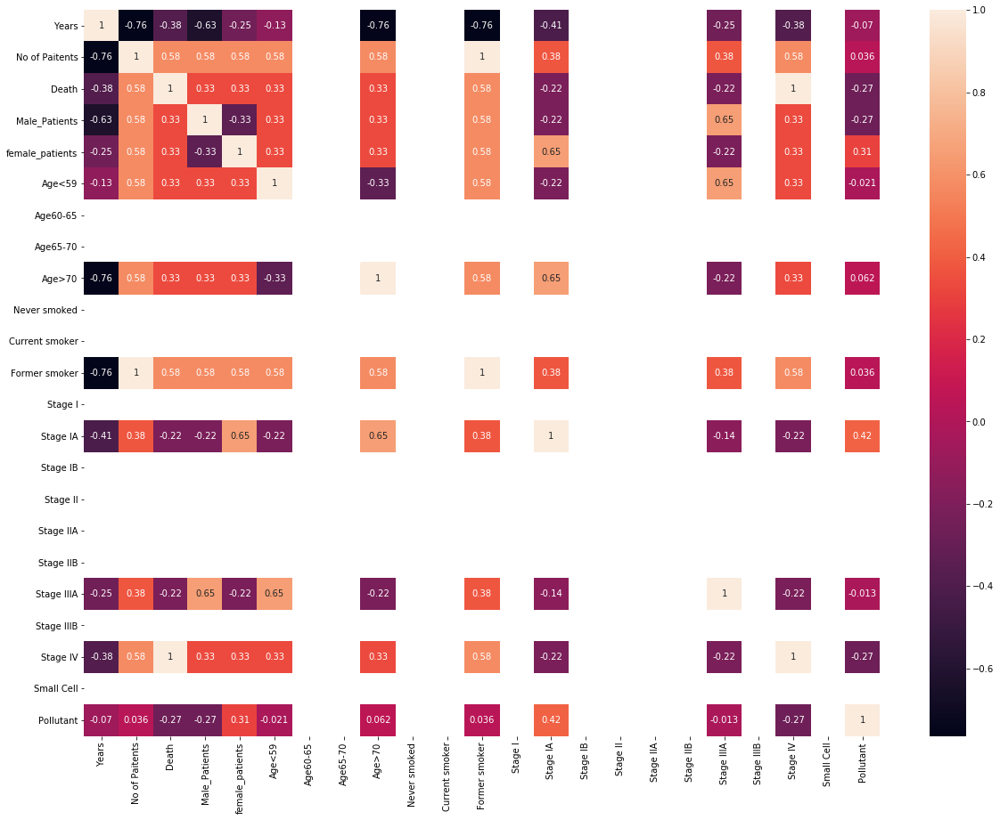

State : NH
Pollutant : PM2.5
Status : 
Data Not available!!
State : NH
Pollutant : PM10
Status : 
Data Not available!!
State : NH
Pollutant : Pb
Status : 
Data Not available!!
State : NH
Pollutant : CO
Status : 
Data Not available!!
State : NH
Pollutant : NO2
Status : 
Group(k) : 33


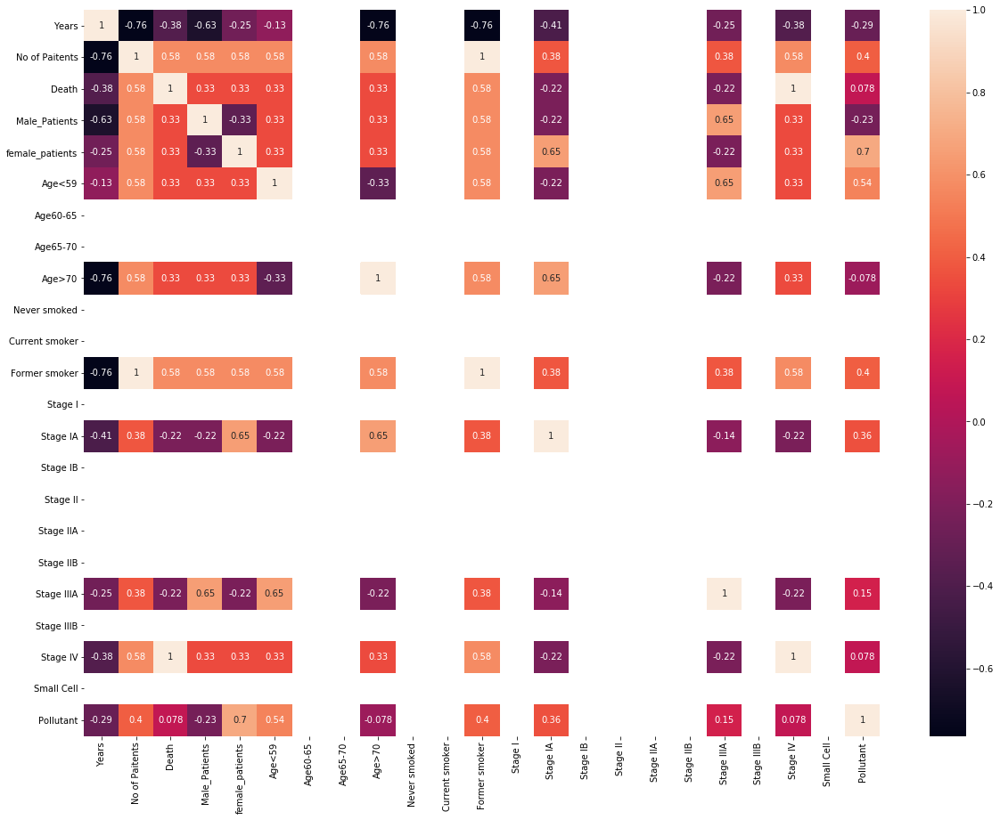

State : NH
Pollutant : SO2
Status : 
Data Not available!!
State : NJ
Pollutant : O3
Status : 
Group(k) : 34


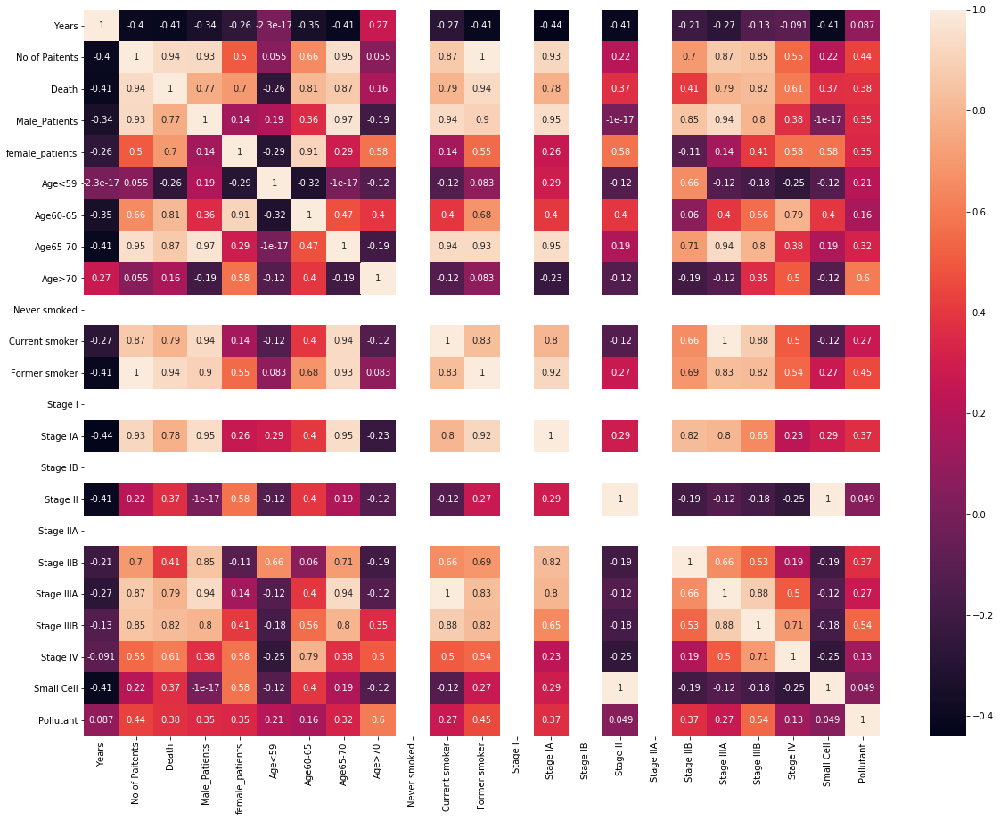

State : NJ
Pollutant : PM2.5
Status : 
Data Not available!!
State : NJ
Pollutant : PM10
Status : 
Data Not available!!
State : NJ
Pollutant : Pb
Status : 
Data Not available!!
State : NJ
Pollutant : CO
Status : 
Data Not available!!
State : NJ
Pollutant : NO2
Status : 
Data Not available!!
State : NJ
Pollutant : SO2
Status : 
Data Not available!!
State : NM
Pollutant : O3
Status : 
Group(k) : 35


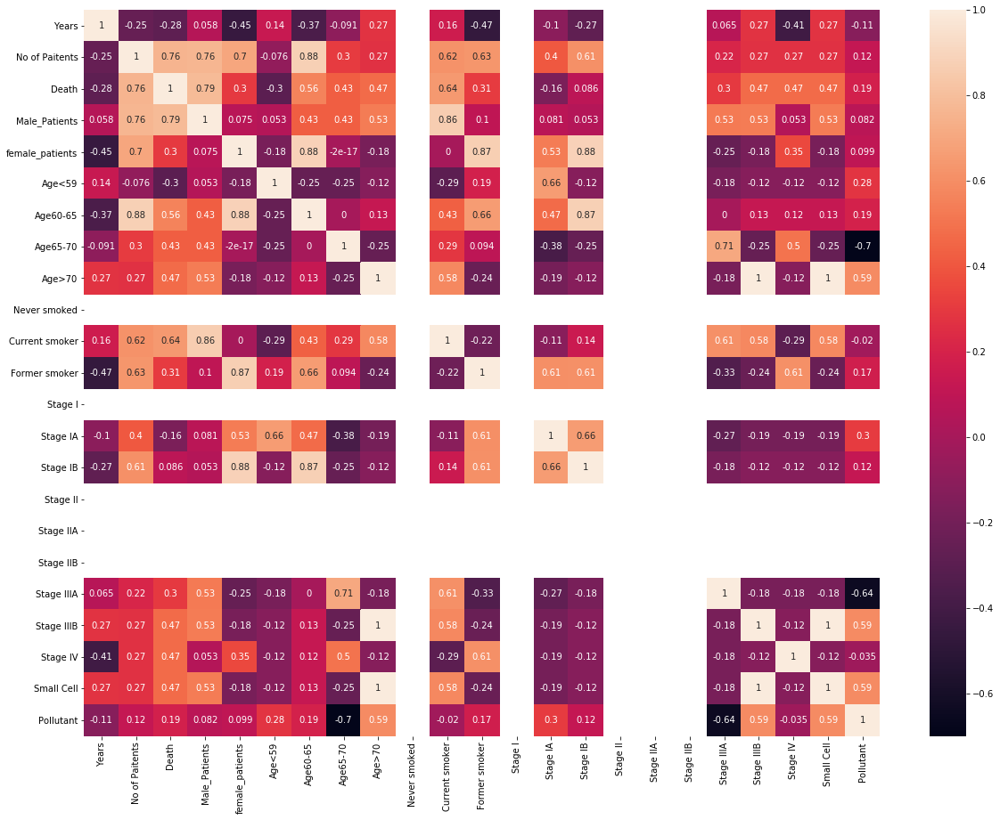

State : NM
Pollutant : PM2.5
Status : 
Data Not available!!
State : NM
Pollutant : PM10
Status : 
Data Not available!!
State : NM
Pollutant : Pb
Status : 
Data Not available!!
State : NM
Pollutant : CO
Status : 
Group(k) : 35


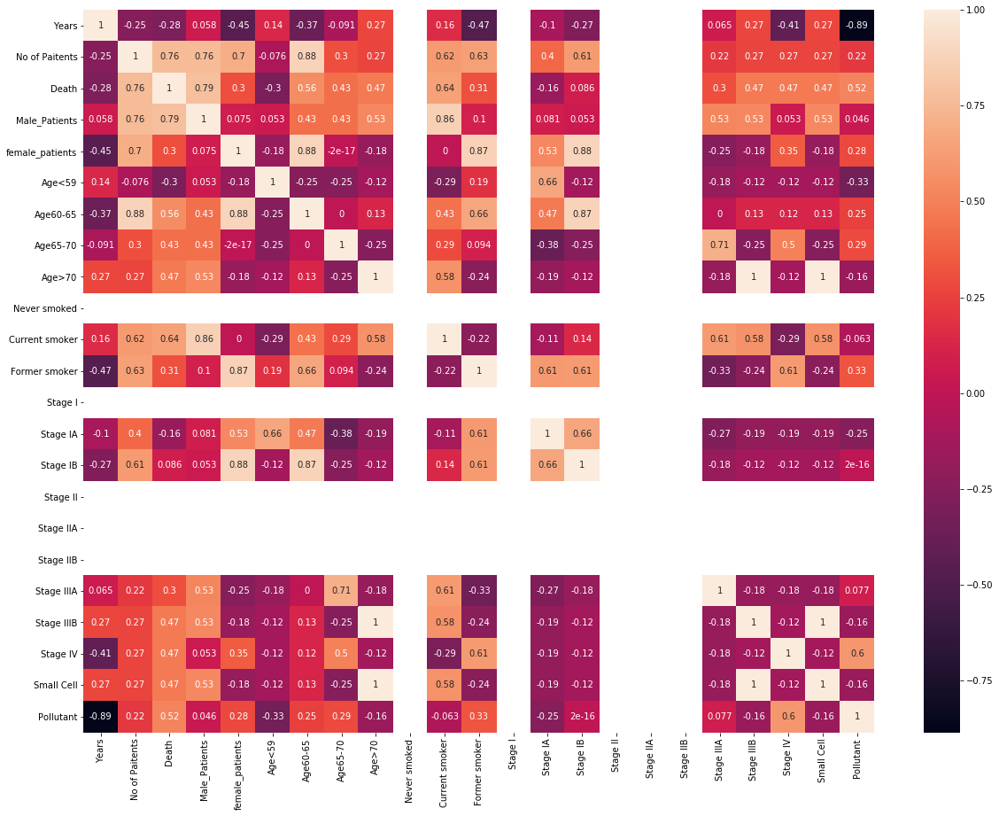

State : NM
Pollutant : NO2
Status : 
Data Not available!!
State : NM
Pollutant : SO2
Status : 
Data Not available!!
State : NV
Pollutant : O3
Status : 
Data Not available!!
State : NV
Pollutant : PM2.5
Status : 
Data Not available!!
State : NV
Pollutant : PM10
Status : 
Data Not available!!
State : NV
Pollutant : Pb
Status : 
Data Not available!!
State : NV
Pollutant : CO
Status : 
Group(k) : 32


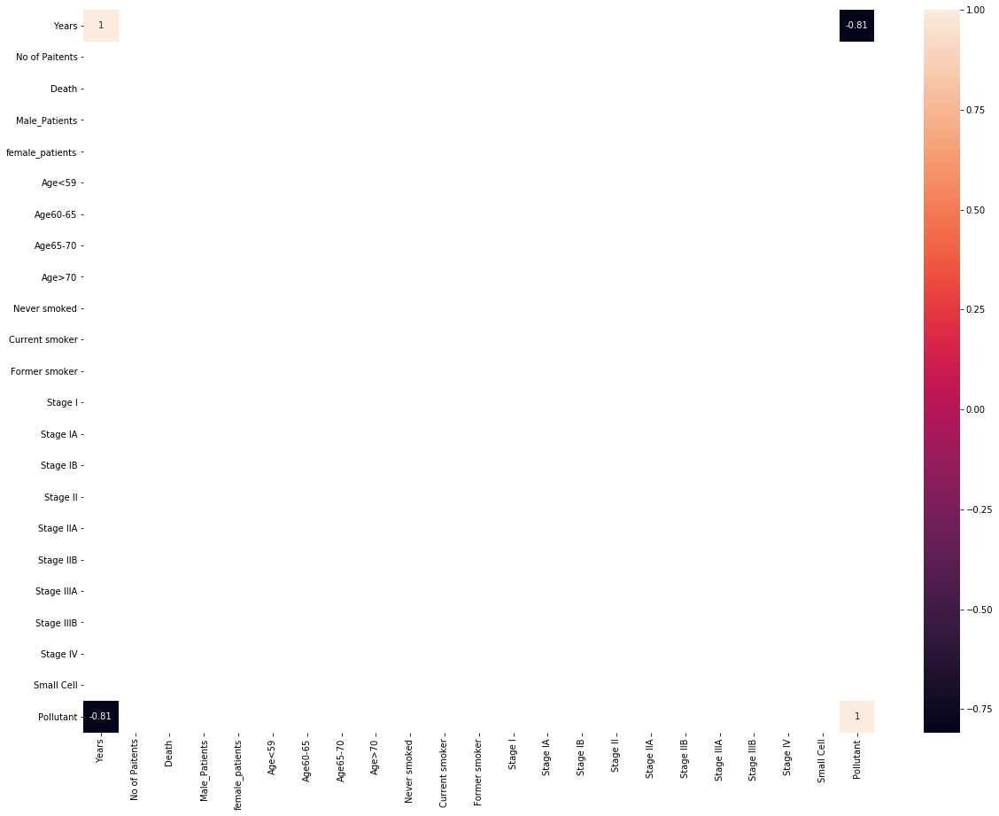

State : NV
Pollutant : NO2
Status : 
Data Not available!!
State : NV
Pollutant : SO2
Status : 
Data Not available!!
State : NY
Pollutant : O3
Status : 
Group(k) : 36


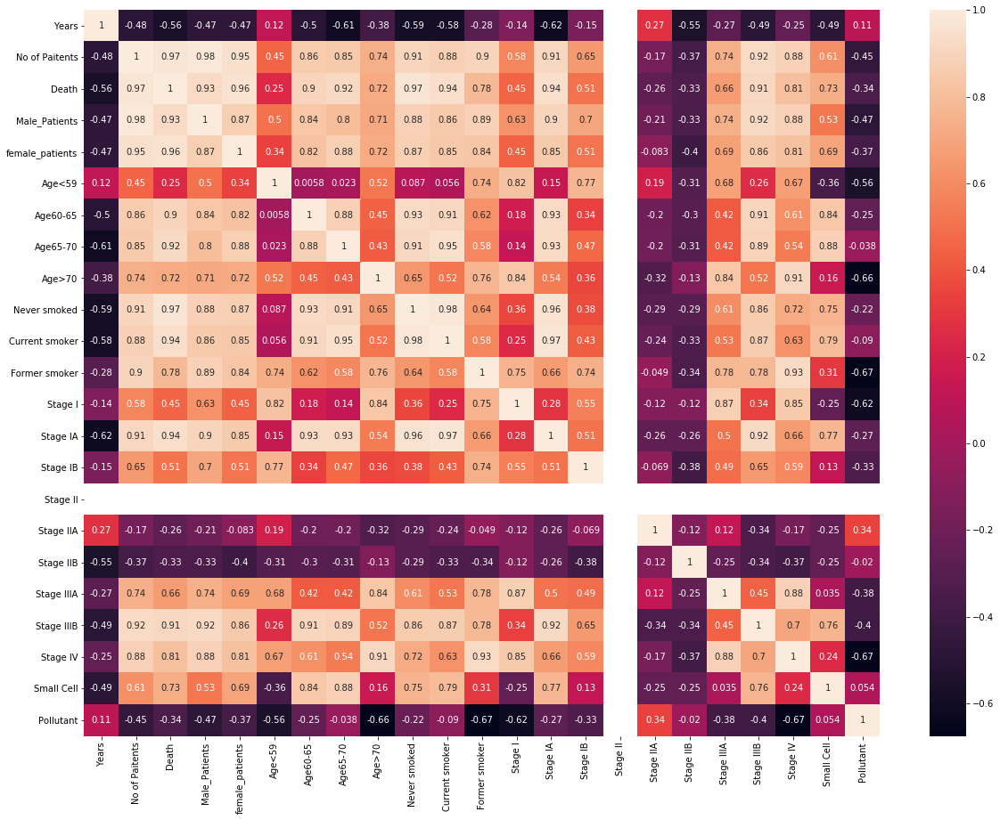

State : NY
Pollutant : PM2.5
Status : 
Data Not available!!
State : NY
Pollutant : PM10
Status : 
Data Not available!!
State : NY
Pollutant : Pb
Status : 
Data Not available!!
State : NY
Pollutant : CO
Status : 
Group(k) : 36


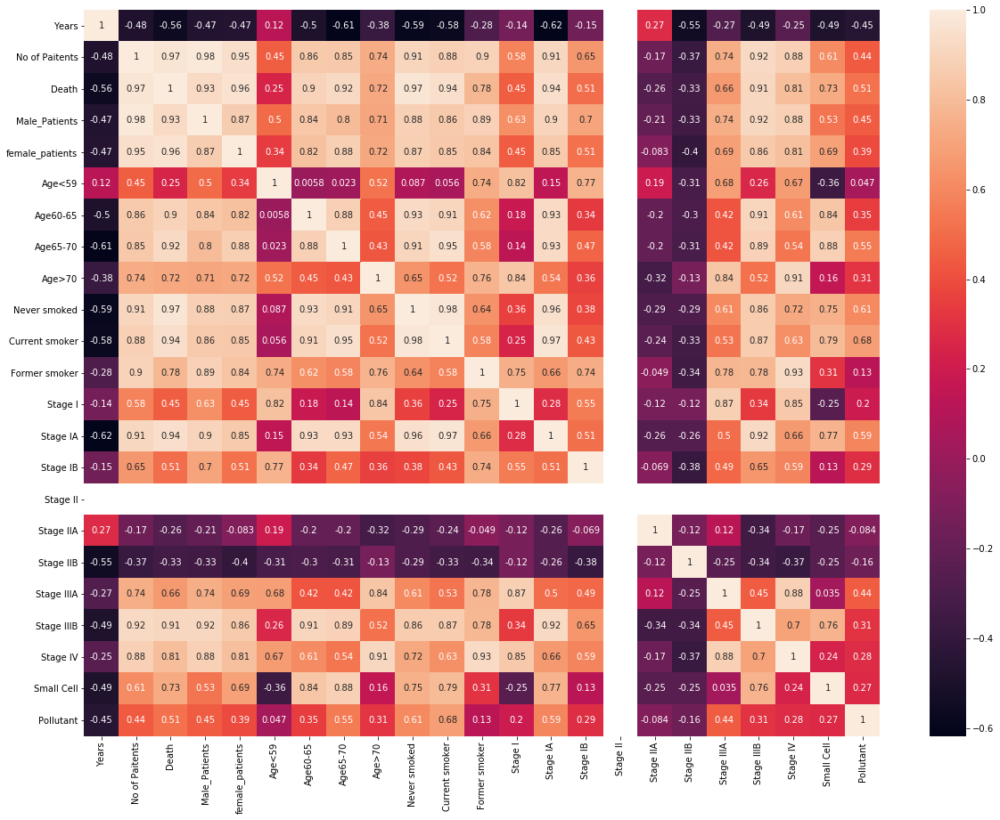

State : NY
Pollutant : NO2
Status : 
Data Not available!!
State : NY
Pollutant : SO2
Status : 
Data Not available!!
State : OH
Pollutant : O3
Status : 
Group(k) : 39


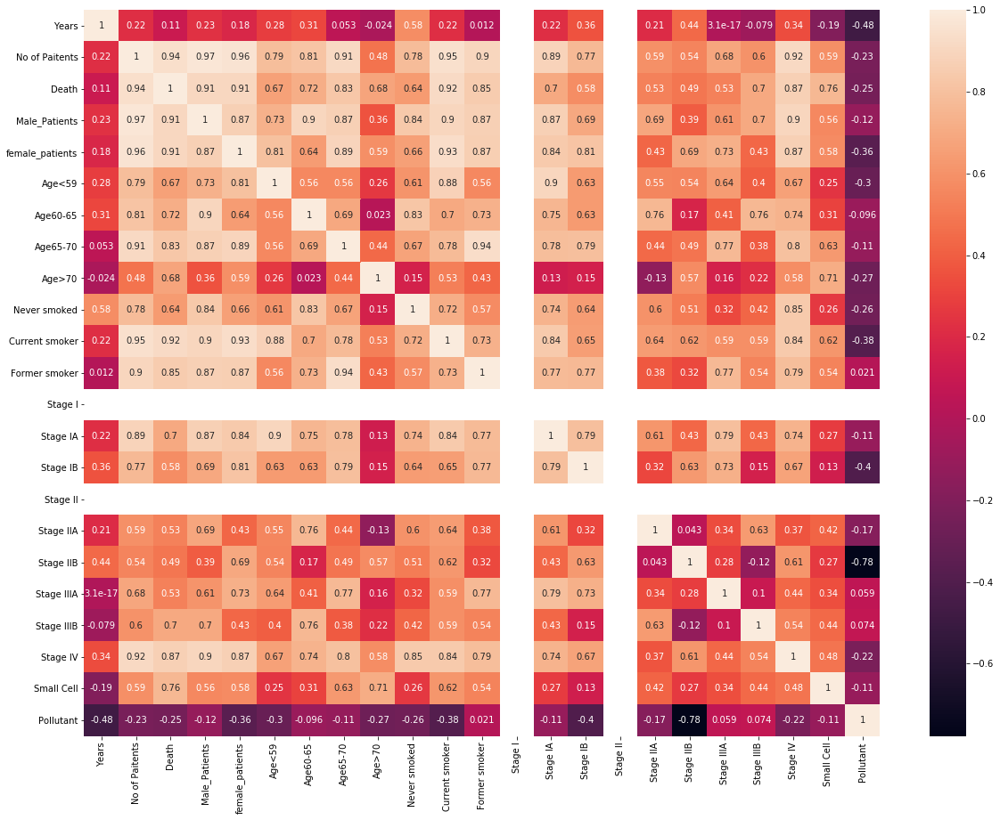

State : OH
Pollutant : PM2.5
Status : 
Data Not available!!
State : OH
Pollutant : PM10
Status : 
Group(k) : 39


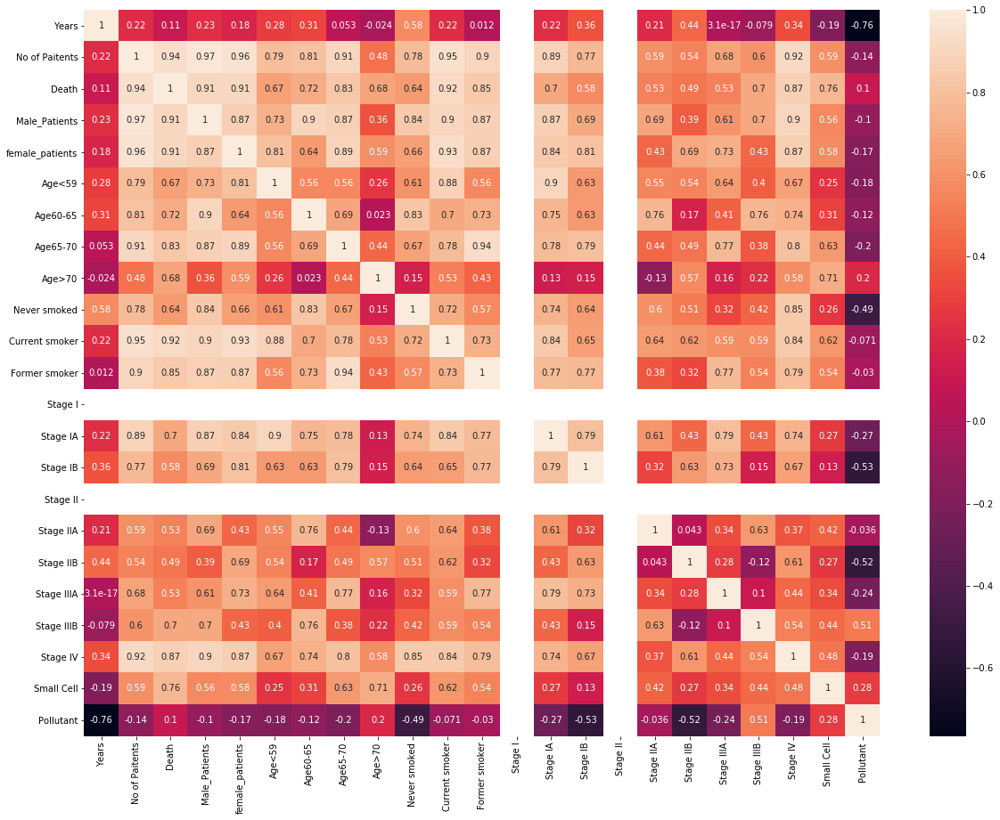

State : OH
Pollutant : Pb
Status : 
Data Not available!!
State : OH
Pollutant : CO
Status : 
Group(k) : 39


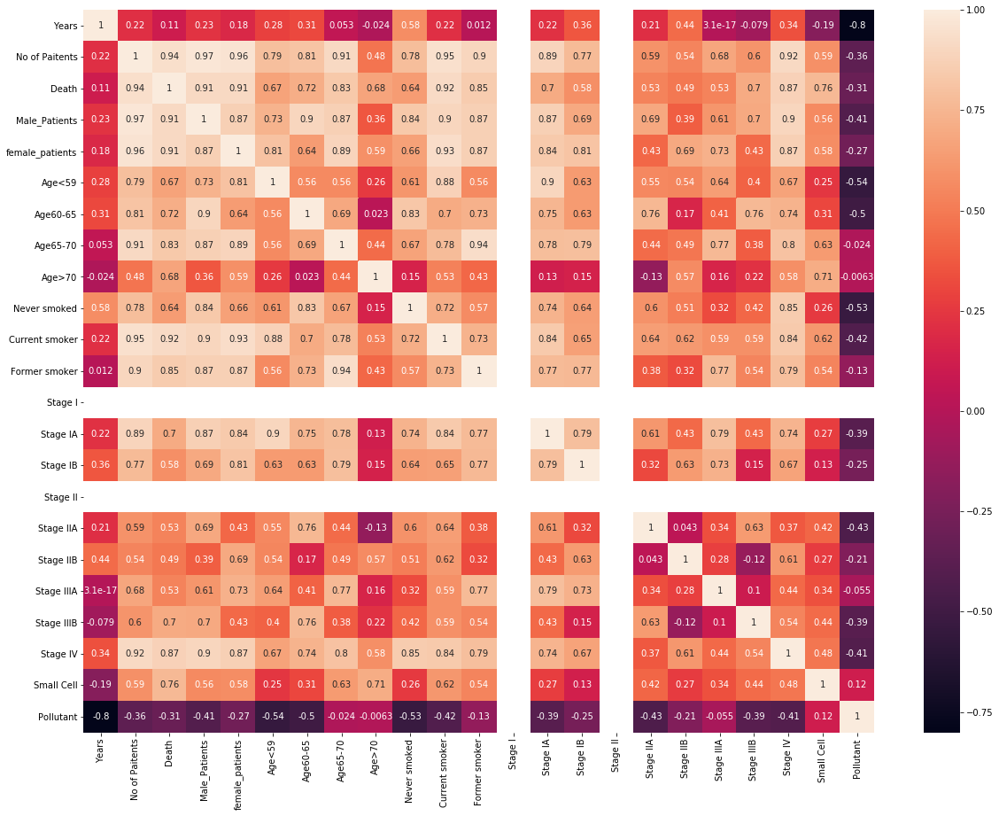

State : OH
Pollutant : NO2
Status : 
Data Not available!!
State : OH
Pollutant : SO2
Status : 
Data Not available!!
State : OK
Pollutant : O3
Status : 
Group(k) : 40


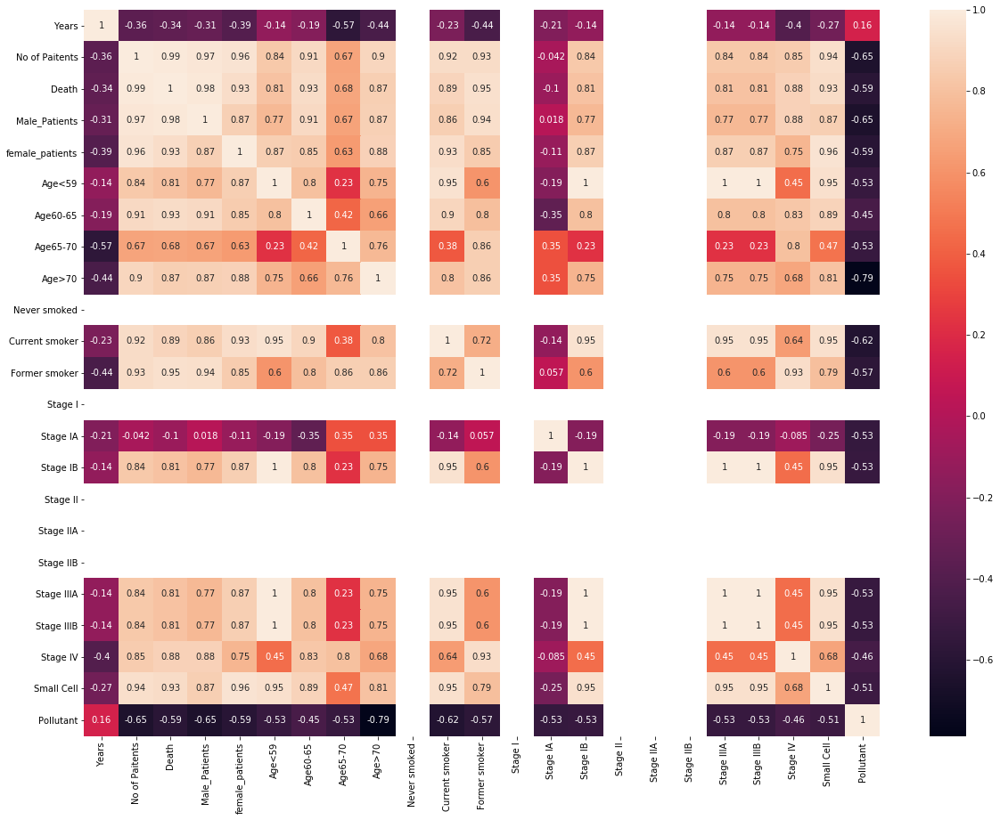

State : OK
Pollutant : PM2.5
Status : 
Data Not available!!
State : OK
Pollutant : PM10
Status : 
Data Not available!!
State : OK
Pollutant : Pb
Status : 
Data Not available!!
State : OK
Pollutant : CO
Status : 
Data Not available!!
State : OK
Pollutant : NO2
Status : 
Group(k) : 40


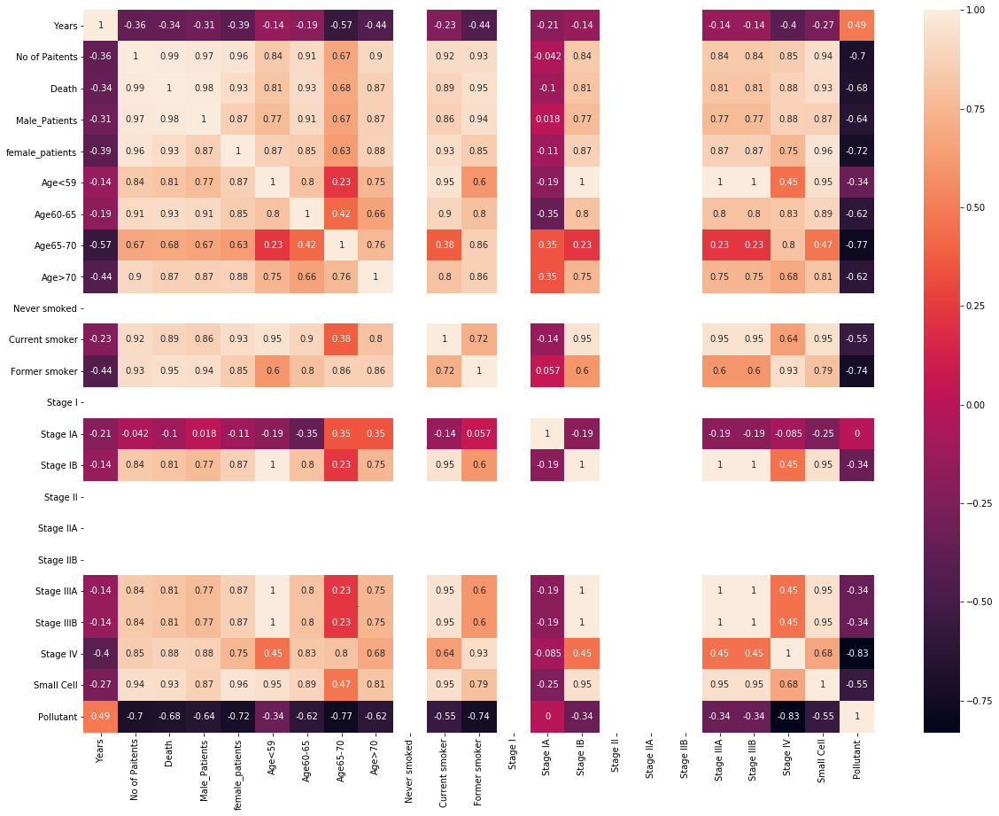

State : OK
Pollutant : SO2
Status : 
Group(k) : 40


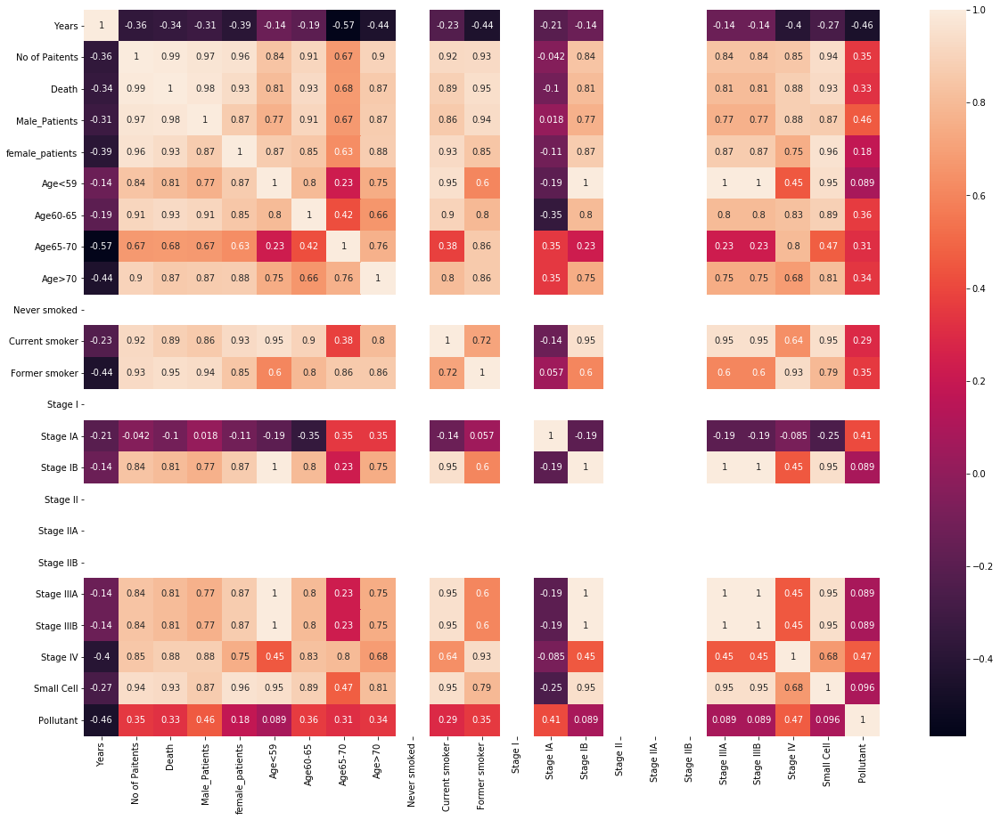

State : OR
Pollutant : O3
Status : 
Group(k) : 41


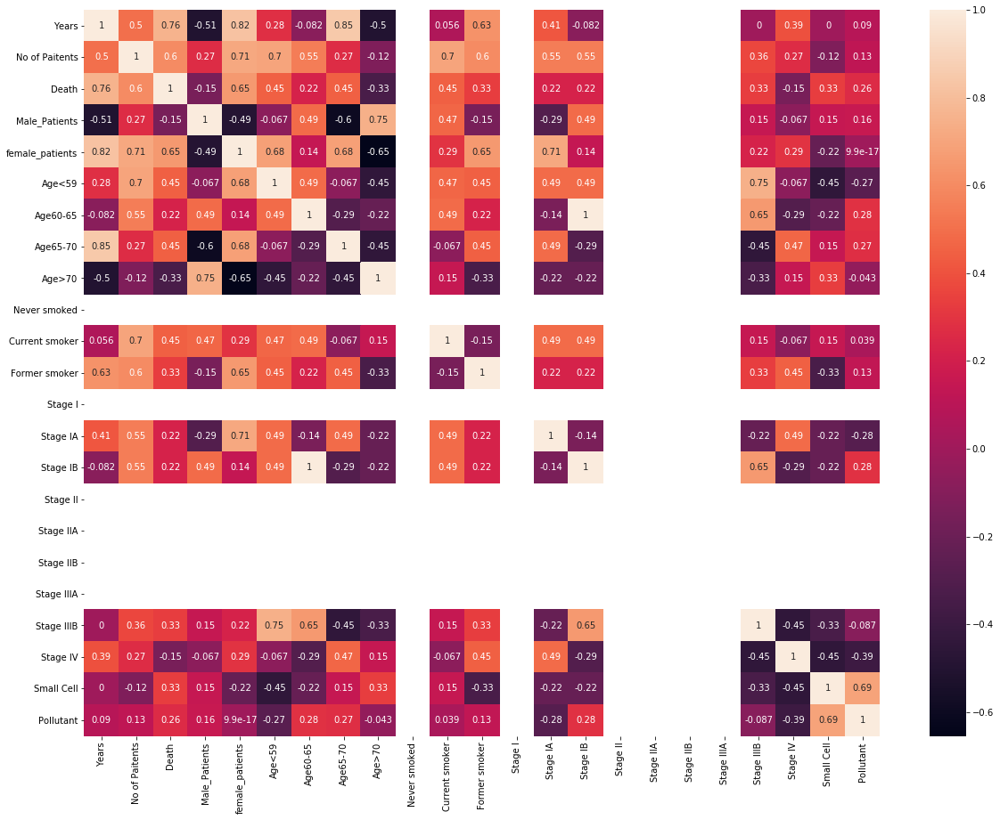

State : OR
Pollutant : PM2.5
Status : 
Data Not available!!
State : OR
Pollutant : PM10
Status : 
Data Not available!!
State : OR
Pollutant : Pb
Status : 
Data Not available!!
State : OR
Pollutant : CO
Status : 
Data Not available!!
State : OR
Pollutant : NO2
Status : 
Data Not available!!
State : OR
Pollutant : SO2
Status : 
Data Not available!!
State : PA
Pollutant : O3
Status : 
Group(k) : 42


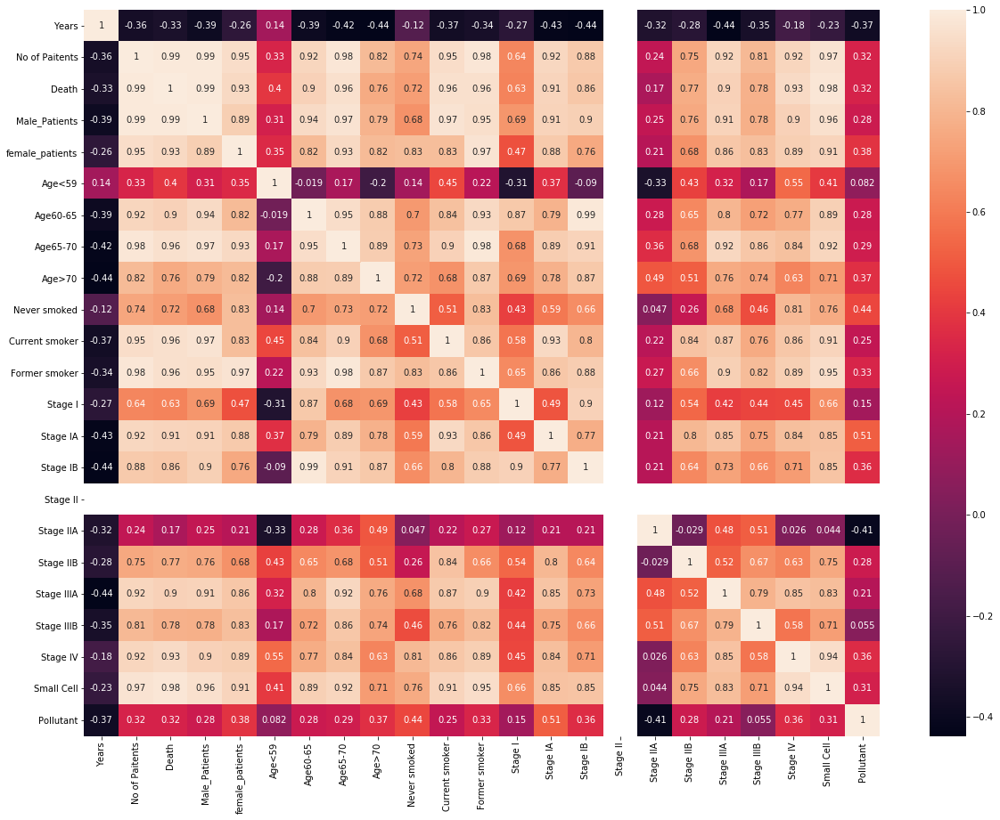

State : PA
Pollutant : PM2.5
Status : 
Data Not available!!
State : PA
Pollutant : PM10
Status : 
Data Not available!!
State : PA
Pollutant : Pb
Status : 
Group(k) : 42


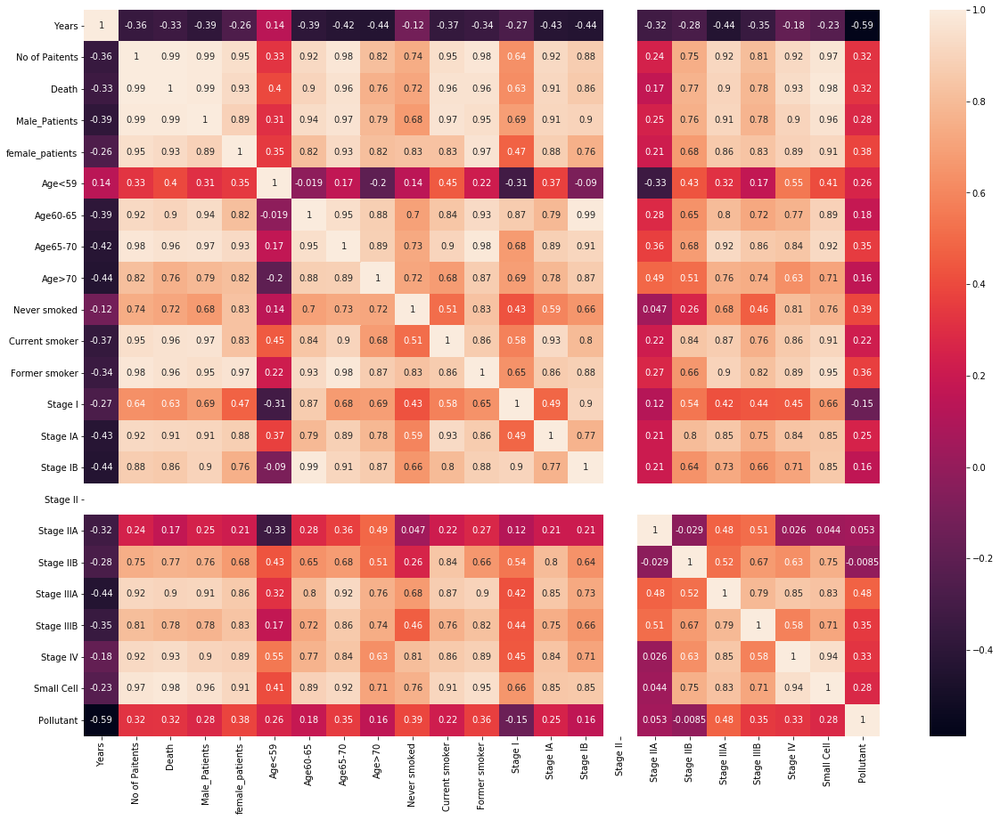

State : PA
Pollutant : CO
Status : 
Group(k) : 42


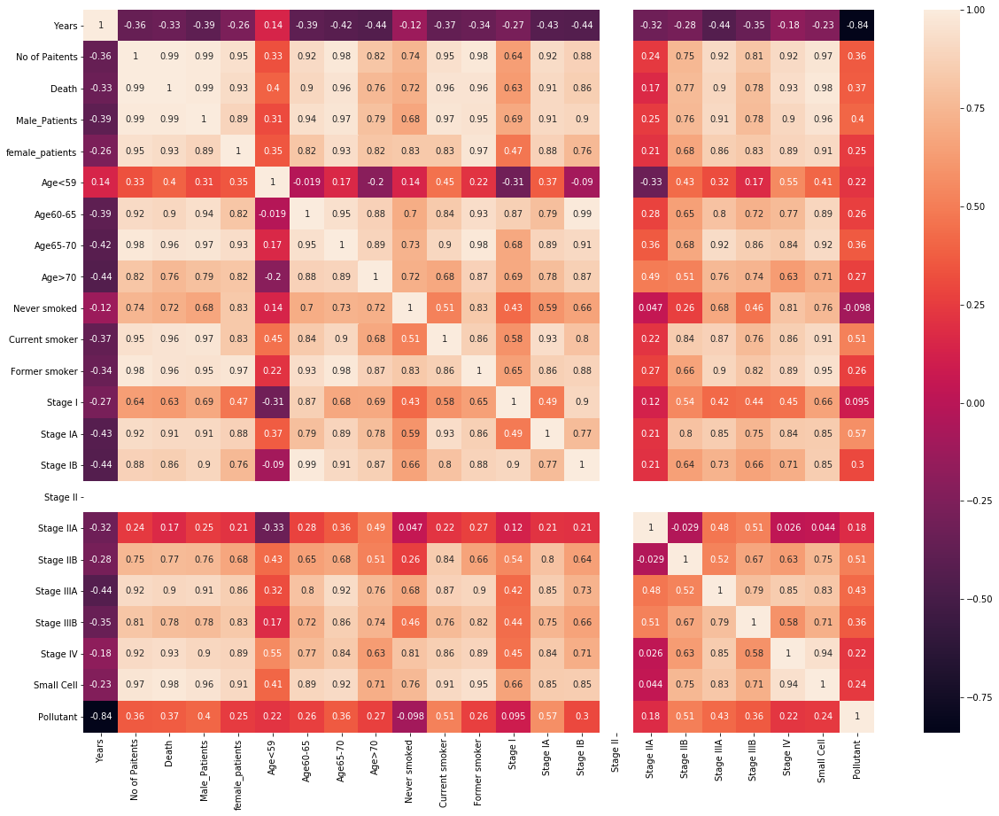

State : PA
Pollutant : NO2
Status : 
Group(k) : 42


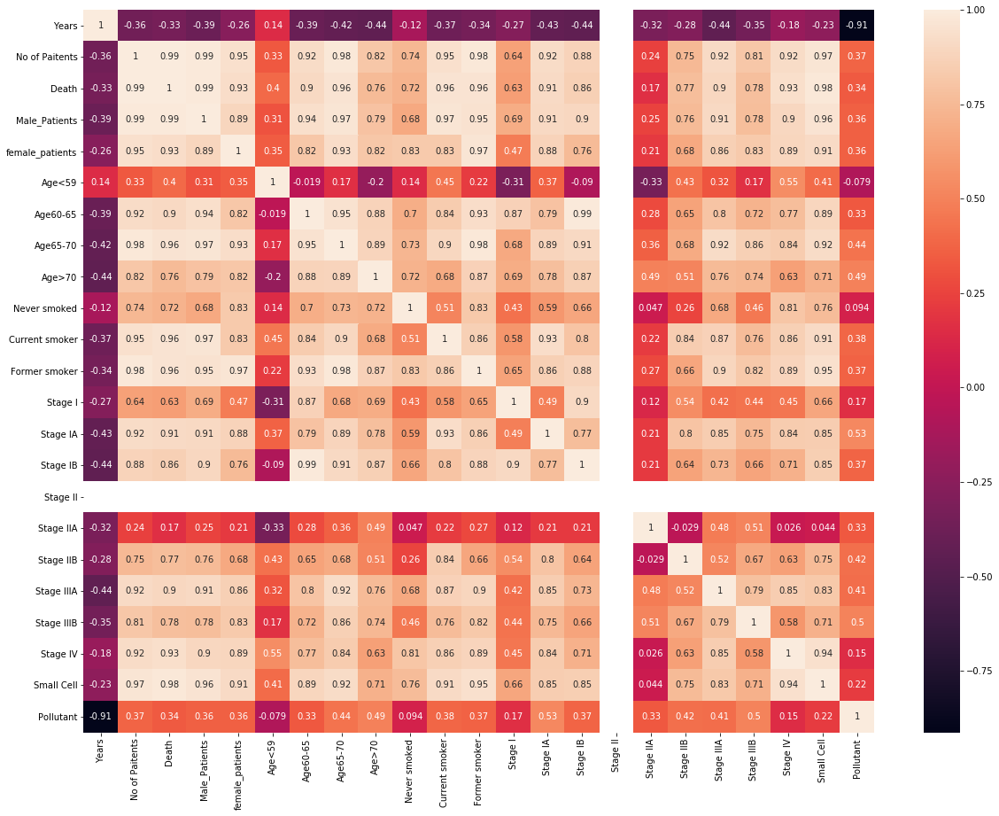

State : PA
Pollutant : SO2
Status : 
Data Not available!!
State : SC
Pollutant : O3
Status : 
Group(k) : 45


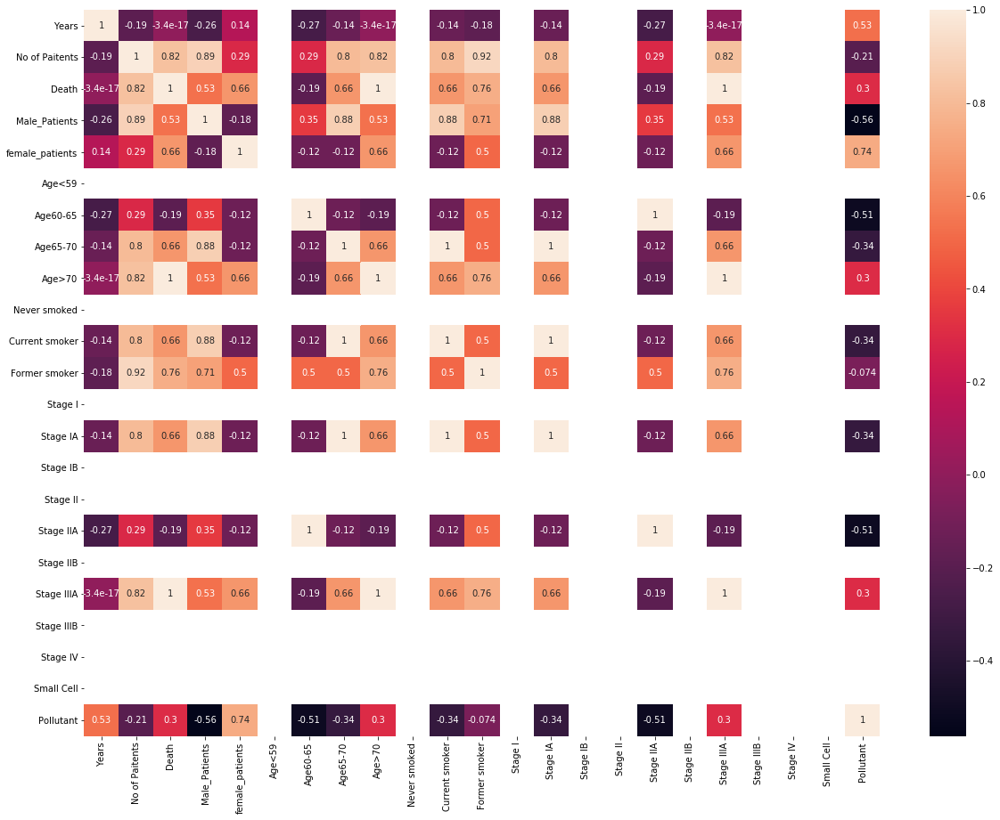

State : SC
Pollutant : PM2.5
Status : 
Data Not available!!
State : SC
Pollutant : PM10
Status : 
Data Not available!!
State : SC
Pollutant : Pb
Status : 
Data Not available!!
State : SC
Pollutant : CO
Status : 
Data Not available!!
State : SC
Pollutant : NO2
Status : 
Group(k) : 45


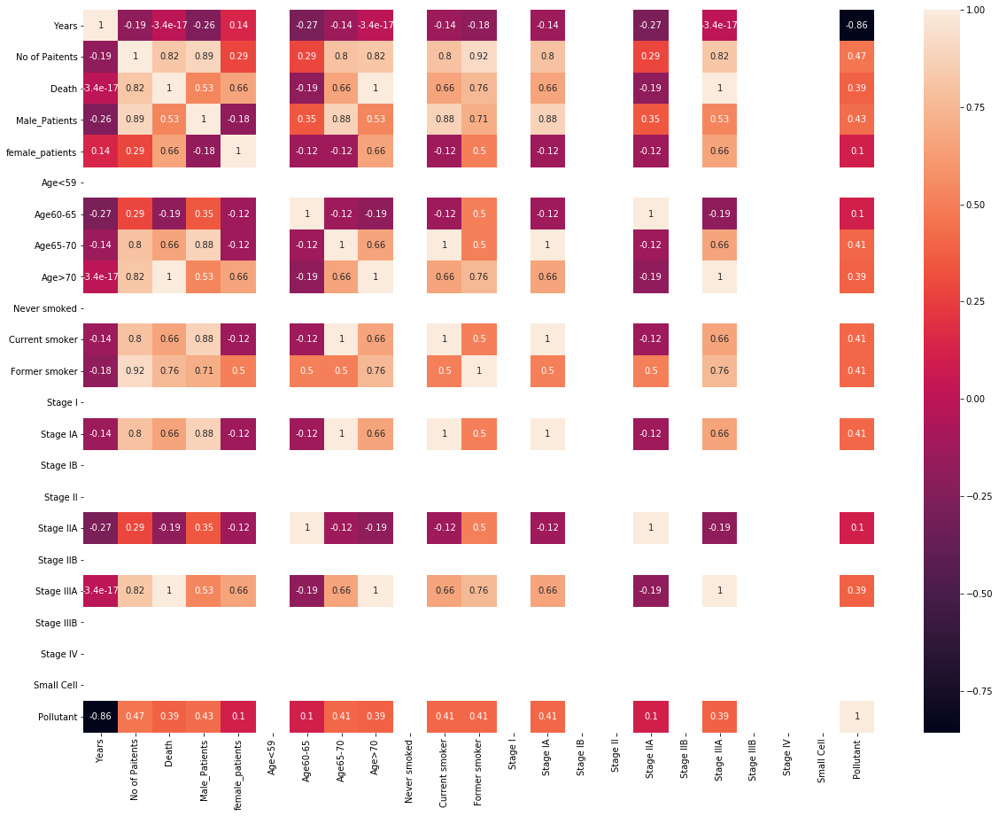

State : SC
Pollutant : SO2
Status : 
Data Not available!!
State : SD
Pollutant : O3
Status : 
Data Not available!!
State : SD
Pollutant : PM2.5
Status : 
Data Not available!!
State : SD
Pollutant : PM10
Status : 
Group(k) : 46


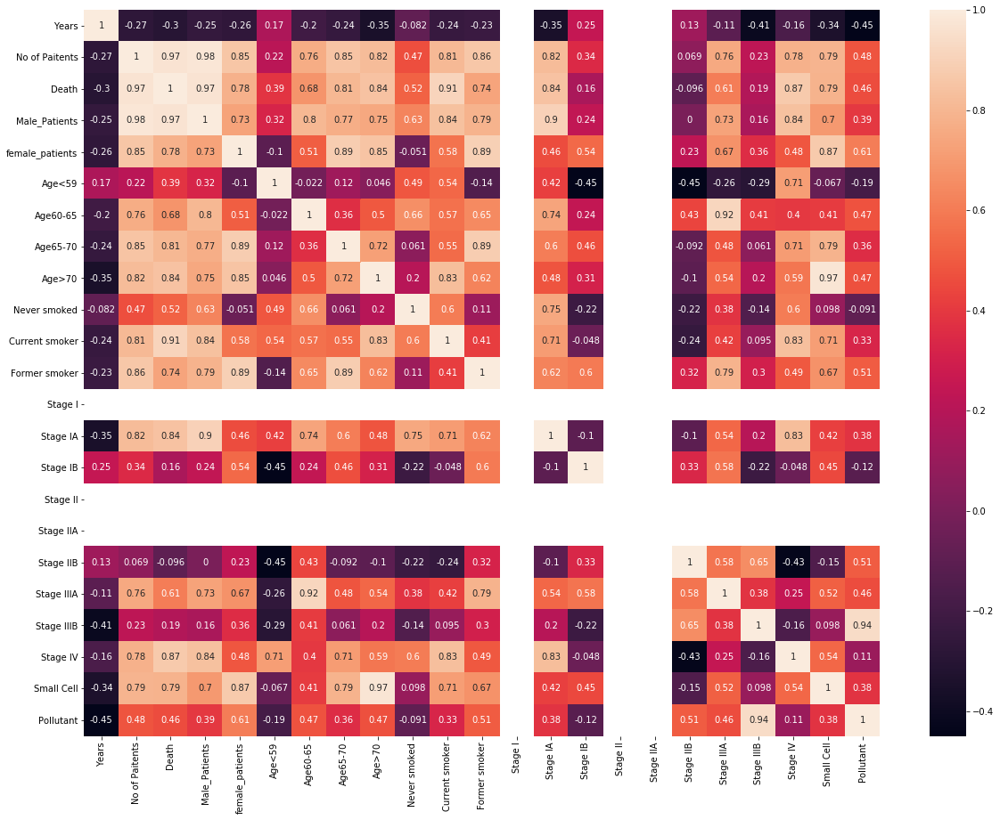

State : SD
Pollutant : Pb
Status : 
Data Not available!!
State : SD
Pollutant : CO
Status : 
Data Not available!!
State : SD
Pollutant : NO2
Status : 
Data Not available!!
State : SD
Pollutant : SO2
Status : 
Data Not available!!
State : TN
Pollutant : O3
Status : 
Group(k) : 47


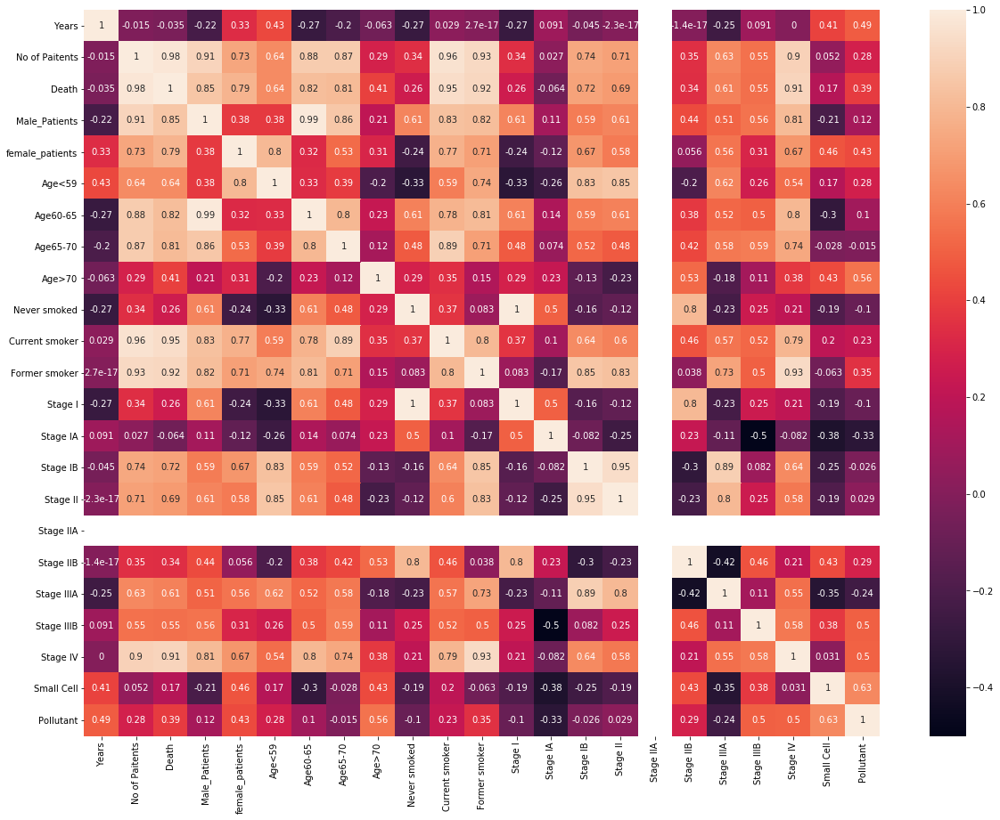

State : TN
Pollutant : PM2.5
Status : 
Data Not available!!
State : TN
Pollutant : PM10
Status : 
Data Not available!!
State : TN
Pollutant : Pb
Status : 
Data Not available!!
State : TN
Pollutant : CO
Status : 
Data Not available!!
State : TN
Pollutant : NO2
Status : 
Group(k) : 47


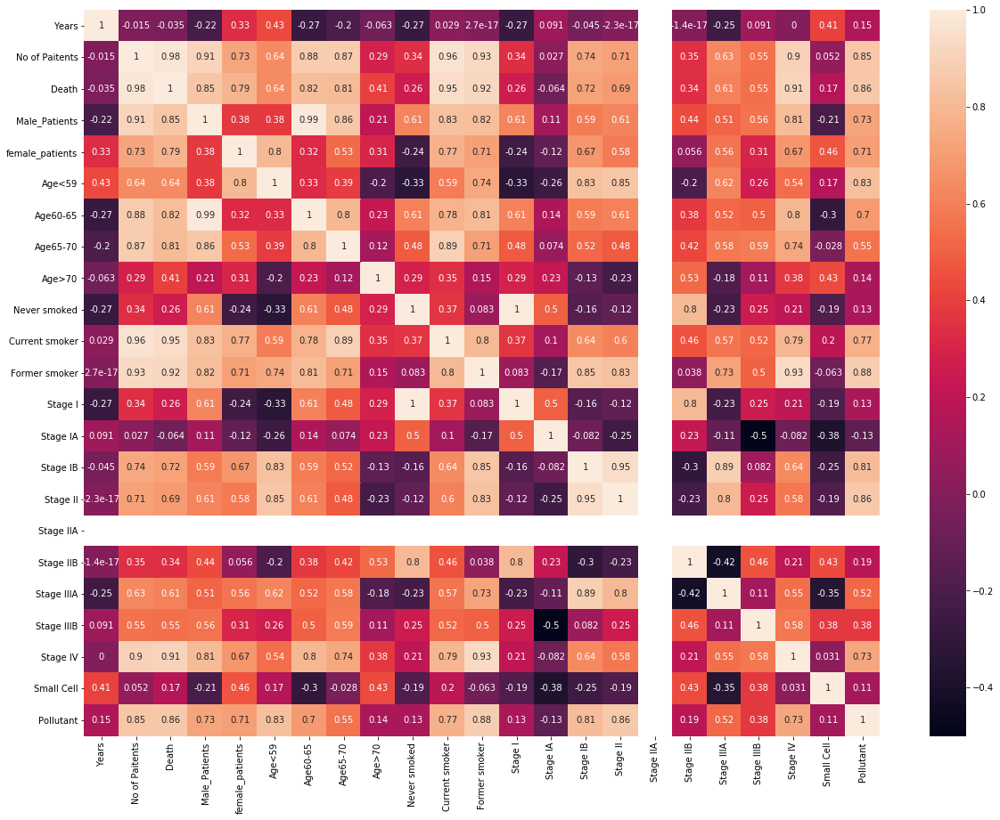

State : TN
Pollutant : SO2
Status : 
Data Not available!!
State : TX
Pollutant : O3
Status : 
Group(k) : 48


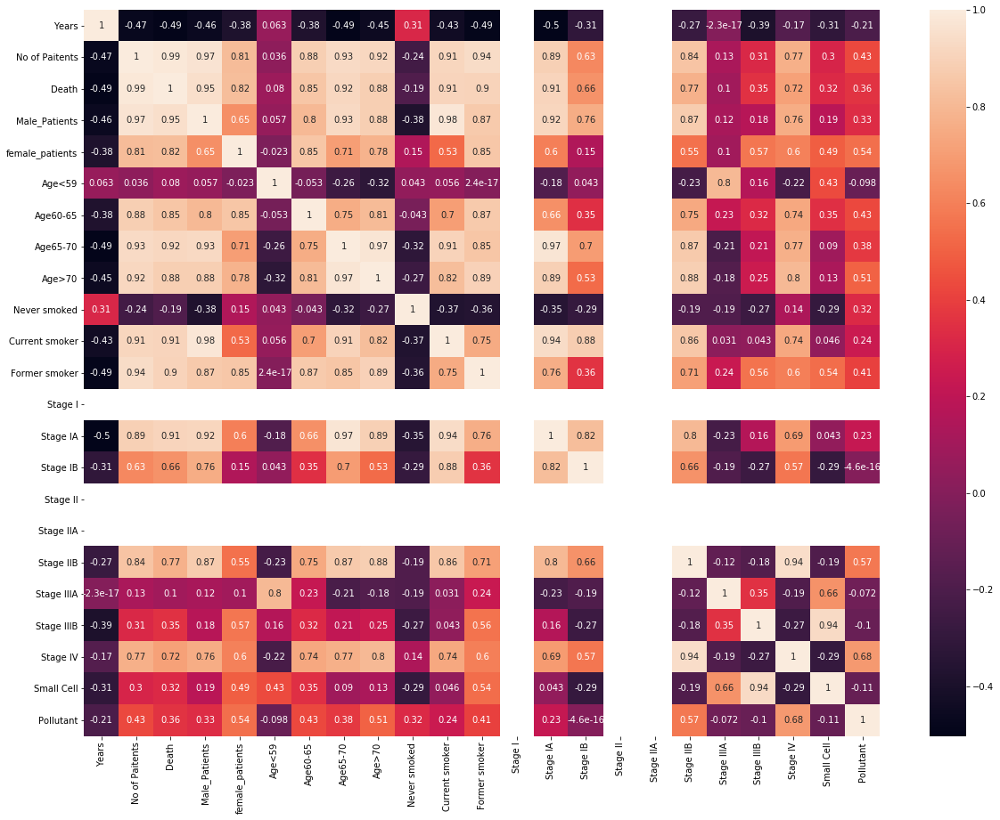

State : TX
Pollutant : PM2.5
Status : 
Data Not available!!
State : TX
Pollutant : PM10
Status : 
Data Not available!!
State : TX
Pollutant : Pb
Status : 
Data Not available!!
State : TX
Pollutant : CO
Status : 
Group(k) : 48


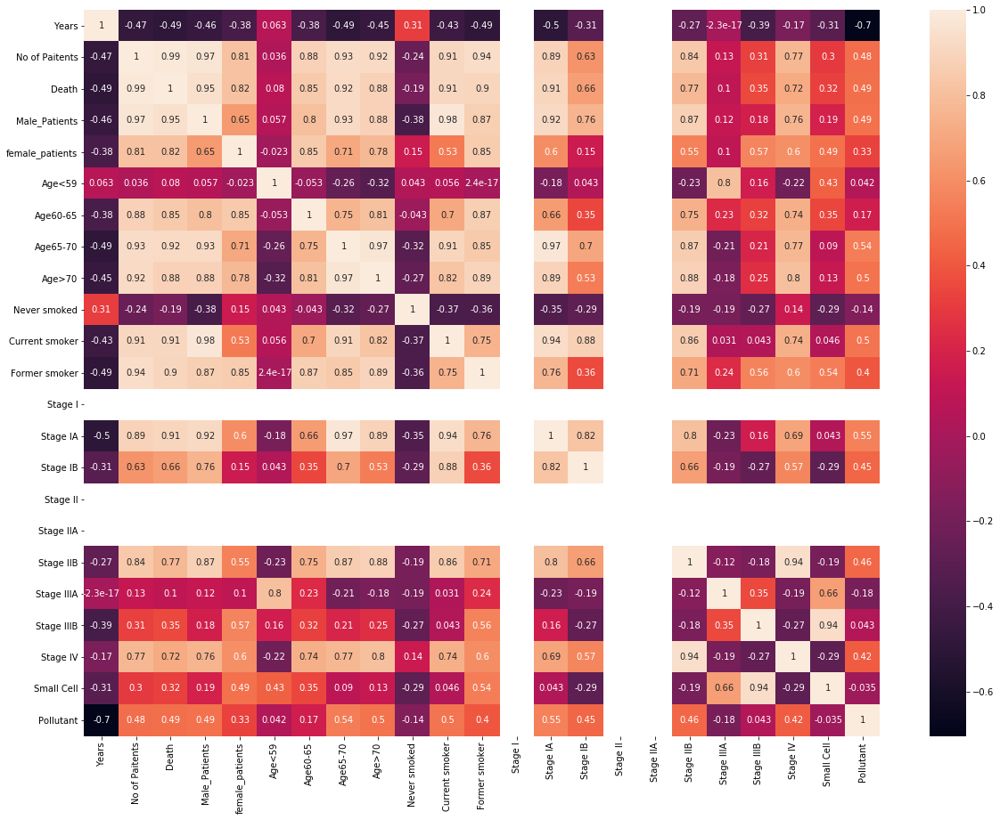

State : TX
Pollutant : NO2
Status : 
Group(k) : 48


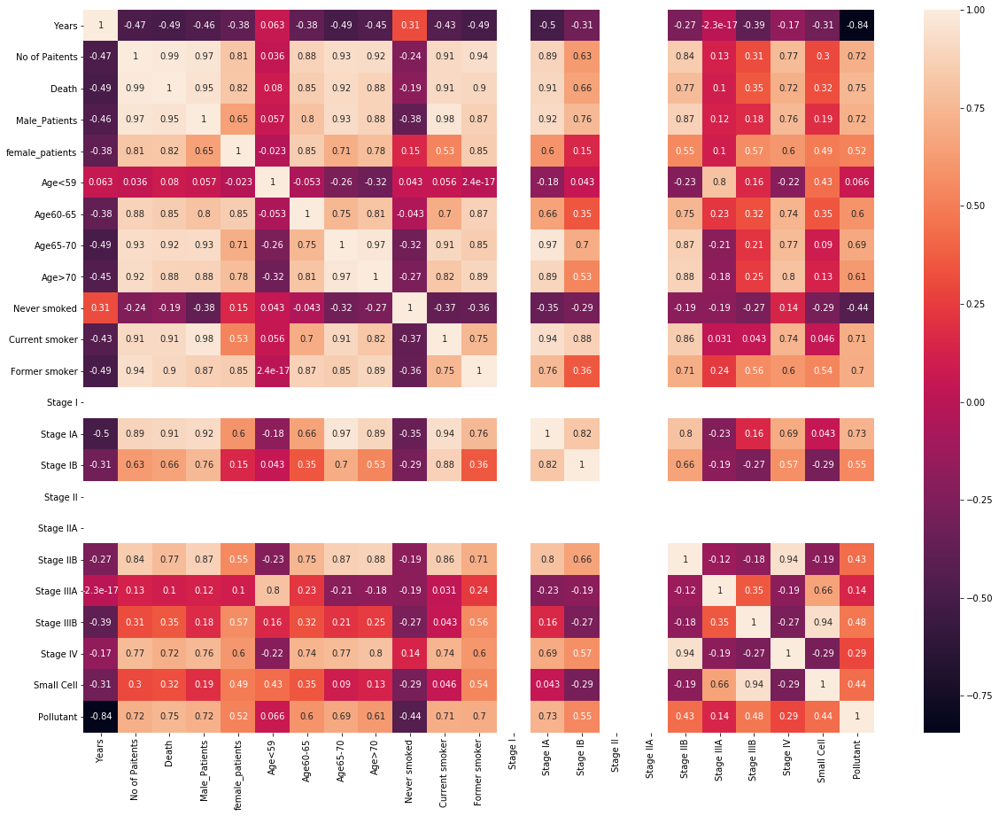

State : TX
Pollutant : SO2
Status : 
Data Not available!!
State : UT
Pollutant : O3
Status : 
Data Not available!!
State : UT
Pollutant : PM2.5
Status : 
Data Not available!!
State : UT
Pollutant : PM10
Status : 
Group(k) : 49


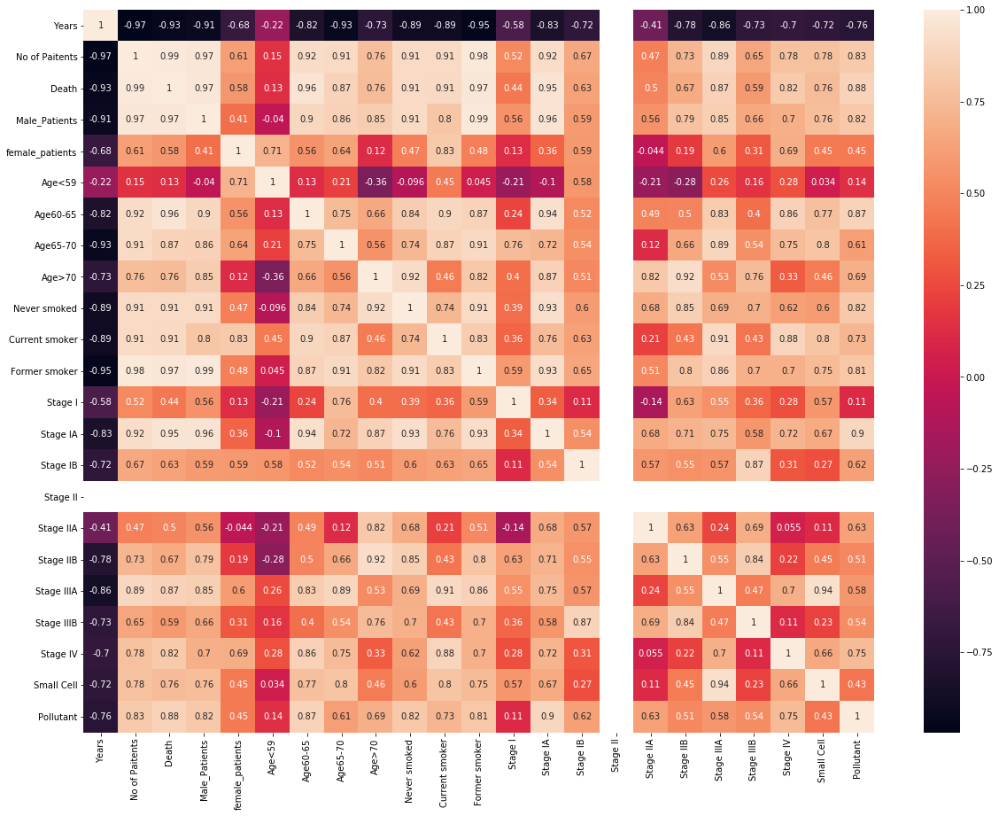

State : UT
Pollutant : Pb
Status : 
Data Not available!!
State : UT
Pollutant : CO
Status : 
Group(k) : 49


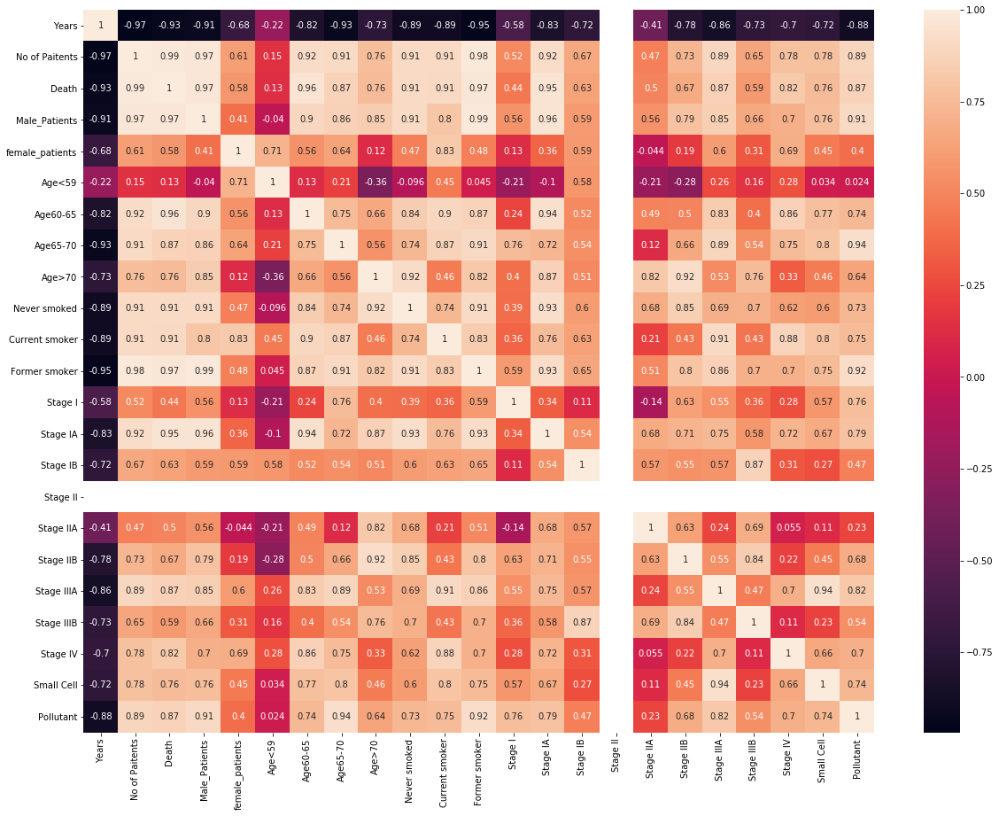

State : UT
Pollutant : NO2
Status : 
Data Not available!!
State : UT
Pollutant : SO2
Status : 
Data Not available!!
State : VA
Pollutant : O3
Status : 
Group(k) : 51


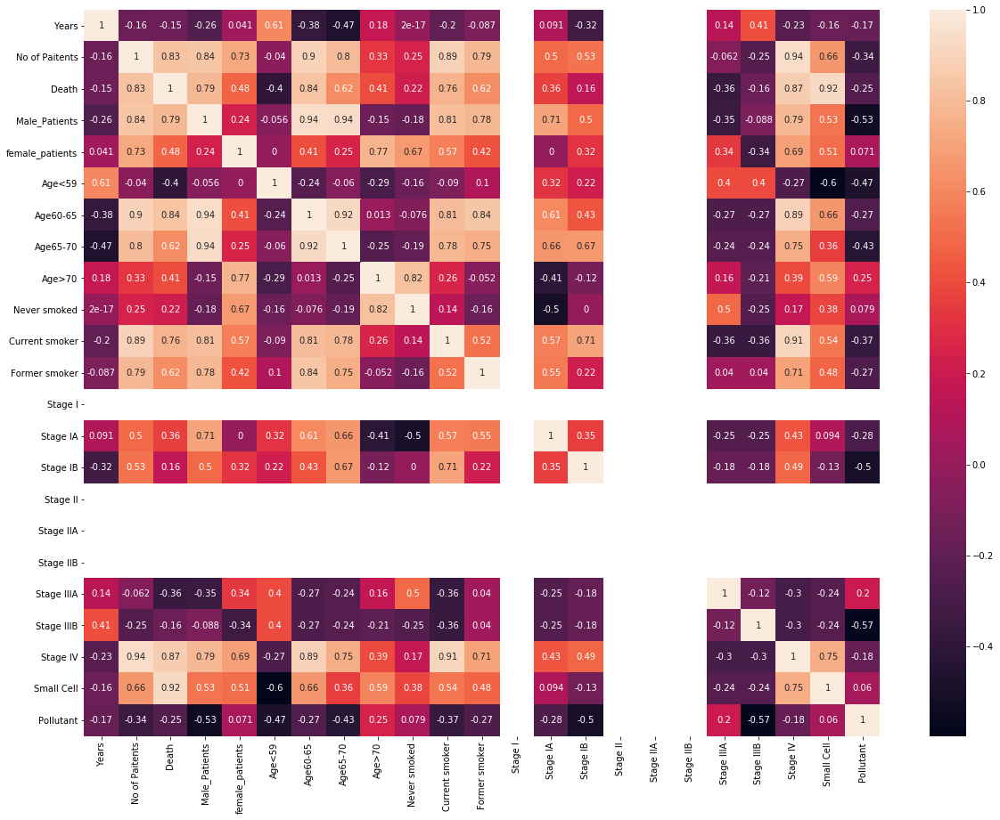

State : VA
Pollutant : PM2.5
Status : 
Data Not available!!
State : VA
Pollutant : PM10
Status : 
Data Not available!!
State : VA
Pollutant : Pb
Status : 
Data Not available!!
State : VA
Pollutant : CO
Status : 
Data Not available!!
State : VA
Pollutant : NO2
Status : 
Group(k) : 51


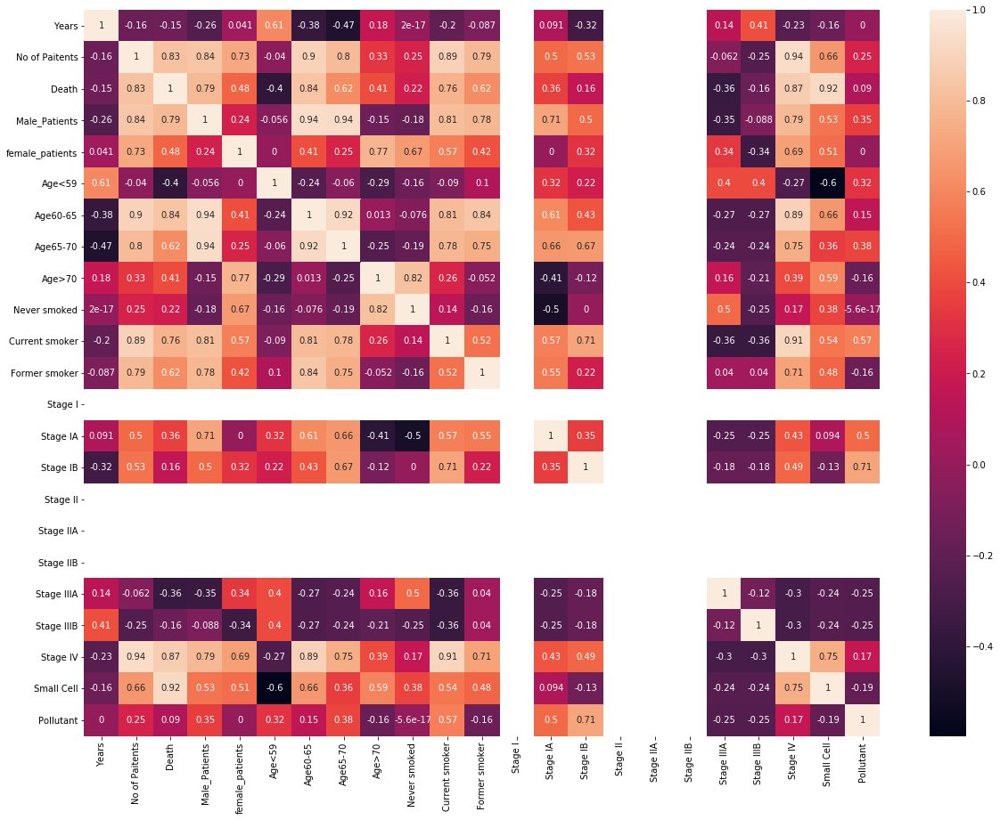

State : VA
Pollutant : SO2
Status : 
Data Not available!!
State : VT
Pollutant : O3
Status : 
Group(k) : 50


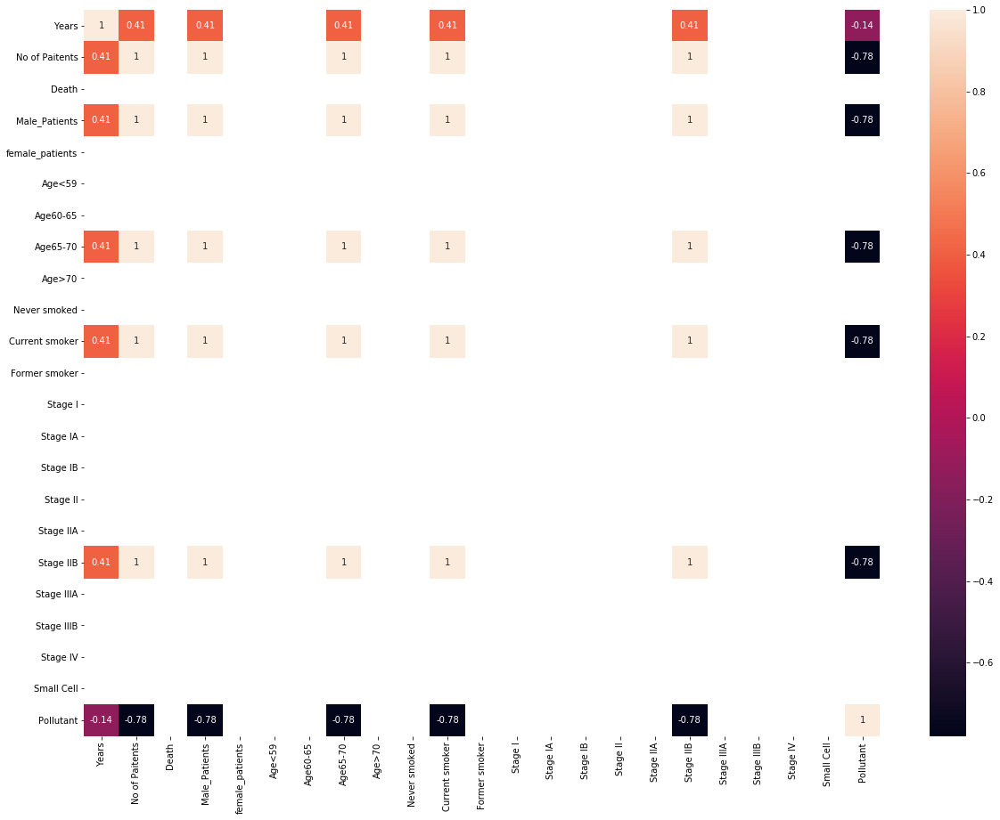

State : VT
Pollutant : PM2.5
Status : 
Data Not available!!
State : VT
Pollutant : PM10
Status : 
Data Not available!!
State : VT
Pollutant : Pb
Status : 
Data Not available!!
State : VT
Pollutant : CO
Status : 
Group(k) : 50


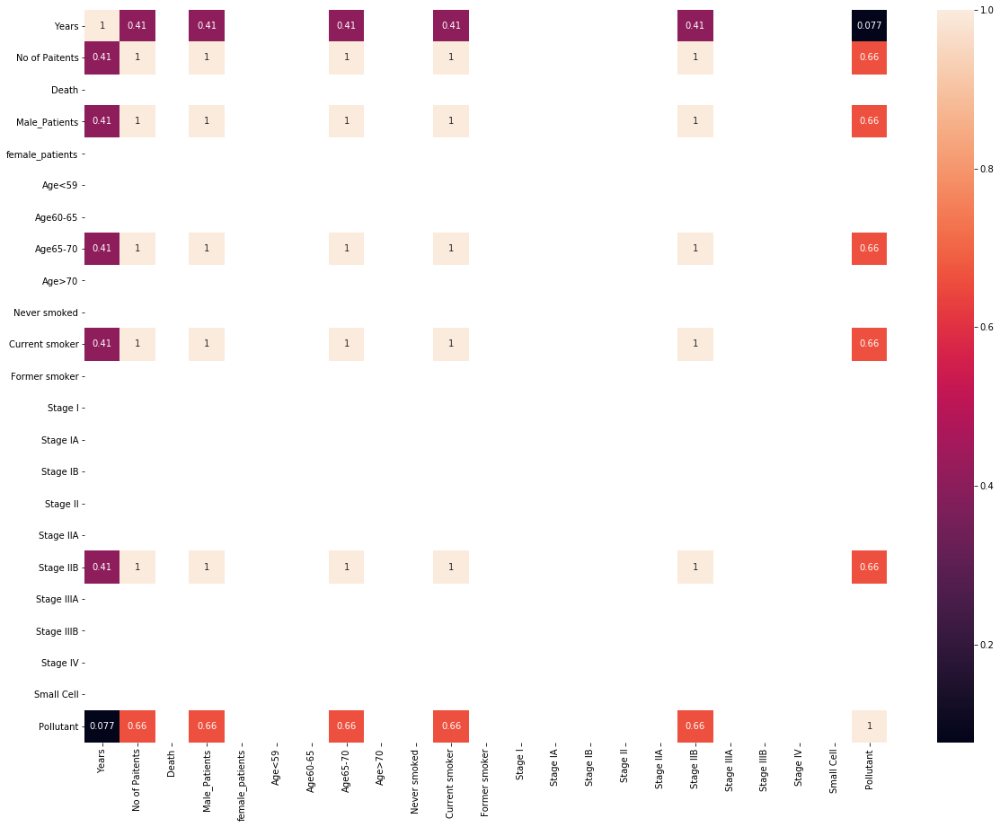

State : VT
Pollutant : NO2
Status : 
Data Not available!!
State : VT
Pollutant : SO2
Status : 
Data Not available!!
State : WA
Pollutant : O3
Status : 
Group(k) : 53


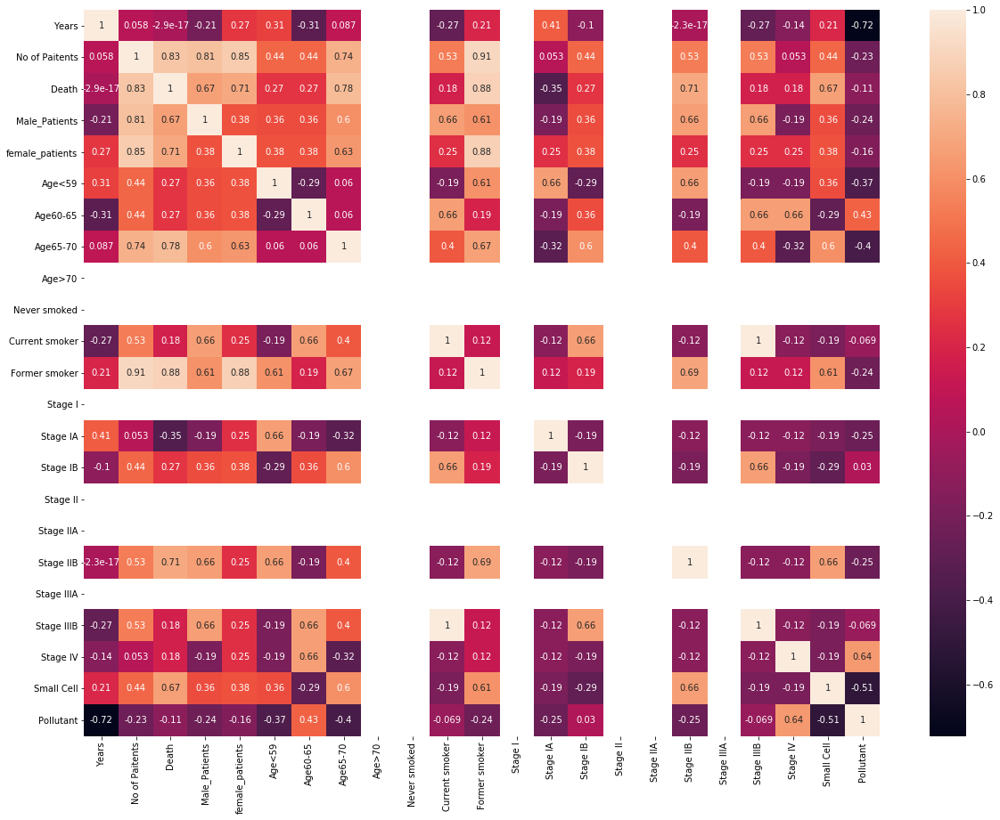

State : WA
Pollutant : PM2.5
Status : 
Data Not available!!
State : WA
Pollutant : PM10
Status : 
Data Not available!!
State : WA
Pollutant : Pb
Status : 
Data Not available!!
State : WA
Pollutant : CO
Status : 
Group(k) : 53


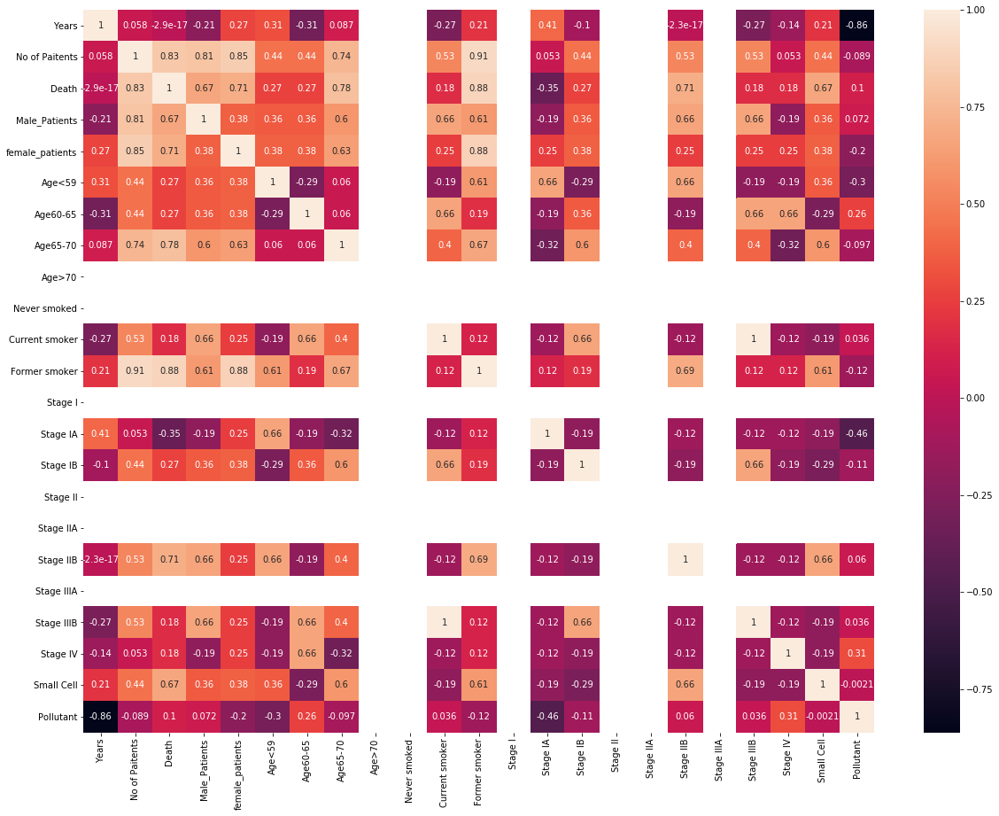

State : WA
Pollutant : NO2
Status : 
Data Not available!!
State : WA
Pollutant : SO2
Status : 
Data Not available!!
State : WI
Pollutant : O3
Status : 
Group(k) : 55


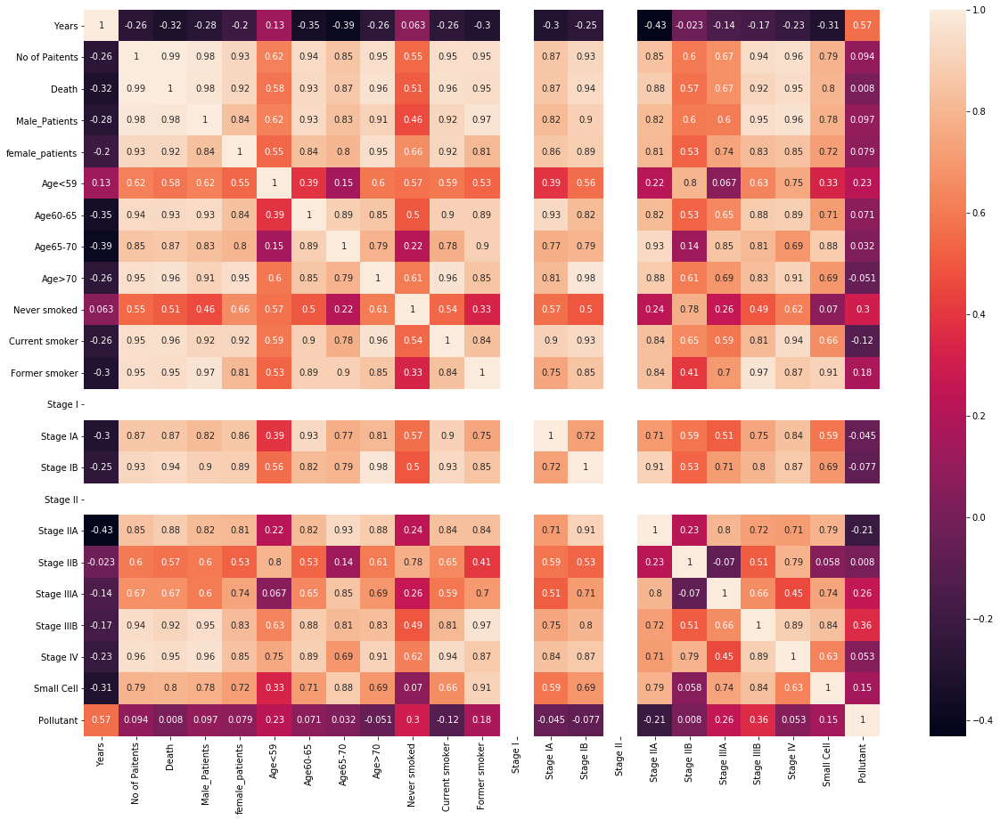

State : WI
Pollutant : PM2.5
Status : 
Data Not available!!
State : WI
Pollutant : PM10
Status : 
Group(k) : 55


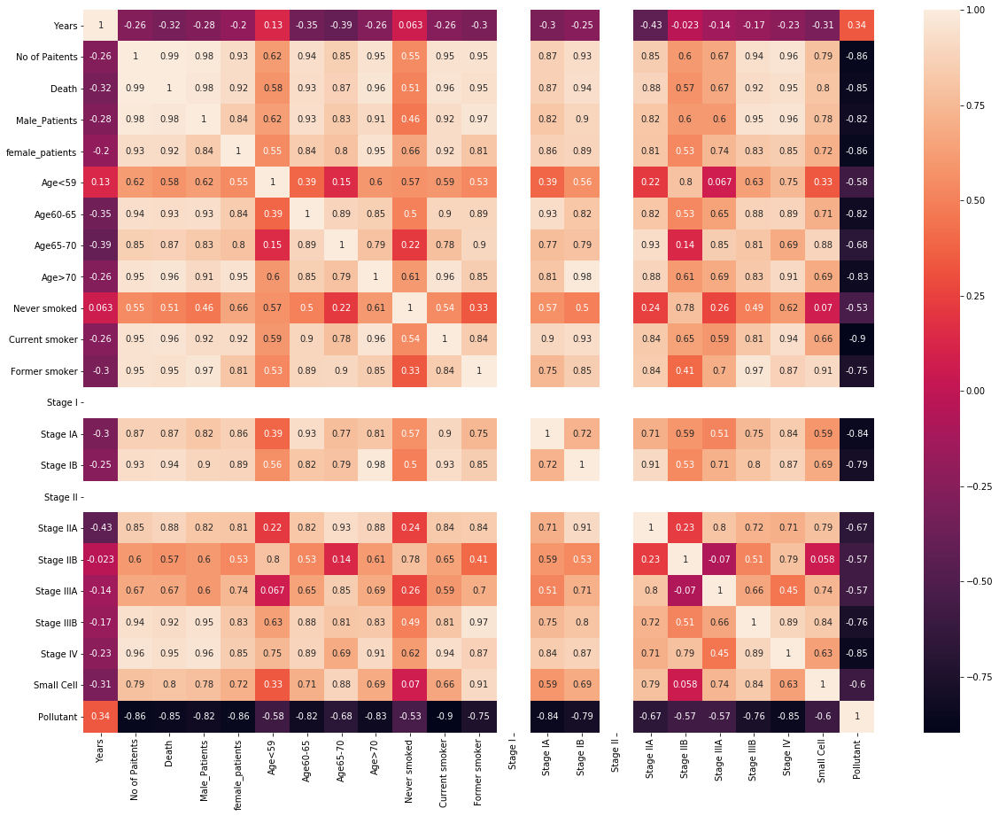

State : WI
Pollutant : Pb
Status : 
Data Not available!!
State : WI
Pollutant : CO
Status : 
Data Not available!!
State : WI
Pollutant : NO2
Status : 
Data Not available!!
State : WI
Pollutant : SO2
Status : 
Data Not available!!
State : WV
Pollutant : O3
Status : 
Data Not available!!
State : WV
Pollutant : PM2.5
Status : 
Data Not available!!
State : WV
Pollutant : PM10
Status : 
Data Not available!!
State : WV
Pollutant : Pb
Status : 
Data Not available!!
State : WV
Pollutant : CO
Status : 
Inconsisstent Info!!
State : WV
Pollutant : NO2
Status : 
Data Not available!!
State : WV
Pollutant : SO2
Status : 
Data Not available!!
State : WY
Pollutant : O3
Status : 
Data Not available!!
State : WY
Pollutant : PM2.5
Status : 
Data Not available!!
State : WY
Pollutant : PM10
Status : 
Group(k) : 56


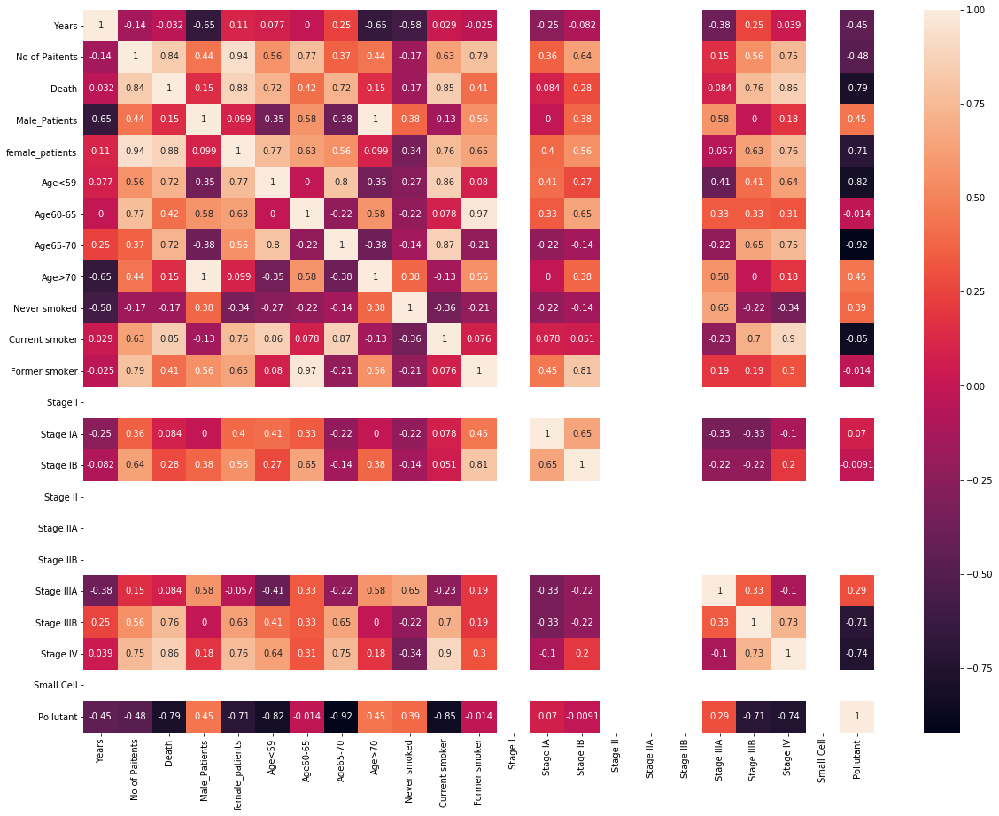

State : WY
Pollutant : Pb
Status : 
Data Not available!!
State : WY
Pollutant : CO
Status : 
Data Not available!!
State : WY
Pollutant : NO2
Status : 
Data Not available!!
State : WY
Pollutant : SO2
Status : 
Data Not available!!


In [15]:

for st in states:
    
    for poll in poll_list:
        
        print("State : " + str(st) )
        print("Pollutant : " + str(poll))
        print("Status : ")
        city_pollution_data = pol_data(poll,st,plot=True)
        if city_pollution_data.shape[0] == 0:
            print("Data Not available!!")
            continue
        if city_pollution_data is not None and city_pollution_data.shape[0]>1:
            city_pollution_data  = max_pop_city(city_pollution_data ,st ,population_data)   
            
        if city_pollution_data.shape[0]==0:
            print("Data Not available!!")
            continue
        city12 = data.groupby('state')
        k=-1
        if st in state_dict.keys():
            k = get_key(state_dict[st])
        if k ==-1 or k is None:
            print("Inconsisstent Info!!")
            continue
        print("Group(k) : " + str(k))
        
        state12 = city12.get_group(k)


        arr = state12[['rndyear','confirmed_lung']]

        x = state12['rndyear'].unique()

        pt_numbers = {}
        for i in range(len(x)):
            pt_numbers[x[i]] = 0

        arr = np.asarray(arr)
        for i in range(len(arr)):
            if arr[i][1] == 1.0:
                pt_numbers[arr[i][0]]+=1

        import pandas as pd
        df = pd.DataFrame.from_dict(pt_numbers, orient='index',columns=['No of Paitents'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df = df.sort_index(ascending=True)
        df.insert(0, 'Years', range(1993, 1993 + len(df)))
        
    
        city_pollution_data = city_pollution_data.drop('index', axis = 1)
        city_pollution_data = city_pollution_data.drop('Core Based Statistical Area', axis = 1)
        city_pollution_data = city_pollution_data.drop('Pollutant', axis = 1)

        city_pollution_data = city_pollution_data.T
        city_pollution_data = city_pollution_data.rename(columns={city_pollution_data.columns[0]: "Pollutant"})
        city_pollution_data = city_pollution_data.reset_index(drop=True)
        #df = df.reset_index(drop=True)
        #df = df.join(city_pollution_data)
        #print(df)
        
        state12 = state12.drop('dcf_dthl', axis = 1)
        state12 = state12.drop('nlst_flag', axis = 1)
        state12 = state12.drop('reasfolll', axis = 1)
        state12 = state12.drop('reassympl', axis = 1)
        state12 = state12.drop('reassurvl', axis = 1)
        state12 = state12.drop('reasothl', axis = 1)
        state12 = state12.drop('biopllink0', axis = 1)
        state12 = state12.drop('biopllink1', axis = 1)
        state12 = state12.drop('biopllink2', axis = 1)
        state12 = state12.drop('biopllink3', axis = 1)
        state12 = state12.drop('hasdel0', axis = 1)
        state12 = state12.drop('hasdel1', axis = 1)
        state12 = state12.drop('hasdel2', axis = 1)
        state12 = state12.drop('hasdel3', axis = 1)
        state12 = state12.drop('lung_mra_stat0', axis = 1)
        state12 = state12.drop('lung_mra_stat1', axis = 1)
        state12 = state12.drop('lung_mra_stat2', axis = 1)
        state12 = state12.drop('lung_mra_stat3', axis = 1)
        state12 = state12.drop('xry_days0', axis = 1)
        state12 = state12.drop('xry_days1', axis = 1)
        state12 = state12.drop('xry_days2', axis = 1)
        state12 = state12.drop('xry_days3', axis = 1)
        state12 = state12.drop('xry_prot', axis = 1)
        state12 = state12.drop('has_unattrib', axis = 1)
        state12 = state12.drop('has_xry_img_0', axis = 1)
        state12 = state12.drop('has_xry_img_1', axis = 1)
        state12 = state12.drop('has_xry_img_2', axis = 1)
        state12 = state12.drop('has_xry_img_3', axis = 1)
        state12 = state12.drop('inci_last_contact_days', axis = 1)
        state12 = state12.drop('inci_last_contact_stat', axis = 1)
        state12 = state12.drop('has_nrf', axis = 1)
        state12 = state12.drop('nrf_days', axis = 1)
        state12 = state12.drop('nrf_reason', axis = 1)
        #state12 = state12.drop('plco_id', axis = 1)
        state12 = state12.drop('build', axis = 1)
        state12 = state12.drop('arm', axis = 1)
        state12 = state12.drop('center', axis = 1)
        state12 = state12.drop('dual', axis = 1)
        state12 = state12.drop('primary_trtl_NSC', axis = 1)
        state12 = state12.drop('primary_trtl_small', axis = 1)
        state12 = state12.drop('curative_chemol', axis = 1)
        state12 = state12.drop('curative_pneuml', axis = 1)
        state12 = state12.drop('curative_radl', axis = 1)
        state12 = state12.drop('curative_wsll', axis = 1)
        state12 = state12.drop('neoadjuvantl', axis = 1)
        state12 = state12.drop('link_timing_0', axis = 1)
        state12 = state12.drop('link_timing_1', axis = 1)
        state12 = state12.drop('link_timing_2', axis = 1)
        state12 = state12.drop('link_timing_3', axis = 1)
        state12 = state12.drop('bq_adminm', axis = 1)
        state12 = state12.drop('race7', axis = 1)
        state12 = state12.drop('hispanic_f', axis = 1)
        state12 = state12.drop('educat', axis = 1)
        state12 = state12.drop('marital', axis = 1)
        state12 = state12.drop('occupat', axis = 1)
        state12 = state12.drop('brothers', axis = 1)
        state12 = state12.drop('sisters', axis = 1)

        arr1 = state12[['rndyear','f_dthl']]
        x1 = state12['rndyear'].unique()
        pt_no = {}
        for i in range(len(x1)):
            pt_no[x1[i]] = 0

        arr1 = np.asarray(arr1)
        for i in range(len(arr1)):
            if arr1[i][1] == 1.0:
                pt_no[arr1[i][0]]+=1

        df1 = pd.DataFrame.from_dict(pt_no, orient='index',columns=['Death'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df1 = df1.sort_index(ascending=True)
        df1.insert(0, 'Years', range(1993, 1993 + len(df1)))
        Death = df1["Death"]
        df = df.join(Death)

        #corrMatrix1 = df.corr(method = 'pearson')
        #sn.heatmap(corrMatrix1, annot=True)

        #plt.show()
        arr = state12[['rndyear','confirmed_lung','sex']]

        arr.drop(arr.loc[arr['confirmed_lung']==0].index, inplace = True)
        arr['rndyear'].unique()

        arr_m = arr.loc[arr['sex'] == 1]
        arr_f = arr.loc[arr['sex'] == 2]

        arr_m = arr_m.drop(['confirmed_lung'],axis=1)
        arr_f = arr_f.drop(['confirmed_lung'],axis=1)

        arr_m = np.asarray(arr_m)

        mpt = {}

        for i in range (len(x1)):
            mpt[x1[i]] = 0

        for ix in range(arr_m.shape[0]):
            mpt[arr_m[ix][0]] += 1 
        #print(mpt)

        df2 = pd.DataFrame.from_dict(mpt, orient='index',columns=['Male_Patients'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df2 = df2.sort_index(ascending=True)
        df2.insert(0, 'Years', range(1993, 1993 + len(df2)))

        Male_Patients = df2["Male_Patients"]
        df = df.join(Male_Patients)

        mpt = np.asarray(df['Male_Patients'])
        pt = np.asarray(df['No of Paitents'])

        fpt = pt - mpt
        fpt = pd.DataFrame(fpt)
        fpt = fpt.rename(columns={fpt.columns[0]: "female_patients"})
        fpt = fpt.reset_index(drop=True)

        df = df.join(fpt)
        df['female_patients'] = fpt['female_patients'].values
        arr = state12[['rndyear','confirmed_lung','agelevel']]
        arr.drop(arr.loc[arr['confirmed_lung']==0].index, inplace = True)
        arr['rndyear'].unique()
        arr_a = arr.loc[arr['agelevel'] == 0]
        arr_b = arr.loc[arr['agelevel'] == 1]
        arr_c = arr.loc[arr['agelevel'] == 2]
        arr_d = arr.loc[arr['agelevel'] == 3]
        arr_a = arr_a.drop(['confirmed_lung'],axis=1)
        arr_b = arr_b.drop(['confirmed_lung'],axis=1)
        arr_c = arr_c.drop(['confirmed_lung'],axis=1)
        arr_d = arr_d.drop(['confirmed_lung'],axis=1)
        arr_a = np.asarray(arr_a)
        apt = {}

        for i in range (len(x1)):
            apt[x1[i]] = 0

        for ix in range(arr_a.shape[0]):
            apt[arr_a[ix][0]] += 1 
        #print(apt)

        df3 = pd.DataFrame.from_dict(apt, orient='index',columns=['Age<59'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df3 = df3.sort_index(ascending=True)
        df3.insert(0, 'Years', range(1993, 1993 + len(df3)))

        arr_b = np.asarray(arr_b)

        bpt = {}

        for i in range (len(x1)):
            bpt[x1[i]] = 0

        for ix in range(arr_b.shape[0]):
            bpt[arr_b[ix][0]] += 1 
        #print(bpt)

        df4 = pd.DataFrame.from_dict(bpt, orient='index',columns=['Age60-65'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df4 = df4.sort_index(ascending=True)
        df4.insert(0, 'Years', range(1993, 1993 + len(df4)))

        arr_c = np.asarray(arr_c)
        arr_d = np.asarray(arr_d)

        cpt = {}

        for i in range (len(x1)):
            cpt[x1[i]] = 0

        for ix in range(arr_c.shape[0]):
            cpt[arr_c[ix][0]] += 1 
        #print(cpt)

        dpt = {}

        for i in range (len(x1)):
            dpt[x1[i]] = 0

        for ix in range(arr_d.shape[0]):
            dpt[arr_d[ix][0]] += 1 
        #print(dpt)

        df6 = pd.DataFrame.from_dict(cpt, orient='index',columns=['Age65-70'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df6 = df6.sort_index(ascending=True)
        df6.insert(0, 'Years', range(1993, 1993 + len(df6)))

        df7 = pd.DataFrame.from_dict(dpt, orient='index',columns=['Age>70'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df7 = df7.sort_index(ascending=True)
        df7.insert(0, 'Years', range(1993, 1993 + len(df7)))

        Age59 = df3["Age<59"]
        df = df.join(Age59)

        Age60 = df4["Age60-65"]
        df = df.join(Age60)
        Age65 = df6["Age65-70"]
        df = df.join(Age65)
        Age70 = df7["Age>70"]
        df = df.join(Age70)
        age = Age59+Age60+Age65+Age70




        arr = state12[['rndyear','confirmed_lung','cig_stat']]
        arr.drop(arr.loc[arr['confirmed_lung']==0].index, inplace = True)
        arr['rndyear'].unique()
        arr_sa = arr.loc[arr['cig_stat'] == 0]
        arr_sb = arr.loc[arr['cig_stat'] == 1]
        arr_sc = arr.loc[arr['cig_stat'] == 2]


        # In[538]:


        arr_sa = arr_sa.drop(['confirmed_lung'],axis=1)
        arr_sb = arr_sb.drop(['confirmed_lung'],axis=1)
        arr_sc = arr_sc.drop(['confirmed_lung'],axis=1)


        # In[539]:


        arr_sa = np.asarray(arr_sa)
        arr_sb = np.asarray(arr_sb)
        arr_sc = np.asarray(arr_sc)


        # In[540]:


        sapt = {}

        for i in range (len(x1)):
            sapt[x1[i]] = 0

        for ix in range(arr_sa.shape[0]):
            sapt[arr_sa[ix][0]] += 1 
        #print(sapt)

        sbpt = {}

        for i in range (len(x1)):
            sbpt[x1[i]] = 0

        for ix in range(arr_sb.shape[0]):
            sbpt[arr_sb[ix][0]] += 1 
        #print(sbpt)

        scpt = {}

        for i in range (len(x1)):
            scpt[x1[i]] = 0

        for ix in range(arr_sc.shape[0]):
            scpt[arr_sc[ix][0]] += 1 
        #print(scpt)


        # In[541]:


        df8 = pd.DataFrame.from_dict(sapt, orient='index',columns=['Never smoked'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df8 = df8.sort_index(ascending=True)
        df8.insert(0, 'Years', range(1993, 1993 + len(df8)))

        df9 = pd.DataFrame.from_dict(sbpt, orient='index',columns=['Current smoker'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df9 = df9.sort_index(ascending=True)
        df9.insert(0, 'Years', range(1993, 1993 + len(df9)))

        df10 = pd.DataFrame.from_dict(scpt, orient='index',columns=['Former smoker'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df10 = df10.sort_index(ascending=True)
        df10.insert(0, 'Years', range(1993, 1993 + len(df10)))


        # In[542]:


        NS = df8["Never smoked"]
        df = df.join(NS)


        # In[543]:


        CS = df9["Current smoker"]
        df = df.join(CS)


        # In[544]:


        FS = df10["Former smoker"]
        df = df.join(FS)

        arr = state12[['rndyear','confirmed_lung','lung_stage']]
        arr.drop(arr.loc[arr['confirmed_lung']==0].index, inplace = True)
        arr['rndyear'].unique()
        arr_la = arr.loc[arr['lung_stage'] == 1]
        arr_lb = arr.loc[arr['lung_stage'] == 2]
        arr_lc = arr.loc[arr['lung_stage'] == 3]
        arr_ld = arr.loc[arr['lung_stage'] == 4]
        arr_le = arr.loc[arr['lung_stage'] == 5]
        arr_lf = arr.loc[arr['lung_stage'] == 6]
        arr_lg = arr.loc[arr['lung_stage'] == 7]
        arr_lh = arr.loc[arr['lung_stage'] == 8]
        arr_li = arr.loc[arr['lung_stage'] == 9]
        arr_lj = arr.loc[arr['lung_stage'] == 93]


        # In[548]:


        arr_la = arr_la.drop(['confirmed_lung'],axis=1)
        arr_lb = arr_lb.drop(['confirmed_lung'],axis=1)
        arr_lc = arr_lc.drop(['confirmed_lung'],axis=1)
        arr_ld = arr_ld.drop(['confirmed_lung'],axis=1)
        arr_le = arr_le.drop(['confirmed_lung'],axis=1)
        arr_lf = arr_lf.drop(['confirmed_lung'],axis=1)
        arr_lg = arr_lg.drop(['confirmed_lung'],axis=1)
        arr_lh = arr_lh.drop(['confirmed_lung'],axis=1)
        arr_li = arr_li.drop(['confirmed_lung'],axis=1)
        arr_lj = arr_lj.drop(['confirmed_lung'],axis=1)


        # In[549]:


        arr_la = np.asarray(arr_la)
        arr_lb = np.asarray(arr_lb)
        arr_lc = np.asarray(arr_lc)
        arr_ld = np.asarray(arr_ld)
        arr_le = np.asarray(arr_le)
        arr_lf = np.asarray(arr_lf)
        arr_lg = np.asarray(arr_lg)
        arr_lh = np.asarray(arr_lh)
        arr_li = np.asarray(arr_li)
        arr_lj = np.asarray(arr_lj)


        # In[550]:


        lapt = {}

        for i in range (len(x1)):
            lapt[x1[i]] = 0

        for ix in range(arr_la.shape[0]):
            lapt[arr_la[ix][0]] += 1 
        #print(lapt)

        lbpt = {}

        for i in range (len(x1)):
            lbpt[x1[i]] = 0

        for ix in range(arr_lb.shape[0]):
            lbpt[arr_lb[ix][0]] += 1 
        #print(lbpt)

        lcpt = {}

        for i in range (len(x1)):
            lcpt[x1[i]] = 0

        for ix in range(arr_lc.shape[0]):
            lcpt[arr_lc[ix][0]] += 1 
        #print(lcpt)

        ldpt = {}

        for i in range (len(x1)):
            ldpt[x1[i]] = 0

        for ix in range(arr_ld.shape[0]):
            ldpt[arr_ld[ix][0]] += 1 
        #print(ldpt)

        lept = {}

        for i in range (len(x1)):
            lept[x1[i]] = 0

        for ix in range(arr_le.shape[0]):
            lept[arr_le[ix][0]] += 1 
        #print(lept)

        lfpt = {}

        for i in range (len(x1)):
            lfpt[x1[i]] = 0

        for ix in range(arr_lf.shape[0]):
            lfpt[arr_lf[ix][0]] += 1 
        #print(lfpt)

        lgpt = {}

        for i in range (len(x1)):
            lgpt[x1[i]] = 0

        for ix in range(arr_lg.shape[0]):
            lgpt[arr_lg[ix][0]] += 1 
        #print(lgpt)

        lhpt = {}

        for i in range (len(x1)):
            lhpt[x1[i]] = 0

        for ix in range(arr_lh.shape[0]):
            lhpt[arr_lh[ix][0]] += 1 
        #print(lhpt)

        lipt = {}

        for i in range (len(x1)):
            lipt[x1[i]] = 0

        for ix in range(arr_li.shape[0]):
            lipt[arr_li[ix][0]] += 1 
        #print(lipt)

        ljpt = {}

        for i in range (len(x1)):
            ljpt[x1[i]] = 0

        for ix in range(arr_lj.shape[0]):
            ljpt[arr_lj[ix][0]] += 1 
        #print(ljpt)


        # In[551]:


        df11 = pd.DataFrame.from_dict(lapt, orient='index',columns=['Stage I'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df11 = df11.sort_index(ascending=True)
        df11.insert(0, 'Years', range(1993, 1993 + len(df11)))

        df12 = pd.DataFrame.from_dict(lbpt, orient='index',columns=['Stage IA'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df12 = df12.sort_index(ascending=True)
        df12.insert(0, 'Years', range(1993, 1993 + len(df12)))

        df13 = pd.DataFrame.from_dict(lcpt, orient='index',columns=['Stage IB'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df13 = df13.sort_index(ascending=True)
        df13.insert(0, 'Years', range(1993, 1993 + len(df13)))

        df14 = pd.DataFrame.from_dict(ldpt, orient='index',columns=['Stage II'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df14 = df14.sort_index(ascending=True)
        df14.insert(0, 'Years', range(1993, 1993 + len(df14)))

        df15 = pd.DataFrame.from_dict(lept, orient='index',columns=['Stage IIA'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df15 = df15.sort_index(ascending=True)
        df15.insert(0, 'Years', range(1993, 1993 + len(df15)))

        df16 = pd.DataFrame.from_dict(lfpt, orient='index',columns=['Stage IIB'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df16 = df16.sort_index(ascending=True)
        df16.insert(0, 'Years', range(1993, 1993 + len(df16)))

        df17 = pd.DataFrame.from_dict(lgpt, orient='index',columns=['Stage IIIA'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df17 = df17.sort_index(ascending=True)
        df17.insert(0, 'Years', range(1993, 1993 + len(df17)))

        df18 = pd.DataFrame.from_dict(lhpt, orient='index',columns=['Stage IIIB'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df18 = df18.sort_index(ascending=True)
        df18.insert(0, 'Years', range(1993, 1993 + len(df18)))

        df19 = pd.DataFrame.from_dict(lipt, orient='index',columns=['Stage IV'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df19 = df19.sort_index(ascending=True)
        df19.insert(0, 'Years', range(1993, 1993 + len(df19)))

        df20 = pd.DataFrame.from_dict(ljpt, orient='index',columns=['Small Cell'])
        #df = df.reindex(['1993.0', '1994.0', '1995.0', '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0'])
        df20 = df20.sort_index(ascending=True)
        df20.insert(0, 'Years', range(1993, 1993 + len(df20)))


        # In[552]:


        LA = df11["Stage I"]
        df = df.join(LA)


        # In[553]:


        LB = df12["Stage IA"]
        df = df.join(LB)


        # In[554]:


        LC = df13["Stage IB"]
        df = df.join(LC)


        # In[555]:


        LD = df14["Stage II"]
        df = df.join(LD)


        # In[556]:


        LE = df15["Stage IIA"]
        df = df.join(LE)


        # In[557]:


        LF = df16["Stage IIB"]
        df = df.join(LF)


        # In[558]:


        LG = df17["Stage IIIA"]
        df = df.join(LG)


        # In[559]:


        LH = df18["Stage IIIB"]
        df = df.join(LH)


        # In[560]:


        LI = df19["Stage IV"]
        df = df.join(LI)


        # In[561]:


        LJ = df20["Small Cell"]
        df = df.join(LJ)
        df = df.reset_index(drop=True)
        df = df.join(city_pollution_data)
        
        import seaborn as sn
        corrMatrix4 = df.corr(method = 'pearson')
        plt.subplots(figsize=(20,15))
        sn.heatmap(corrMatrix4, annot=True)
        plt.show()


In [ ]:
city_pollution_data = pol_data('O3','OH',plot = True)


if city_pollution_data is not None and city_pollution_data.shape[0]>1:
    city_pollution_data  = max_pop_city(city_pollution_data ,'OH',population_data)
    
print(city_pollution_data)

In [ ]:
city_pollution_data = city_pollution_data.drop('index', axis = 1)
city_pollution_data = city_pollution_data.drop('Core Based Statistical Area', axis = 1)
city_pollution_data = city_pollution_data.drop('Pollutant', axis = 1)

city_pollution_data = city_pollution_data.T
city_pollution_data = city_pollution_data.rename(columns={city_pollution_data.columns[0]: "Pollutant"})
city_pollution_data = city_pollution_data.reset_index(drop=True)

In [ ]:
city_pollution_data